### DocExtractor

In [1]:
import cv2
import cv2 as cv
import imutils
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F

In [2]:
# Add code to sys.path
import matplotlib.pyplot as plt 

import sys
sys.path.append('../src')

# Display
from IPython.display import display, HTML

display(HTML("<style>.container { width:95% !important; }</style>"))

In [3]:
import torch
from models import load_model_from_path
from utils import coerce_to_path_and_check_exist
from utils.path import MODELS_PATH
from utils.constant import MODEL_FILE
from PIL import Image
import numpy as np
from utils.image import resize

In [4]:
from utils.constant import LABEL_TO_COLOR_MAPPING
from utils.image import LabeledArray2Image

In [5]:
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device('cpu')


In [6]:
TAG = 'default'
model_path = coerce_to_path_and_check_exist(MODELS_PATH / TAG / MODEL_FILE)
model_extractor, (img_size, restricted_labels, normalize) = load_model_from_path(model_path, device=device, attributes_to_return=['train_resolution', 'restricted_labels', 'normalize'])
_ = model_extractor.eval()


restricted_colors = [LABEL_TO_COLOR_MAPPING[l] for l in restricted_labels]
label_idx_color_mapping = {restricted_labels.index(l) + 1: c for l, c in zip(restricted_labels, restricted_colors)}


[2022-07-19 18:01:33] Model res_unet18 initialisated with norm_layer=InstanceNorm2d({'momentum': 0.1, 'affine': True, 'track_running_stats': False}) and kwargs {'encoder_name': 'resnet18', 'reduced_layers': False, 'no_maxpool': False, 'conv_as_maxpool': True, 'use_deconv': True, 'use_upcatconv': False, 'use_conv1x1': False, 'pretrained_encoder': False}


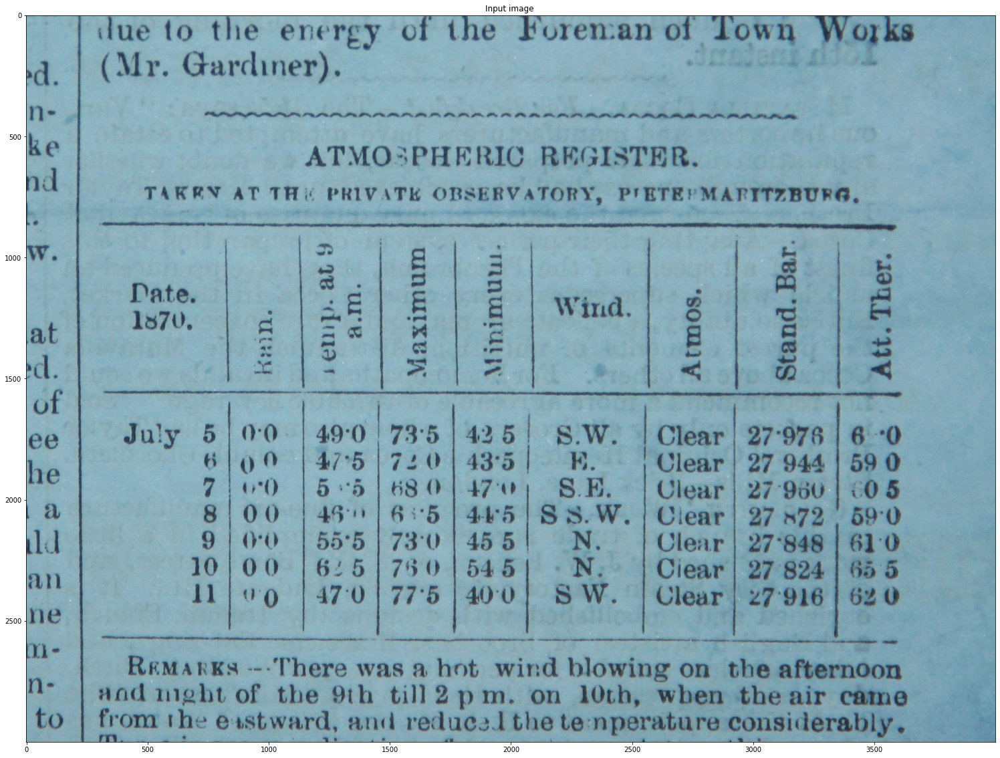

In [8]:
filename = 118
img_path = f'/data/glosat/Code-Git/docformer/dataset/Finetuning/test/images/{filename}.jpg'

img = cv.imread(img_path)

plt.rcParams["figure.figsize"] = (30,20)
plt.imshow(img)
plt.title('Input image ')
plt.show()

In [9]:
def thresholding(image):
    return cv.threshold(image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)[1]

def image_preprocessing(img):
#     img = cv.resize(img, (800,1200), interpolation = cv.INTER_AREA)
    #Binarization
    img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Do dilation and erosion to eliminate unwanted noises
    kernel = np.ones((1,1), np.uint8)
    img = cv.dilate(img, kernel, iterations=30)
    img = cv.erode(img, kernel, iterations=30)

    #thresholding
    img = thresholding(img)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    w,h,c = img.shape
    
    return img,h,w,c


In [10]:
def find_text_region(img, label_idx_color_mapping):
    
    print(f'Save preprocessed image')
    im_pil = Image.fromarray(img)
    im_pil.save(f"temp.jpg")
    
    # Normalize and convert to Tensor
    inp = np.array(img, dtype=np.float32) / 255
    if normalize:
        inp = ((inp - inp.mean(axis=(0, 1))) / (inp.std(axis=(0, 1)) + 10**-7))
    inp = torch.from_numpy(inp.transpose(2, 0, 1)).float().to(device)

    # compute prediction
    pred = model_extractor(inp.reshape(1, *inp.shape))[0].max(0)[1].cpu().numpy()

    # Retrieve good color mapping and transform to image
    pred_img = LabeledArray2Image.convert(pred, label_idx_color_mapping)

    # Blend predictions with original image    
    mask = Image.fromarray((np.array(pred_img) == (0, 0, 0)).all(axis=-1).astype(np.uint8) * 127 + 128)
    blend_img = Image.composite(im_pil, pred_img, mask)
    
    mask = torch.from_numpy(pred)
    mask = mask.unsqueeze(0)

    # We get the unique colors, as these would be the object ids.
    obj_ids = torch.unique(mask)

    # first id is the background, so remove it.
    obj_ids = obj_ids[1:]

    # split the color-encoded mask into a set of boolean masks.
    # Note that this snippet would work as well if the masks were float values instead of ints.
    masks = mask == obj_ids[:, None, None]

    return masks, blend_img 

In [11]:
img, h, w, c = image_preprocessing(img)
masks, blend_img = find_text_region(img, label_idx_color_mapping)

blend_img.save(f'{filename}_text_region.jpg')

Save preprocessed image


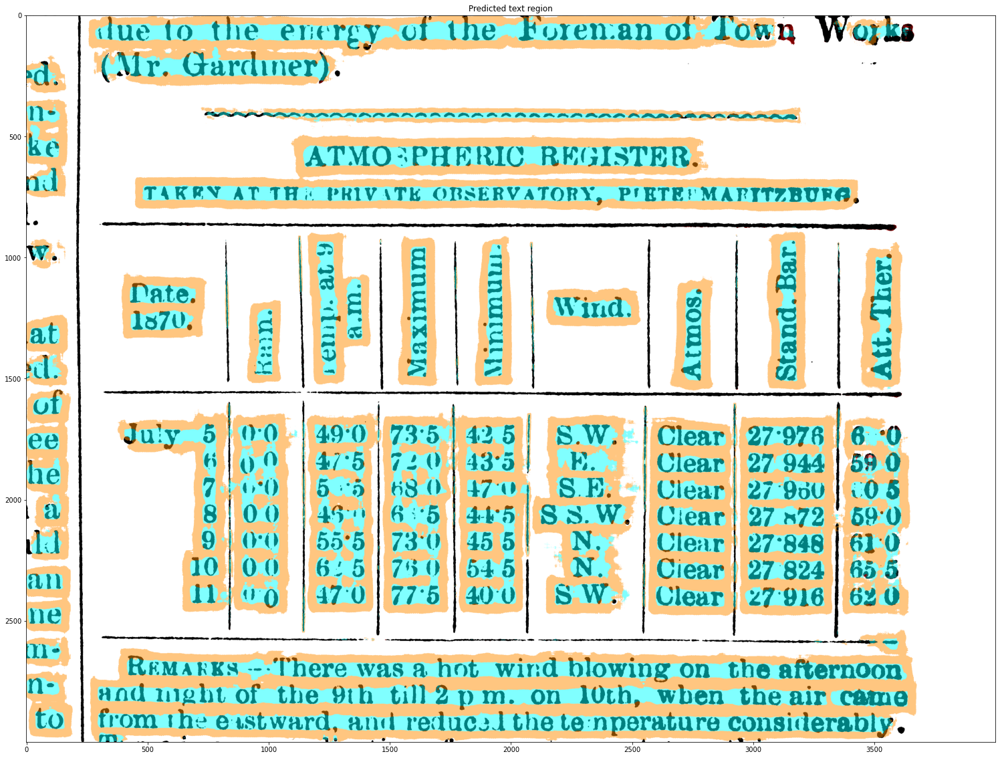

In [12]:
plt.rcParams["figure.figsize"] = (30,20)
plt.imshow(blend_img)
plt.title('Predicted text region')
plt.show()

### Intern code

In [13]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv
import cv2 as cv
import collections

In [14]:
import dla.src.table_structure_analysis as tsa
import dla.src.xml_utils as xml_utils
from dla.src.image_utils import put_box, put_line
import pytesseract
import numpy as np

In [15]:
config_file = '/data/glosat/glosat_table_dataset/dla/config/cascadeRCNN.py'
# download the checkpoint from model zoo and put it in `checkpoints/`

table_checkpoint_file = '/data/glosat/glosat_table_dataset/models/model_fulltables_only_GloSAT.pth'
# table_checkpoint_file = '/data/glosat/glosat_table_dataset/models/model_tables_enchanced_GloSAT.pth'

cell_checkpoint_file = '/data/glosat/glosat_table_dataset/models/model_coarsecell_GloSAT.pth'

In [16]:
THRESHOLD = 0.5
CLASSES = ("table_body","cell","full_table","header","heading")

In [17]:
model = init_detector(config_file, table_checkpoint_file, device='cuda:0')

/data/glosat/glosat_table_dataset/mmdetection/mmdet/apis/inference.py:40: UserWarning: Class names are not saved in the checkpoint's meta data, use COCO classes by default.
  warnings.warn('Class names are not saved in the checkpoint\'s '


In [18]:
cell_model = init_detector(config_file, cell_checkpoint_file, device='cuda:0')

### Cell classification

In [19]:
def detect_cell_pretrained(cell_model,img):
    result = inference_detector(cell_model, img)
    return result[CLASSES.index("cell")].tolist()

In [20]:
cells_by_image = collections.defaultdict(list)
cells_by_image[filename] = detect_cell_pretrained(cell_model,img)

/home/gyanendro/.local/lib/python3.7/site-packages/torch/nn/functional.py:2506: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode))


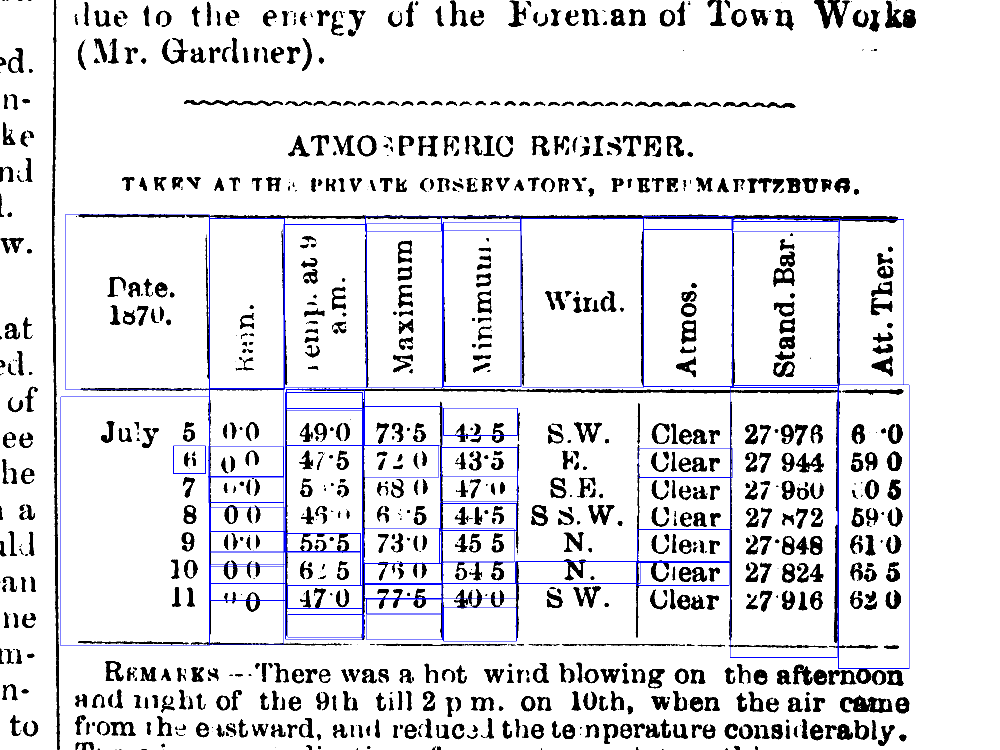

In [21]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)


for box in cells_by_image[filename]:
    put_box(image,box,(0,0,255))

im_pil = Image.fromarray(image)
# im_pil.save("temp_intern.jpg")
im_pil

### Table detection

In [22]:
def detect_table_region(model,image):
    result = inference_detector(model,image)
    #Process table headings
    headings = []
    for box in result[CLASSES.index("heading")]:
        if box[4]>THRESHOLD :
            headings.append(box[0:4])

    #Process table headers
    headers = []
    for box in result[CLASSES.index("header")]:
        if box[4]>THRESHOLD :
            headers.append(box[0:4])

    #Process table bodies
    tables = []
    for box in result[CLASSES.index("table_body")]:
        if box[4]>THRESHOLD :
            tables.append(box[0:4])

    full_tables = []
    for box in result[CLASSES.index("full_table")]:
        if box[4]>THRESHOLD :
            full_tables.append(box[0:4])
            if all(tsa.how_much_contained(table,box)<0.5 for table in tables):
                tables.append(box[0:4])
                
    for table in tables:
        if all(tsa.how_much_contained(table,full_table)<0.5 for full_table in full_tables):
            full_tables.append(table)
            
    return full_tables, tables

In [23]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

In [24]:
full_tables, tables = detect_table_region(model,image)

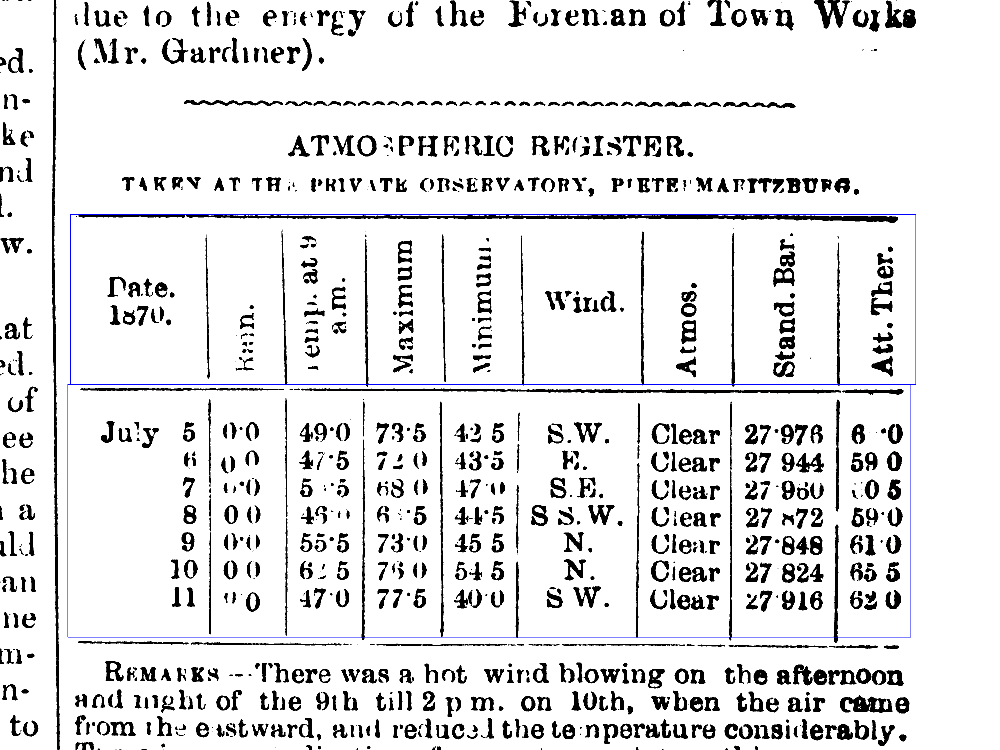

In [25]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)


for box in tables:
    put_box(image,box,(0,0,255))

im_pil = Image.fromarray(image)
# im_pil.save("temp_intern.jpg")
im_pil

### Check bounding box

In [26]:
def check_bounding_box(imagedraw,mask):
    scores = []
    count = 0
    
    key = imagedraw[1]
    for bol in mask[key,imagedraw[0]:imagedraw[2]]:  #Height
        if bol:
            count+=1
    score = count/len(mask[key,imagedraw[0]:imagedraw[2]])
    scores.append(score)
    if score<0.2: 
        top_height = True
    else:
        top_height = False
        
    count = 0
    key = imagedraw[3]
    for bol in mask[key,imagedraw[0]:imagedraw[2]]:  #Height
        if bol:
            count+=1
    score = count/len(mask[key,imagedraw[0]:imagedraw[2]])
    scores.append(score)
    if score<0.2:
        bottom_height = True
    else:
        bottom_height = False

    count = 0
    key = imagedraw[0]
    for bol in mask[imagedraw[1]:imagedraw[3],key]:  #width
        if bol:
            count+=1
    score = count/len(mask[imagedraw[1]:imagedraw[3],key])
    scores.append(score)
    if score<0.1:
        left_width = True
    else:
        left_width = False
        
    count = 0    
    key = imagedraw[2]
    for bol in mask[imagedraw[1]:imagedraw[3],key]:  #width
        if bol:
            count+=1
    score = count/len(mask[imagedraw[1]:imagedraw[3],key])
    scores.append(score)
    if score<0.1:
        right_width = True
    else:
        right_width = False
        
    return (top_height, bottom_height, left_width, right_width), scores

In [27]:
def has_object(imagedraw, image, mask):
    imagedraw = list(map(int, imagedraw))
    croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
    h, w, c = croppedimage_full.shape
    
    count = 0
    for cell_mask in mask[imagedraw[1]:imagedraw[3],imagedraw[0]:imagedraw[2]]:
        for bol in cell_mask:  
            if bol:
                count+=1
    
    if w>2 and h>2:
        if 100*(count/(w * h)) > 1:
            return True
        else:
            return False
    else:
        return False


In [28]:
def classify_single_cell(cells):    
    x = torch.IntTensor(cells)
    x = x[:,0:4]
    value, index = x[:,1].sort()

    corrected_cells = []
    exclude_cells = []
    blank_cells = []
    for idx in index:
        imagedraw = cells[idx][0:4]
        imagedraw = list(map(int, imagedraw))
#         print(imagedraw,idx)
    #     if has_object(imagedraw, image):
        boolean, scores = check_bounding_box(imagedraw,masks[1])

        if all(boolean):
            corrected_cells.append(cells[idx])
        else:
            exclude_cells.append(cells[idx])
    return corrected_cells, exclude_cells

In [29]:
ori_correct_cells, exclude_cells = classify_single_cell(cells_by_image[filename])

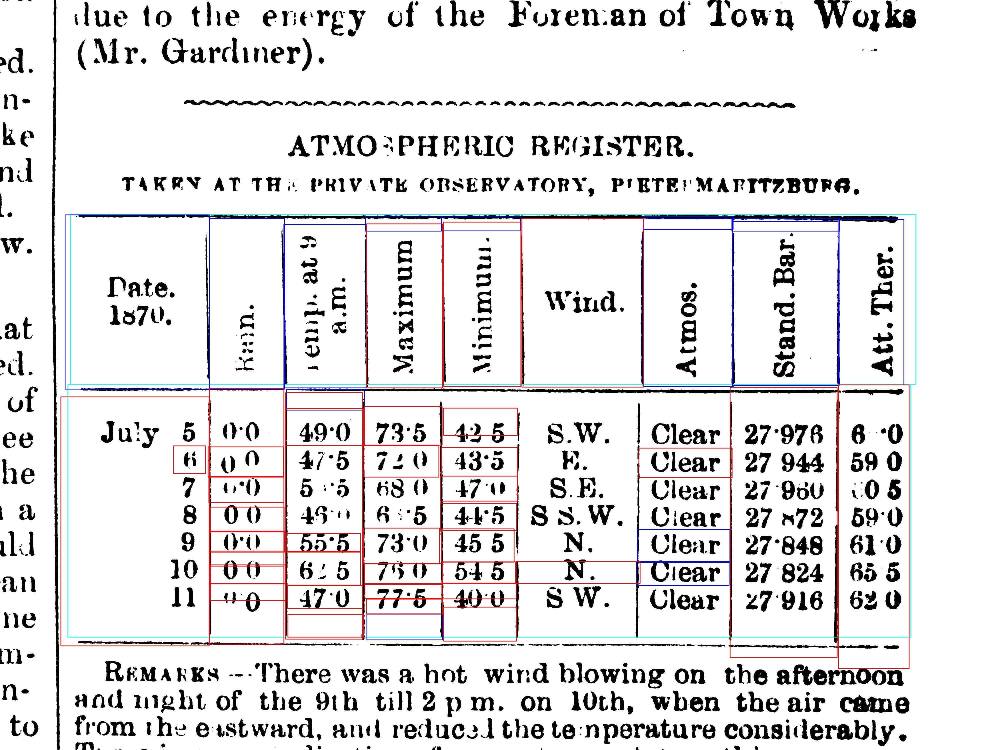

In [30]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
        
for box in ori_correct_cells:
    put_box(image,box,(0,0,color)) # Blue
    
for box in exclude_cells:
#     print(box)
    put_box(image,box,(color,0,0)) # Red

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_table_cell_classification_pretrained.jpg")
im_pil  

### Line function output

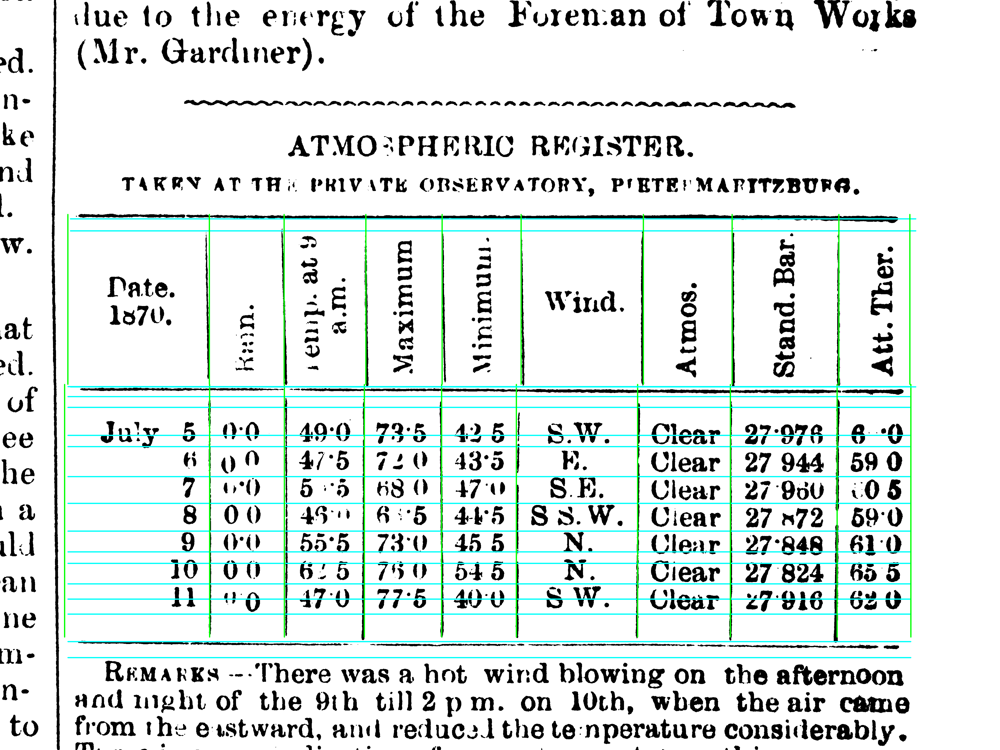

In [31]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)


#Process cells
segment_headers = False
rows_by_table = []
cols_by_table = []
full_table_by_table = []

for table in tables:
    cells = []
    coarse_cells = []

    found_fulltable = False
    for full_table in full_tables:
        if tsa.how_much_contained(table,full_table)>0.5:
            full_table_by_table.append(full_table)
            found_fulltable = True
            break

    if not found_fulltable:
        full_table_by_table.append(table)

    if cell_checkpoint_file:
        for box in cells_by_image[filename]:  #cells_by_image[img_path]: #
            cell = box[0:4]

            if box[4]>THRESHOLD:
                if tsa.how_much_contained(cell,table if not segment_headers else full_table_by_table[-1])>0.5:
                    cells.append(cell)
                    #if args.visual:
                    #    put_box(image,box,(0,0,0))

    if cells != [] or coarse_cells!=[]:
        rows, cols = tsa.reconstruct_table(cells,table if segment_headers else full_table_by_table[-1],eps=0.02)
    else:
        rows,cols = [],[]

    for row in rows:
        put_line(image,((int)(table[0]),(int)(row)),((int)(table[2]),(int)(row)),colour=(0,255,250))

    for col in cols:
        put_line(image,((int)(col),(int)(table[1])),((int)(col),(int)(table[3])),colour=(0,255,0))

    rows_by_table.append(rows)
    cols_by_table.append(cols)

    
im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_intern_Line_function_image.jpg")
im_pil

### Generate cells

In [32]:
from statistics import mean

In [33]:
def get_x_y_initial(tables, cells, THRESHOLD):   
    segment_headers =  False
    table_cells = []
    for tid, table in enumerate(tables):
        cells_x = []
        cells_y = []
        for box in cells:  #cells_by_image[img_path]: #
            cell = box[0:4] #(x0,y0,x1,y1)

            if box[4]>THRESHOLD:
                if tsa.how_much_contained(cell,table)>0.5:
                    cells_x.append(cell[0])
                    cells_x.append(cell[2])
                    cells_y.append(cell[1])
                    cells_y.append(cell[3])
                else:
                    pass
#                     print(cell,table)
        table_cells.append([cells_x, cells_y])
    return table_cells

def get_x_y(tables, cells):   
    segment_headers =  False
    table_cells = []
    for table in tables:
        cells_x = []
        cells_y = []
        for box in cells:  #cells_by_image[img_path]: #
            cell = box[0:4] #(x0,y0,x1,y1)
            
            if tsa.how_much_contained(cell,table)>0.5:
                cells_x.append(cell[0])
                cells_x.append(cell[2])
                cells_y.append(cell[1])
                cells_y.append(cell[3])
            else:
                pass
#                     print(cell,table)
        table_cells.append([cells_x, cells_y])
    return table_cells  

In [34]:
def average_list(cells):        
    x_avg = 0
    for i in cells:
        x_avg+=i
    x_avg = x_avg/len(cells)
    return x_avg

In [35]:
def find_coordinates(x_coords, x_avg, cell_size_pc):
    new_x_coords = []
    flag_j = False
    last_flag = True
    count = 0 

    for i,j in zip(x_coords[0:-1],x_coords[1:]):
        if count==0:
            new_x_coords.append(i)

        if abs(i-j)>x_avg*cell_size_pc:
            new_x_coords.append(j)
            flag_j = True
            last_flag = True

        elif not last_flag:
            new_x_coords.append(j)
            last_flag = True

        else:
            flag_j = False
            last_flag =  False

#         print(i,j,abs(i-j),x_avg*0.6, flag_j, last_flag)
        count+=1

    return new_x_coords


In [36]:
def avg_coordinates(cells_x):
    new_x = []   
    avg = mean([j-i for i,j in zip(cells_x[0:-1],cells_x[1:])])/3  ###why 3
#     print(cells_x, avg)
    
    while len(cells_x)>0:
        x=cells_x.pop()
        
        if len(new_x)>0 and abs(x - new_x[-1])<avg:  # last insert is near to current value then skip current value pop out
            new_x[-1] = int((x + new_x[-1])/2)
        else:
            if len(cells_x)>0:
                if abs(x - cells_x[-1])<avg:
                    n_c = int((x + cells_x[-1])/2)
                    x = cells_x.pop()
                    new_x.append(n_c)
                else:
                    new_x.append(x)
            else:
                new_x.append(x)
#             print(new_x)
    
    new_x = [i for i in reversed(new_x)] 
    return new_x

In [37]:
def get_coordinates(table_cells, pc):    
    cell_cordinates = []
    new_x = []
    new_y = []
    for cells_x, cells_y in table_cells:
        cells_x = list(map(int, cells_x))
        cells_x = list(set(cells_x))
        values, _ = torch.Tensor(cells_x).int().sort()
        cells_x = values.tolist()    

        cells_y = list(map(int, cells_y))
        cells_y = list(set(cells_y))
        values, _ = torch.Tensor(cells_y).int().sort()
        cells_y = values.tolist()

        new_y = list(cells_y)
        new_y = avg_coordinates(new_y)
#         new_y = avg_coordinates(new_y)
#     #     new_y = avg_coordinates(new_y)
#         print('----y',new_y,'\n')

        new_x = list(cells_x)
        new_x = avg_coordinates(new_x)
#         new_x = avg_coordinates(new_x)
    #     new_x = avg_coordinates(new_x)
    #     print('----x',new_x,'\n')
    #     print(new_x,'\n',new_y)
        cell_cordinates.append([new_x,new_y])
        
    average_cordinates = []
    for tid, (x_cords, y_cords) in enumerate(cell_cordinates):

        x_size = [abs(i-j) for i, j in zip(x_cords[0:-1], x_cords[1:])]
        y_size = [abs(i-j) for i, j in zip(y_cords[0:-1], y_cords[1:])]

        x_avg = average_list(x_size)
        y_avg = average_list(y_size)

        average_cordinates.append((x_avg, y_avg))
        
    new_cell_cordinates = []
    for idx, coords in enumerate(cell_cordinates):
        x_coords, y_coords = coords
        x_avg, y_avg = average_cordinates[idx]
        new_x_coords = find_coordinates(x_coords, x_avg, pc)
        new_y_coords = find_coordinates(y_coords, y_avg, pc)

#         print('x_coords',x_coords, x_avg, new_x_coords)
#         print('y_coords',y_coords, y_avg, new_y_coords)
        
        new_cell_cordinates.append([new_x_coords, new_y_coords])
    
    return new_cell_cordinates, average_cordinates

# print(new_x,'\n',new_y)   

In [38]:
# average nearby corodinates:
def find_average_coordinates(cells_x):
    new_x = []   
    avg = mean([abs(i-j) for i,j in zip(cells_x[0:-1],cells_x[1:])])/3
#     print(cells_x, avg)
    
    while len(cells_x)>0:
        x=cells_x.pop()
        
        if len(new_x)>0 and abs(x - new_x[-1])<avg:  # last insert is near to current value then skip current value pop out
            new_x[-1] = int((x + new_x[-1])/2)
        else:
            if len(cells_x)>0:
                if abs(x - cells_x[-1])<avg:
                    n_c = int((x + cells_x[-1])/2)
                    x = cells_x.pop()
                    new_x.append(n_c)
                else:
                    new_x.append(x)
            else:
                new_x.append(x)
#             print(new_x)
    
    new_x = [i for i in reversed(new_x)] 
    return new_x

In [39]:
def classify_cells(cells, mask, average_coordinates):
    x = torch.IntTensor(cells)
    x = x[:,0:4]
    value, index = x[:,1].sort()

    corrected_cells_new = []
    exclude_cells_new = []
    blank_cells_new = []

    for idx in index:
        imagedraw = cells[idx][0:4]
        tid = cells[idx][4]
        imagedraw = list(map(int, imagedraw))

        x_avg,y_avg = average_coordinates[tid]

        boolean, scores = check_bounding_box(imagedraw,mask)

        objects = has_object(imagedraw, image, mask)

        if all(boolean) and objects:
            corrected_cells_new.append(cells[idx])

        elif not objects:
            blank_cells_new.append(cells[idx])

        else:
            exclude_cells_new.append(cells[idx])

    return corrected_cells_new, blank_cells_new, exclude_cells_new

In [40]:
def generate_cells(mask, tables, cell_cordinates, average_coordinates):

    exclude_cells_pred = []
    possible_cells  = []
    
    for idx, table in enumerate(tables):
        x_avg, y_avg = average_coordinates[idx]
        
        x0,y0,xn,yn = table
        cells_x, cells_y = cell_cordinates[idx]
        cells_x = [x0]+cells_x
        cells_y = [y0]+cells_y
        
        cells_x = [x for x in cells_x if x<xn]
        cells_x+=[xn]
        cells_y = [y for y in cells_y if y<yn]
        cells_y+=[yn]

        x_a = x0
        for r, x_b in enumerate(cells_x):
            if (x_b-x_a)>2:
                row_a = [(int(x_a),y) for y in cells_y]
                row_b = [(int(x_b),y) for y in cells_y]

                select_cells = []

                for i in range(len(row_a)-1):
                    imagedraw = (row_a[i]+row_b[i+1])
                # select_cells

    #             for imagedraw in select_cells:
                    imagedraw = list(map(int, imagedraw))

                    xax = abs(imagedraw[2] - imagedraw[0])
                    yax = abs(imagedraw[3] - imagedraw[1])

                    if xax > x_avg/2 and yax > y_avg/2:
                        possible_cells.append(imagedraw+[idx])
                    else:
                        exclude_cells_pred.append(imagedraw+[idx])
                        
                x_a = int(x_b)
            
    return possible_cells, exclude_cells_pred

In [41]:
def find_overlapped_cell(corrected_cells, cells_pred):
    new_cells_pred = []
    for box in cells_pred:
        count=0        
#         croppedimage_check=image[int(box[1]):int(box[3]),int(box[0]):int(box[2])]

        for cells in corrected_cells:
#             croppedimage_target=image[int(cells[1]):int(cells[3]),int(cells[0]):int(cells[2])]
            
#             fig = plt.figure(figsize=(8, 8))
#             fig.add_subplot(1, 2, 1)
#             plt.imshow(croppedimage_check)
            
#             fig.add_subplot(1, 2, 2)
#             plt.imshow(croppedimage_target)              
#             plt.show()
            
            if tsa.how_much_contained(box, cells)>0.5:
                count+=1
#                 print('Yes')
                break
        if count==0:
#             print('No')
            new_cells_pred.append(box)
            
    return new_cells_pred

### Generate cell coordinates

In [42]:
table_cells = get_x_y_initial(tables, cells_by_image[filename], THRESHOLD)
cell_cordinates, average_cordinates = get_coordinates(table_cells,0.7)

In [43]:
possible_cells, exclude_cells_pred = generate_cells(masks[1], tables, cell_cordinates, average_cordinates)
correct_cells, blank_cells, exclude_cells = classify_cells(possible_cells, masks[1], average_cordinates)    

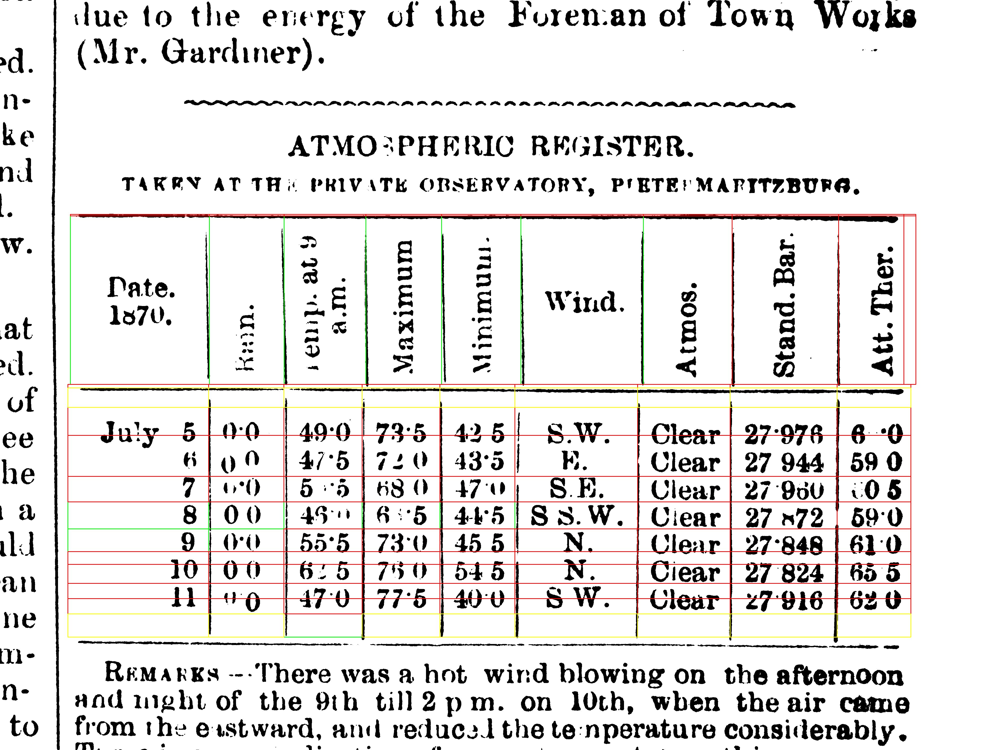

In [44]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,color,0)) # Green

for box in exclude_cells+exclude_cells_pred:
    put_box(image,box,(color,0,0)) # Red

for box in blank_cells:
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_classification_generation.jpg")
im_pil  

### Filter overlapped error cell

In [45]:
not_ovellapped_blank_cells_pred =  find_overlapped_cell(correct_cells, blank_cells)
considered_cells = correct_cells+not_ovellapped_blank_cells_pred

In [46]:
len(exclude_cells)

75

In [47]:
not_ovellapped_exclude_cells_pred =  find_overlapped_cell(considered_cells, exclude_cells+exclude_cells_pred)

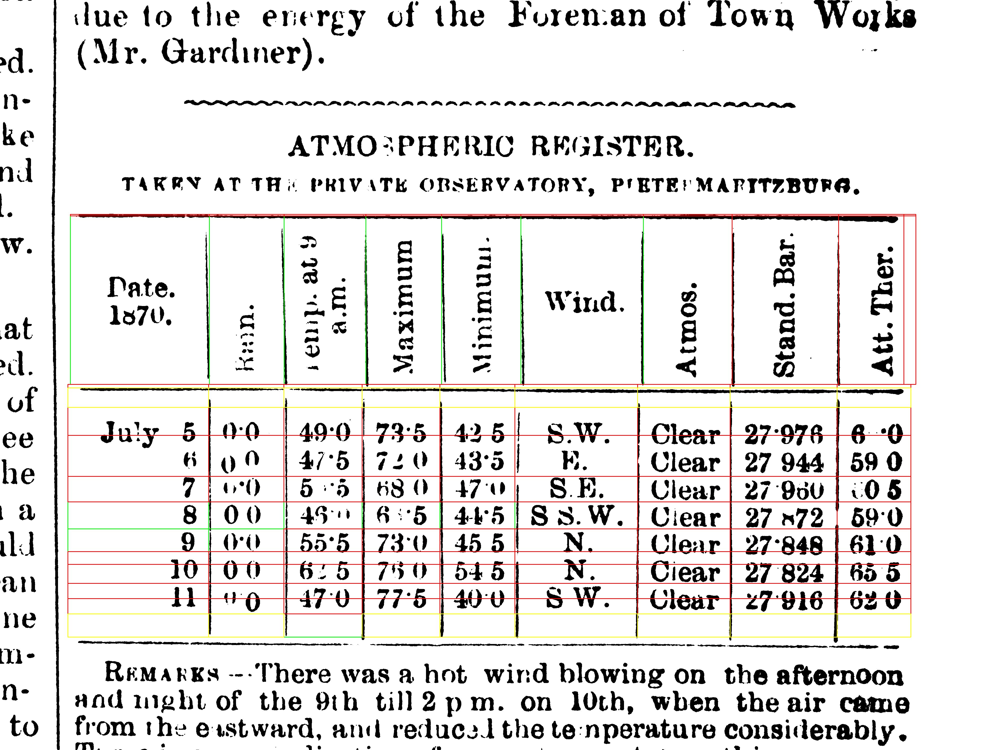

In [48]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,color,0)) # Green

for box in not_ovellapped_exclude_cells_pred:
    put_box(image,box,(color,0,0)) # Red

for box in not_ovellapped_blank_cells_pred:   
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_classification_overlapped_filtered.jpg")
im_pil  

### Segment the correct cells if multiple combination exist

In [49]:
def segment_image(image, cell, mask,average_cordinates):
    mask = masks[1]
    roi = mask[cell[1]:cell[3],cell[0]:cell[2]]
    rows, cols = roi.shape

    tid = cell[4]
    avg_x, avg_y = average_cordinates[tid]

    # check row by row first
    seg_x_region = []
    starting_flag = True
    for i in range(rows):
        if sum(roi[i,:])> cols*0.01 and starting_flag:
            seg_x_region.append(i-1)
            starting_flag = False
        elif sum(roi[i,:]) < cols*0.01 and not starting_flag:
            seg_x_region.append(i+1)
            starting_flag = True
            
    new_row_cells = []
    
    if len(seg_x_region)>1:
        last_end = 0
        flag = False
        for start,end in zip(seg_x_region[0:-1],seg_x_region[1:]):
            if abs(start - end)>avg_y/3:
                if last_end == 0:
                    new_row_cells.append(cell[1]+start) 
                    last_end = end
                else:
                    start = int((last_end+start)/2)
                    new_row_cells.append(cell[1]+start) 
                    last_end = end
                flag = True
            else:
                flag = False

        if flag:
            new_row_cells.append(cell[1]+end)  
            
    new_row_cells = find_coordinates(new_row_cells+[cell[3]], avg_y, 0.7)
    
    if len(new_row_cells)<2:
        new_row_cells = [cell[1],cell[3]]
    print('x', cell, new_row_cells, avg_y)
        
        
    # check col by col 
    seg_y_region = []
    starting_flag = True

    for i in range(cols):
        if sum(roi[:,i]) > rows*0.05 and starting_flag:
    #         print(f'starting index {i} conditioned on {sum(roi[:,i])} > {rows*0.05}')
            seg_y_region.append(i-1)
            starting_flag = False
        elif sum(roi[:,i])< rows*0.05 and not starting_flag:
    #         print(f'ending index {i} conditioned on {sum(roi[:,i])} > {rows*0.05}')
            seg_y_region.append(i+1)
            starting_flag = True
            
    new_col_cells = []
    if len(seg_y_region)>1:
        last_end = 0
        flag = False
        for start,end in zip(seg_y_region[0:-1],seg_y_region[1:]):
            if abs(start - end)>avg_x/3:
                if last_end == 0:
                    new_col_cells.append(cell[0]+start) 
                    last_end = end
                else:
                    start = int((last_end+start)/2)
                    new_col_cells.append(cell[0]+start) 
                    last_end = end
                flag = True
            else:
                flag = False

        if flag:
            new_col_cells.append(cell[0]+end) 
    
    new_col_cells = find_coordinates(new_col_cells+[cell[2]], avg_x, 0.7)
            
    if len(new_col_cells)<2:
        new_col_cells= [cell[0],cell[2]] 
    print('y', cell, new_col_cells, avg_x)

    return generate_new_cells(new_row_cells, new_col_cells,cell[4])

def get_table_coord(cell, tables):
    for idx,table in enumerate(tables):
        table = list(map(int, table))
        print(cell)
        score = tsa.how_much_contained(cell[0:4],table)    
        if score > 0.5:
            return idx, score 
    return [], score
    
def generate_new_cells(y_coords, x_coords,idx):
    possible_cells = []
    x_a = x_coords[0]
    for r, x_b in enumerate(x_coords[1:]):
        if abs(x_b-x_a)>2:
            row_a = [(int(x_a),y) for y in y_coords]
            row_b = [(int(x_b),y) for y in y_coords]
            
            for i in range(len(row_a)-1):
                imagedraw = (row_a[i]+row_b[i+1])
                imagedraw = list(map(int, imagedraw))

                xax = abs(imagedraw[2] - imagedraw[0])
                yax = abs(imagedraw[3] - imagedraw[1])
                possible_cells.append(imagedraw+[idx])
            x_a = int(x_b)
    return possible_cells

In [50]:
# segmented_cells = []
# error_cells = []
# for imagedraw in not_ovellapped_exclude_cells_pred:#
    
#     croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
#     plt.rcParams["figure.figsize"] = (10,5)
#     plt.imshow(croppedimage_full)
#     plt.title(f'Input image {imagedraw[1]}')
#     plt.show()
#     idx, score = get_table_coord(cell, tables)
#     avg_x, avg_y = average_cordinates[idx]
    
#     x = abs(imagedraw[0]-imagedraw[2])
#     y = abs(imagedraw[1]-imagedraw[3])
    
#     if score > 0.5 and x>=avg_x/2 and y>=avg_y/2:
#         possible_cells = segment_image(image, imagedraw[0:4]+[idx], masks[1],average_cordinates)
#         segmented_cells += possible_cells
#         for cell in possible_cells:
#             croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]
#             plt.rcParams["figure.figsize"] = (10,5)
#             plt.imshow(croppedimage_full)
#             plt.title(f'Corrected image')
#             plt.show()
#     else:
#         error_cells.append(imagedraw[0:4]+[idx])
            


In [50]:
# error_correct_cells, error_blank_cells, exclude_cells = classify_cells(segmented_cells, masks[1], average_cordinates)    

In [51]:
# img = cv.imread("temp.jpg")
# image, height, width, _ = image_preprocessing(img)

# color = 255
# for box in tables:
#     box = list(map(int, box[0:4]))
#     put_box(image,box,(0,color,color)) # Cyan 
    
# for box in correct_cells:
#     put_box(image,box,(0,0,color)) # blue
    
# for box in error_correct_cells:
#     put_box(image,box,(0,color,0)) # Green

# for box in exclude_cells:
#     put_box(image,box,(color,0,0)) # Red

# for box in not_ovellapped_blank_cells_pred+error_blank_cells:   
#     put_box(image,box,(color,color,0)) # Yellow

# im_pil = Image.fromarray(image)
# # im_pil.save(f"{filename}_temp_cell_classification_overlapped_filtered.jpg")
# im_pil  

In [81]:
# all_possible_cells = correct_cells+error_correct_cells+exclude_cells+not_ovellapped_blank_cells_pred+error_blank_cells

In [82]:
# table_cells = get_x_y(tables, all_possible_cells)
# cell_cordinates, average_cordinates = get_coordinates(table_cells,0.7)

In [94]:
# cell_cordinates_new = []
# for tid in cell_cordinates:
#     new_col_cells = find_coordinates(tid[0], avg_x, 0.7)
#     new_row_cells = find_coordinates(tid[1], avg_y, 0.7)
#     cell_cordinates_new.append([new_col_cells,new_row_cells])

In [95]:
# possible_cells, exclude_cells_pred = generate_cells(masks[1], tables, cell_cordinates_new, average_cordinates)
# correct_cells, blank_cells, exclude_cells = classify_cells(possible_cells, masks[1], average_cordinates)    

In [51]:
# img = cv.imread("temp.jpg")
# image, height, width, _ = image_preprocessing(img)

# color = 255
# for box in tables:
#     box = list(map(int, box[0:4]))
#     put_box(image,box,(0,color,color)) # Cyan 
    
# for box in correct_cells:
#     put_box(image,box,(0,color,0)) # Green

# for box in exclude_cells+exclude_cells_pred:
#     put_box(image,box,(color,0,0)) # Red

# for box in blank_cells:
#     put_box(image,box,(color,color,0)) # Yellow

# im_pil = Image.fromarray(image)
# # im_pil.save(f"{filename}_temp_cell_classification_generation.jpg")
# im_pil  

### Correct single cell error

In [51]:
# check boundary
def correct_boundary_single_cell(imagedraw, mask, table,average_cordinate, pc):
    cell = imagedraw[0:4]
    x_avg, y_avg = average_cordinate
    mask_area = mask[cell[1]:cell[3],cell[0]:cell[2]]
    
    x0,y0,x1,y1 = list(map(int, table))
    new_cell = list(cell)
    changed = [0]*4
        
    # Fix y-axis boundary
    count = 0
    lower = 0
    xc0,yc0,xc1,yc1 = list(map(int, cell))
    for idx, mask_cell in enumerate(mask_area):  # row by row check ascending order
    #     print(len(mask_cell),len(mask_area))
        if not any(mask_cell): # not text region
            count+=1

        elif lower == 0 and count>0:  # check y0
            if count>5:
                new_cell[1]= new_cell[1]+5
            else:
                new_cell[1]= new_cell[1]+count
            changed[1] = 1
            break

        elif float(sum(mask_cell))/len(mask_cell)< 0.2:
            count+=1
            
        elif count == 0:
            break

    count = 0
    lower = 0
    for idx in reversed(range(len(mask_area))):  # row by row check descending order
        mask_cell = mask_area[idx]
    #     print(len(mask_cell),len(mask_area))
        if not any(mask_cell): # not text region
            count+=1

        elif lower == 0 and count>0:  # check y0
            if count>5:
                new_cell[3]= new_cell[3]-5
            else:
                new_cell[3]= new_cell[3]-count
            changed[3] = 1
            break

        elif float(sum(mask_cell))/len(mask_cell)< 0.2:
            count+=1
            
        elif count == 0:
            break

    # Fix x-axis boundary
    count = 0
    lower = 0

    for col_check in range(len(mask_area[0])): # column by column check x0 to xn
        mask_cell = mask_area[:,col_check]
    #     print(len(mask_cell),len(mask_area[0]))
        if not any(mask_cell): # not text region
            count+=1

        elif lower == 0 and count>0:  # check x0
            if count>5:
                new_cell[0]= new_cell[0]+5
            else:
                new_cell[0]= new_cell[0]+count
            changed[0] = 1
            break

        elif float(sum(mask_cell))/len(mask_cell)< 0.2:
            count+=1
            
        elif count == 0:
            break

    count = 0
    lower = 0

    for col_check in reversed(range(len(mask_area[0]))): # column by column check reverse xn to x0
        mask_cell = mask_area[:,col_check]
    #     print(len(mask_cell),len(mask_area[0]))
        if not any(mask_cell): # not text region
            count+=1

        elif lower == 0 and count>0:  # check x0
            if count>5:
                new_cell[2]= new_cell[2]-5
            else:
                new_cell[2]= new_cell[2]-count
            changed[2] = 1
            break

        elif float(sum(mask_cell))/len(mask_cell)< 0.2:
            count+=1

        elif count == 0:
            break

    # if cell is in table border area
    if abs(x0-cell[0])<x_avg*pc:
        new_cell[0] = x0
        changed[0] = 5
    if abs(x1-cell[2])<x_avg*pc:
        new_cell[2] = x1
        changed[2] = 5
    if abs(y0-cell[1])<y_avg*pc:
        new_cell[1] = y0
        changed[1] = 5
    if abs(y1-cell[3])<y_avg*pc:
        new_cell[3] = y1
        changed[3] = 5

    return new_cell, changed

In [52]:
def sort_coord(new_excluded_cells_pred):
    x = [i[0:4] for i in new_excluded_cells_pred]
    x = torch.IntTensor(x)
    value, index = x[:,1].sort()

    # value,index
    y_cords = {}
    for idx, i in zip(index,value):
        idx, i = (int(idx),int(i))

        if i not in y_cords:
            y_cords[i]=[]
        y_cords[i].append(idx)
        
    y_cords_new = {}
    for i in y_cords:
        mat = [new_excluded_cells_pred[idx][0:4] for idx in y_cords[i]]
        mat = torch.IntTensor(mat)
        _, index = mat[:,0].sort()
    #     print(_, index, mat)

        mat_new = []

        for idx in index:
    #         print(mat[int(idx)])
            cell =  mat[int(idx)].tolist()
            table_idx, score = get_table_coord(cell, tables)
            if score > 0.5:
                mat_new.append(cell[0:4]+[table_idx])  #cells and its table index
        y_cords_new[i]=mat_new
    return y_cords_new

In [53]:
def classify_error_cells(new_excluded_cells_pred, tables, average_cordinates,pc):
    y_cords = sort_coord(new_excluded_cells_pred)

    new_corrected_excluded_cells = []
    not_corrected_excluded_cells = []
    yidx = list(y_cords.keys())
#     print(yidx)
    for yid, y_idx in enumerate(y_cords):
        yneighbours_idx = []
        if yid>0 and yid+1 < len(y_cords):
            yneighbours_idx = [yidx[yid-1],yidx[yid+1]]
        elif yid+1 < len(y_cords):
            yneighbours_idx = [yidx[yid+1]]

    #     print('---',yid, '--',len(y_cords[y_idx]), '--', y_idx, yneighbours_idx,'####')
        xneighbours_idx = []

        for xid, imagedraw in enumerate(y_cords[y_idx]):

            if xid>0 and xid+1 < len(y_cords[y_idx]):
                xneighbours_idx = [yneighbours_idx, [y_cords[y_idx][xid-1],y_cords[y_idx][xid+1]]]

            elif xid+1 < len(y_cords[y_idx]):
                xneighbours_idx = [yneighbours_idx,[y_cords[y_idx][xid+1]]]
            else:
                xneighbours_idx = [yneighbours_idx,[]]

    #         print('x---',xid,'total cells: #',len(y_cords[y_idx]),xneighbours_idx,'###')

            table_idx = imagedraw[-1]

            table = tables[table_idx]
            new_cell, changed = correct_boundary_single_cell(imagedraw, masks[1], table, average_cordinates[table_idx], 1-pc)
            
            x_avg, y_avg = average_cordinates[table_idx]

            if abs(new_cell[0]-new_cell[2])<x_avg*pc or abs(new_cell[1]-new_cell[3])<y_avg*pc:
                not_corrected_excluded_cells.append(new_cell+[0]+[xneighbours_idx]+[changed])
            elif sum(changed)==4 and 5 not in changed:
                new_corrected_excluded_cells.append(new_cell+[1]+[xneighbours_idx]+[changed])
            elif sum(changed)> 5 and 0 not in changed:
                new_corrected_excluded_cells.append(new_cell+[1]+[xneighbours_idx]+[changed])
            else:
                not_corrected_excluded_cells.append(new_cell+[0]+[xneighbours_idx]+[changed])
    
    return new_corrected_excluded_cells, not_corrected_excluded_cells

In [54]:
new_corrected_excluded_cells, not_corrected_excluded_cells = classify_error_cells(not_ovellapped_exclude_cells_pred, tables, average_cordinates,0.7)

[281, 857, 837, 863]
[281, 857, 837, 863]
[837, 857, 1136, 863]
[837, 857, 1136, 863]
[1136, 857, 1463, 863]
[1136, 857, 1463, 863]
[1463, 857, 1766, 863]
[1463, 857, 1766, 863]
[1766, 857, 2083, 863]
[1766, 857, 2083, 863]
[2083, 857, 2573, 863]
[2083, 857, 2573, 863]
[2573, 857, 2928, 863]
[2573, 857, 2928, 863]
[2928, 857, 3354, 863]
[2928, 857, 3354, 863]
[3354, 857, 3615, 863]
[3354, 857, 3615, 863]
[3615, 857, 3663, 863]
[3615, 857, 3663, 863]
[2928, 863, 3354, 1537]
[2928, 863, 3354, 1537]
[3354, 863, 3615, 1537]
[3354, 863, 3615, 1537]
[3615, 863, 3663, 1537]
[3615, 863, 3663, 1537]
[271, 1537, 834, 1551]
[834, 1537, 1135, 1551]
[1135, 1537, 1448, 1551]
[1448, 1537, 1759, 1551]
[1759, 1537, 2059, 1551]
[2059, 1537, 2550, 1551]
[2550, 1537, 2920, 1551]
[2920, 1537, 3348, 1551]
[3348, 1537, 3643, 1551]
[271, 1629, 834, 1741]
[834, 1629, 1135, 1741]
[1135, 1629, 1448, 1741]
[1448, 1629, 1759, 1741]
[1759, 1629, 2059, 1741]
[2059, 1629, 2550, 1741]
[2550, 1629, 2920, 1741]
[2920, 1

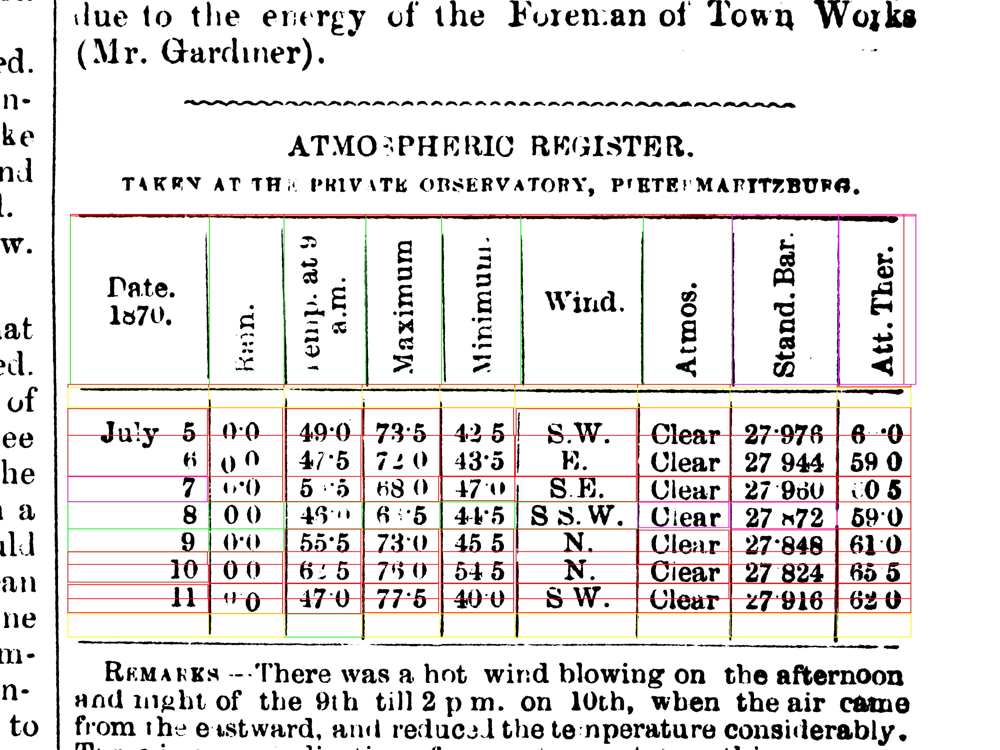

In [55]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,color,0)) # Green

for box in not_corrected_excluded_cells:
    put_box(image,box,(color,0,0)) # Red

for box in new_corrected_excluded_cells:
#     print(box)
    put_box(image,box,(color,0,color))  # pink
    
for box in not_ovellapped_blank_cells_pred:   
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_classification_single_cell_correction.jpg")
im_pil  

### Generate cells from valid cells

In [56]:
all_valid_cells = ori_correct_cells+correct_cells+not_ovellapped_blank_cells_pred+new_corrected_excluded_cells

In [57]:
table_cells = get_x_y(tables, all_valid_cells)
cell_cordinates, average_cordinates = get_coordinates(table_cells,0.7)

In [58]:
possible_cells, exclude_cells_pred = generate_cells(masks[1], tables, cell_cordinates, average_cordinates)
correct_cells, blank_cells, exclude_cells = classify_cells(possible_cells, masks[1], average_cordinates)  

In [ ]:
new_corrected_excluded_cells, not_corrected_excluded_cells = classify_error_cells(exclude_cells, tables, average_cordinates,0.7)
corrected_cells, corrected_excluded_cells = classify_error_cells(correct_cells, tables, average_cordinates,0.7)

[831, 1634, 1140, 1906]
[1140, 1634, 1455, 1906]
[1455, 1634, 1764, 1906]
[1764, 1634, 2059, 1906]
[2916, 1634, 3347, 1906]
[3347, 1634, 3643, 1906]
[831, 1906, 1140, 2006]
[1140, 1906, 1455, 2006]
[1455, 1906, 1764, 2006]
[1764, 1906, 2059, 2006]
[2059, 1906, 2547, 2006]
[3347, 1906, 3643, 2006]
[1455, 2006, 1764, 2112]
[1764, 2006, 2059, 2112]
[2916, 2006, 3347, 2112]
[3347, 2006, 3643, 2112]
[1140, 2112, 1455, 2206]
[1455, 2112, 1764, 2206]
[1764, 2112, 2059, 2206]
[2059, 2112, 2547, 2206]
[2547, 2112, 2916, 2206]
[2916, 2112, 3347, 2206]
[3347, 2112, 3643, 2206]
[831, 2206, 1140, 2341]
[1140, 2206, 1455, 2341]
[1455, 2206, 1764, 2341]
[1764, 2206, 2059, 2341]
[2059, 2206, 2547, 2341]
[2547, 2206, 2916, 2341]
[2916, 2206, 3347, 2341]
[3347, 2206, 3643, 2341]
[271, 2341, 831, 2455]
[831, 2341, 1140, 2455]
[2059, 2341, 2547, 2455]
[2547, 2341, 2916, 2455]
[281, 920, 837, 1537]
[281, 920, 837, 1537]
[837, 920, 1136, 1537]
[837, 920, 1136, 1537]
[1136, 920, 1462, 1537]
[1136, 920, 1462,

In [ ]:
corrected_cells = find_overlapped_cell(correct_cells, corrected_cells)
exclude_cells_cor = find_overlapped_cell(exclude_cells, corrected_excluded_cells)

In [ ]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,0,color)) # Blue
    
for box in corrected_cells:
    put_box(image,box,(0,color,0)) # Green

for box in exclude_cells+exclude_cells_cor:
    put_box(image,box,(color,0,0)) # Red
    
for box in new_corrected_excluded_cells:
#     print(box)
    put_box(image,box,(color,0,color))  # pink
    
for box in blank_cells:   
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_generation_from_valid_cells.jpg")
im_pil  

### Correct cell boundary considering multiple cells

In [ ]:
def get_neighbouring_coord(cells, tables):
    new_excluded_cells_pred = []
    
    for cell in cells:
        new_excluded_cells_pred.append(cell[0:5])
    
    x = torch.IntTensor(new_excluded_cells_pred)
    value, index = x[:,1].sort()

    # value,index
    y_cords = {}
    for idx, i in zip(index,value):
        idx, i = (int(idx),int(i))

        if i not in y_cords:
            y_cords[i]=[]
        y_cords[i].append(idx)
        
    y_cords_new = {}
    for i in y_cords:
        mat = [new_excluded_cells_pred[idx] for idx in y_cords[i]]
        mat = torch.IntTensor(mat)
        _, index = mat[:,0].sort()
    #     print(_, index, mat)

        mat_new = []

        for idx in index:
    #         print(mat[int(idx)])
            cell =  mat[int(idx)].tolist()
            table_idx, score = get_table_coord(cell, tables)
            if score > 0.5:
                mat_new.append(cell[0:4]+[table_idx])  #cells and its table index
        y_cords_new[i]=mat_new
    return y_cords_new

In [ ]:
# sort x and y coordinates of excluded_cells_pred
def get_x_y_neighbour_cells(new_excluded_cells_pred, tables, average_cordinates):
    y_cords = get_neighbouring_coord(new_excluded_cells_pred, tables)
    
    neighbouring_cells = {}
    yidx = list(y_cords.keys())
    
    for yid, y_idx in enumerate(y_cords):
        yneighbours_idx = []
        
        ## can be remove for later filtering
        tid = y_cords[y_idx][0][4]
        avg_x, avg_y = average_cordinates[tid]
        
        yneighbours_idx = []
        if yid>0 and yid+1 < len(y_cords):
            if abs(yidx[yid-1]-y_idx)<avg_y:           
                yneighbours_idx.append(yidx[yid-1]) #= [yidx[yid-1],yidx[yid+1]]
            if abs(yidx[yid+1]-y_idx)<avg_y:           
                yneighbours_idx.append(yidx[yid+1]) 

        elif yid+1 < len(y_cords):
            if abs(yidx[yid+1]-y_idx)<avg_y:           
                yneighbours_idx.append(yidx[yid+1]) #first cell neighbour 
        ### remove if condition if filtering is not required

        xneighbours_idx = []
        if len(y_cords[y_idx])>=1:
            xneighbours_idx = [yneighbours_idx, y_cords[y_idx]]
        else:
            xneighbours_idx = [yneighbours_idx,[]]  # no neighbours

        neighbouring_cells[y_idx]=xneighbours_idx
    
    return neighbouring_cells, y_cords
            

In [ ]:
neighbouring_cells, y_cords = get_x_y_neighbour_cells(exclude_cells+exclude_cells_cor, tables, average_cordinates)

In [ ]:
x_y_neighbouring_cells_dict = {}
for yid in neighbouring_cells:
    cells = neighbouring_cells[yid]
    
    y_neighbours = cells[0]
    x_neighbours = cells[1]
    
    tid =x_neighbours[0][4]
    
    avg_x, avg_y = average_cordinates[tid]
    
    # print(yid,y_neighbours,x_neighbours,tid, average_cordinates[tid])
    
    # find x_neighbours
    ncells = []
    imagedraw = []
    next_cell_begin = True
    starting_cell = []
    
    for xid, xcell in enumerate(x_neighbours):    

        # Either split the cell or merge to begining cell
        if next_cell_begin:
            starting_cell = list(xcell)
        else:
            starting_cell[2] = xcell[2]
        
        # check next cell distance
        if (xid+1)<len(x_neighbours):
            next_cell = x_neighbours[xid+1]
            if abs(next_cell[0]-xcell[2])<(avg_x/3):
                next_cell_begin = False
            else:
                ncells.append(starting_cell)
                starting_cell = []
                next_cell_begin = True
        elif len(x_neighbours)==1:
            ncells.append(starting_cell)
            starting_cell = []
    
    if len(starting_cell)>0:
        ncells.append(starting_cell)
                
#     print(x_neighbours,'---',ncells)   
    x_y_neighbouring_cells_dict[yid] = (y_neighbours, ncells)
    
x_y_neighbouring_cells_dict

In [ ]:
yids = list(x_y_neighbouring_cells_dict.keys())
count = 0
y_neighbours = {}
cur_list = []

for i, j in zip(yids[:-1],yids[1:]):
    if count == 0:  # First index
        cur_list.append(i)        
    if (j-i) < avg_y:
        cur_list.append(j)
    else:
        y_neighbours[cur_list[0]] = cur_list
        cur_list = [j]
    count+=1
    
if cur_list[0] not in y_neighbours:
    y_neighbours[cur_list[0]] = cur_list

y_neighbours_new = {}
for yid in y_neighbours:
    for yidn in y_neighbours[yid]:
        y_neighbours_new[yidn] = y_neighbours[yid]
#         if yidn not in y_neighbours:
#             print(y_neighbours[yid])
    
print(y_neighbours_new)

In [ ]:
def correct_boundary_neighbour(image, cell, tables, step_x, step_y):
    croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]  
    plt.rcParams["figure.figsize"] = (10,5)
    plt.imshow(croppedimage_full)
    plt.title(f'Input image')
    plt.show()
    
    anchor = list(cell)
    notfound = True
    count = 0 
    step_x0 = 0 
    step_x1 = 0
    step_y0 = 0
    step_y1 = 0
    changed = [1,1,1,1]
    
    while notfound:
        
        if anchor[0]<anchor[2] and anchor[1]< anchor[3]:
            new_corrected, not_corrected = classify_error_cells([anchor], tables, average_cordinates,0.7) # correct single error cell or declare error
        else:
            return []
#         print(anchor, new_corrected, not_corrected)
        if len(new_corrected)>0:
            count+=1
            
            anchor[0]+=step_x0
            anchor[1]+=step_y0
            anchor[2]+=step_x1
            anchor[3]+=step_y1
            
            if count>0:
                notfound = False
        elif len(not_corrected)>0:
            
            changed = not_corrected[0][6]   
            if 0 not in changed: 
                notfound = False
            else:
                if changed[0]==0:
                    step_x0+=step_x
                    anchor[0]+=step_x0
                if changed[1]==0:
                    step_y0+=step_y
                    anchor[1]+=step_y0
                if changed[2]==0:
                    step_x1+=step_x
                    anchor[2]+=step_x1
                if changed[3]==0:
                    step_y1+=step_y
                    anchor[3]+=step_y1           
    
    cur_corrected = list(anchor)
    return cur_corrected

def find_proper_cell(cell, avg_x, avg_y):
    if abs(cell[0]-cell[2])>(avg_x*2)/3 and abs(cell[1]-cell[3])>(avg_y*2)/3 :
        return True
    else:
        return False
    
def correct_boundary_multiple_cell(image, cell, n_cell, above, average_cordinates, tables):
    
    tid = cell[4]
    avg_x, avg_y = average_cordinates[tid]
    tab_boundary = list(map(int, tables[tid]))
    
    step_x = int(avg_x*0.025)
    step_y = int(avg_y*0.025)
    
    if find_proper_cell(cell, avg_x, avg_y):
        cur_corrected = correct_boundary_neighbour(image, cell, tables, step_x, step_y)
        if len(cur_corrected) == 0:
            cur_corrected = cell
    else:
        cur_corrected = cell
#     croppedimage_full=image[int(cur_corrected[1]):int(cur_corrected[3]),int(cur_corrected[0]):int(cur_corrected[2])]  
#     plt.rcParams["figure.figsize"] = (10,5)
#     plt.imshow(croppedimage_full)
#     plt.title(f'try cell images')
#     plt.show()

    anchor = list(n_cell) ## neighbour update check
    if len(cur_corrected)>1:
        if above: # check cell by crossing boundary of above cell i.e. decrease y0 and y1
            anchor[3] = cur_corrected[1]
            anchor[0] = cur_corrected[0]

        else: # increase y0 and y1 by avg_y*0.05 (5%) cell size
            anchor[1] = cur_corrected[3]
            anchor[0] = cur_corrected[0]

    if find_proper_cell(anchor, avg_x, avg_y):
        n_cur_corrected = correct_boundary_neighbour(image, anchor, tables, step_x, step_y)
        if len(n_cur_corrected) == 0:
            n_cur_corrected = anchor
    else:
        n_cur_corrected = anchor
#     croppedimage_full=image[int(n_cur_corrected[1]):int(n_cur_corrected[3]),int(n_cur_corrected[0]):int(n_cur_corrected[2])]  
#     plt.rcParams["figure.figsize"] = (10,5)
#     plt.imshow(croppedimage_full)
#     plt.title(f'try cell images')
#     plt.show()
    
    return cur_corrected, n_cur_corrected

In [ ]:
# combine x and y neighbours v2
error_corrected_cells = []
not_corrected_cells = []
for yid in x_y_neighbouring_cells_dict:
#     print(yid)
    ynid, xnid = x_y_neighbouring_cells_dict[yid]
    
    if len(ynid) == 0: 
        new_corrected, not_corrected = classify_error_cells(xnid, tables, average_cordinates,0.7) # correct single error cell or declare error
        
        if len(not_corrected)==0:
            error_corrected_cells+=new_corrected
        else:
            for cell in not_corrected:                
                tid = cell[4]
                avg_x, avg_y = average_cordinates[tid]
                tab_boundary = list(map(int, tables[tid]))
                
                move = cell[6]
                
                for idx,i in enumerate(move):
                    if i == 0:
                        if abs(cell[idx]-tab_boundary[idx])<avg_y/3:
                            cell[idx] = tab_boundary[idx]
                            move[idx] = 5
                            
                if 0 in move:
                    not_corrected_cells+=not_corrected
                    
                else:
                    cell[6] =  move
                    error_corrected_cells+=[cell]
#                     print(cell, imagedraw[idx],tab_boundary[idx], avg_y/3, abs(cell[idx]-tab_boundary[idx]))
                    
    elif len(xnid)>0: #multiple neighbours
#         print(ynid, yid)
        above_cells = []
        cur_cells = []
        below_cells = []
        for y_n in ynid:
            if y_n < yid:
#                 print(y_n, yid)
                above_cells = x_y_neighbouring_cells_dict[y_n][1]
            else:
                cur_cells = xnid
            
                below_cells = x_y_neighbouring_cells_dict[y_n][1]
        print(f'============{yid}================== \nAbove cells:{above_cells} \nCurrent cells: {xnid} \nBelow cells: {below_cells}')
        
        for cell in xnid:
            anchor = list(cell)      
            
            tid = cell[4]
            avg_x, avg_y = average_cordinates[tid]
            tab_boundary = list(map(int, tables[tid]))

            #check above first:
            for a_cell in above_cells:
                anchor_a = list(a_cell)
                anchor_a[1] = anchor[1] # change the y-coordinates to see overlapping or not and if overlapped the cell is immediate neighbour
                anchor_a[3] = anchor[3]
                score1 = tsa.how_much_contained(anchor_a, cell)
                score2 = tsa.how_much_contained(cell,anchor_a)
                
                if score1>0.5:
                    
                    
                    if a_cell[0] < cell[0]:  ## check if a_cell[0] >= cell[0] and change a_cell[0] to cell[0] and a_cell[2] to cell[2] for correction
                        
                        print(f'1--{yid} just above cell: {a_cell}, Current cell: {cell}, {anchor_a}, {score1}')
                        above = True
                        cur_corrected, n_cur_corrected = correct_boundary_multiple_cell(image, cell, a_cell, above, average_cordinates, tables)
                        error_corrected_cells.append(cur_corrected)
                        
                        merged_cell = list(cell)
                        merged_cell[1] = a_cell[1]
                        
                        croppedimage_full=image[int(merged_cell[1]):int(merged_cell[3]),int(merged_cell[0]):int(merged_cell[2])] 
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'{yid} merged cell of {len(y_cords[yid])} #images')
                        plt.show()
                        
                        croppedimage_full=image[int(cur_corrected[1]):int(cur_corrected[3]),int(cur_corrected[0]):int(cur_corrected[2])]  
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'current cell images')
                        plt.show()


                        croppedimage_full=image[int(n_cur_corrected[1]):int(n_cur_corrected[3]),int(n_cur_corrected[0]):int(n_cur_corrected[2])]  
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'neighbour cell images')
                        plt.show()
                        
                        
#                         new_cells = predict_cells(cell, a_cell, above=True, masks[1], tab_boundary, avg_x, avg_y)
#                         for n_cell(imagedraw) in new_cells:
#                             classify_error_cells(n_cell, tables)
#                             new_cell, changed = correct_boundary_single_cell(imagedraw, masks[1], table)

#                             if sum(changed)==4 and 5 not in changed:
#                                 new_corrected_excluded_cells.append(new_cell+[table_idx]+[xneighbours_idx]+[changed])
#                             elif 0 not in changed:
#                                 new_corrected_excluded_cells.append(new_cell+[table_idx]+[xneighbours_idx]+[changed])
#                             else:
#                                 not_corrected_excluded_cells.append(new_cell+[table_idx]+[xneighbours_idx]+[changed])

                        
                        print('-----Above-----\n')
#                         pass
                    
                    else:                            
                        pass ##wrong issue

#                         croppedimage_full=image[int(a_cell[1]):int(a_cell[3]),int(a_cell[0]):int(a_cell[2])]  ## check if a_cell[0] >= cell[0] and change a_cell[0] to cell[0] and a_cell[2] to cell[2] for correction
#                         plt.rcParams["figure.figsize"] = (10,5)
#                         plt.imshow(croppedimage_full)
#                         plt.title(f'Issue with above cell image')
#                         plt.show()
                    
#                         croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]
#                         plt.rcParams["figure.figsize"] = (10,5)
#                         plt.imshow(croppedimage_full)
#                         plt.title(f'Current cell image')
#                         plt.show()
            
            
            #check below cell:
            for b_cell in below_cells:
                anchor_b = list(b_cell)
                anchor_b[1] = anchor[1] # change the y-coordinates to see overlapping or not and if overlapped the cell is immediate neighbour
                anchor_b[3] = anchor[3]
                score1 = tsa.how_much_contained(cell,anchor_b)
                score2 = tsa.how_much_contained(anchor_b, cell)
                
                if score1>0.5:
                    
                    if b_cell[0] < cell[0]: ##check if b_cell[0] >= cell[0] and change b_cell[0] to cell[0] and b_cell[2] to cell[2] for correction
                        
                        above = False
                        cur_corrected, n_cur_corrected = correct_boundary_multiple_cell(image, cell, b_cell, above, average_cordinates, tables)
                        error_corrected_cells.append(cur_corrected)
                        print(f'2--{yid} just below cell: {b_cell}, Current cell: {cell}, {anchor_b} {score1}')
                        
                        merged_cell = list(cell)
                        merged_cell[3] = b_cell[3]
                        
                        croppedimage_full=image[int(merged_cell[1]):int(merged_cell[3]),int(merged_cell[0]):int(merged_cell[2])]  
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'{yid} merged cell of {len(y_cords[yid])} #images')
                        plt.show()
                        
                        croppedimage_full=image[int(cur_corrected[1]):int(cur_corrected[3]),int(cur_corrected[0]):int(cur_corrected[2])]  
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'current cell images')
                        plt.show()


                        croppedimage_full=image[int(n_cur_corrected[1]):int(n_cur_corrected[3]),int(n_cur_corrected[0]):int(n_cur_corrected[2])]  
                        plt.rcParams["figure.figsize"] = (10,5)
                        plt.imshow(croppedimage_full)
                        plt.title(f'neighbour cell images')
                        plt.show()
                        
                        print('-----Below-----\n')
#                         pass
                    
                    else:                        
                        pass ##wrong issue
                    
#                         croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]
#                         plt.rcParams["figure.figsize"] = (10,5)
#                         plt.imshow(croppedimage_full)
#                         plt.title(f'Current cell image')
#                         plt.show()

#                         croppedimage_full=image[int(b_cell[1]):int(b_cell[3]),int(b_cell[0]):int(b_cell[2])]  ##check if b_cell[0] >= cell[0] and change b_cell[0] to cell[0] and b_cell[2] to cell[2] for correction
#                         plt.rcParams["figure.figsize"] = (10,5)
#                         plt.imshow(croppedimage_full)
#                         plt.title(f'Issue with below cell image')
#                         plt.show()
            
#         print(f'\n')

#         for imagedraw in xnid:                    
#             croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
#             plt.rcParams["figure.figsize"] = (10,5)
#             plt.imshow(croppedimage_full)
#             plt.title(f'Wrong image')
#             plt.show()
        
        

In [ ]:
for imagedraw in error_corrected_cells:
    croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
    plt.rcParams["figure.figsize"] = (10,5)
    plt.imshow(croppedimage_full)
    plt.title(f'Corrected image {imagedraw[1]}')
    plt.show()

In [ ]:
not_overlap_error_cells =  find_overlapped_cell(error_corrected_cells, exclude_cells+exclude_cells_cor)

In [ ]:
not_overlap_error_cells

In [ ]:
new_corrected_excluded_cells, not_corrected_excluded_cells = classify_error_cells(not_overlap_error_cells, tables, average_cordinates,0.7)

In [ ]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,0,color)) # Blue
    
for box in corrected_cells:
    put_box(image,box,(0,color,0)) # Green

for box in not_overlap_error_cells:
    put_box(image,box,(color,0,0)) # Red
    
for box in new_corrected_excluded_cells:
#     print(box)
    put_box(image,box,(color,0,color))  # pink
    
for box in blank_cells:   
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_multiple_cell_correction.jpg")
im_pil  

In [453]:
#upto here 8 july

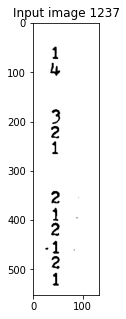

x [3053, 1237, 3187, 1789, 0, [[], []], [1, 1, 1, 1]] [1281, 1789] 231.31578947368422
y [3053, 1237, 3187, 1789, 0, [[], []], [1, 1, 1, 1]] [3053, 3187] 228.0


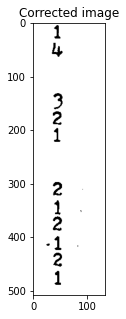

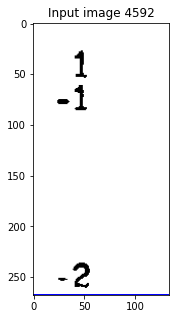

x [3053, 4592, 3187, 4860, 0, [[], []], [1, 1, 1, 5]] [4679, 4860] 231.31578947368422
y [3053, 4592, 3187, 4860, 0, [[], []], [1, 1, 1, 5]] [3053, 3187] 228.0


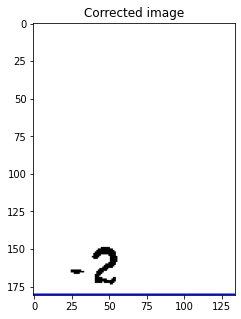

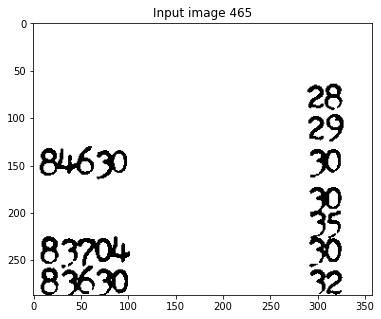

x [2462, 465, 2820, 752, 0] [465, 752] 231.31578947368422
y [2462, 465, 2820, 752, 0] [2461, 2820] 228.0


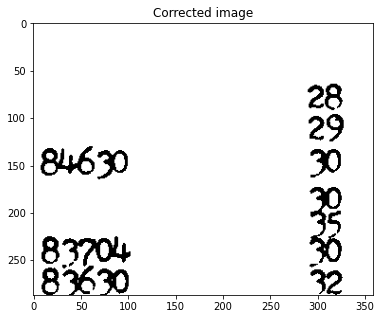

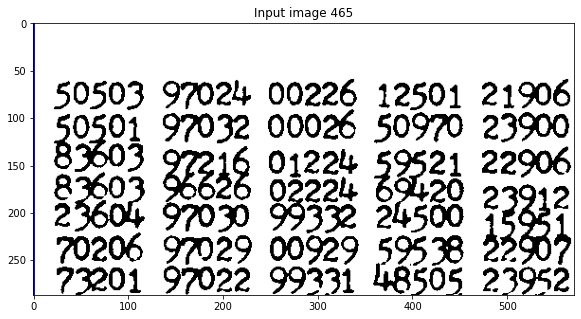

x [1041, 465, 1612, 752, 0] [465, 752] 231.31578947368422
y [1041, 465, 1612, 752, 0] [1041, 1612] 228.0


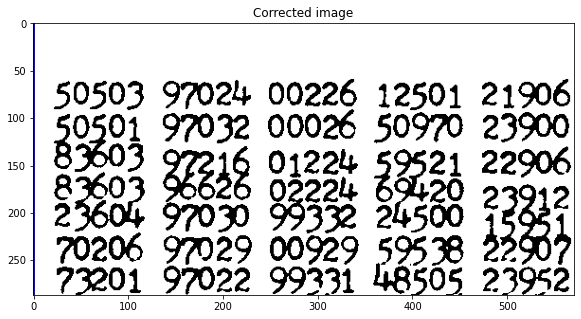

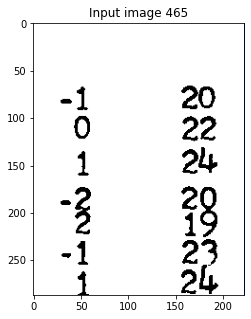

x [2820, 465, 3043, 752, 0] [465, 752] 231.31578947368422
y [2820, 465, 3043, 752, 0] [2882, 3043] 228.0


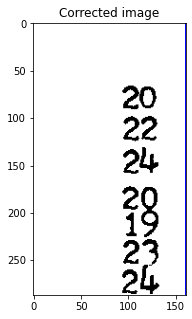

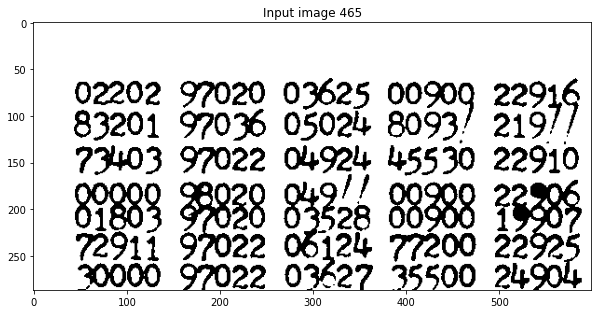

x [1863, 465, 2462, 752, 0] [465, 752] 231.31578947368422
y [1863, 465, 2462, 752, 0] [1863, 2462] 228.0


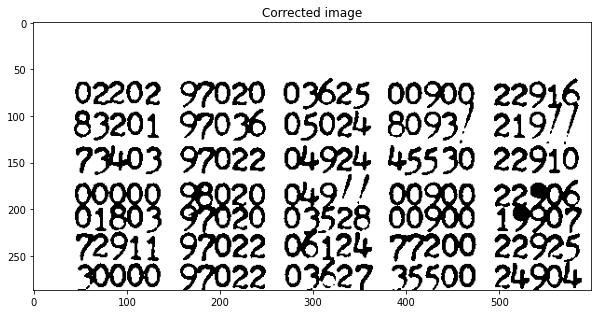

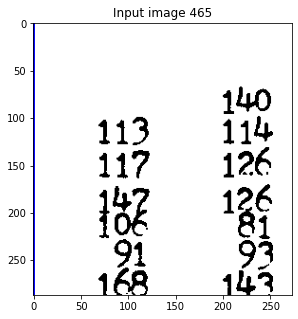

x [3659, 465, 3932, 752, 0] [465, 752] 231.31578947368422
y [3659, 465, 3932, 752, 0] [3659, 3932] 228.0


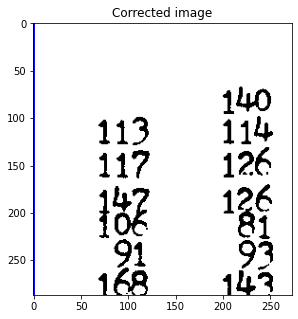

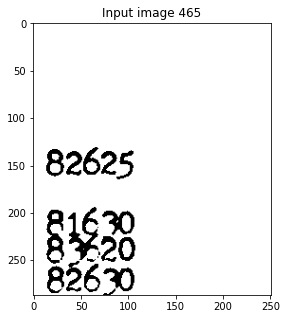

x [1612, 465, 1863, 752, 0] [655, 752] 231.31578947368422
y [1612, 465, 1863, 752, 0] [1611, 1863] 228.0


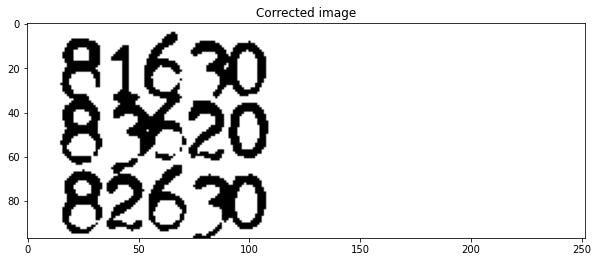

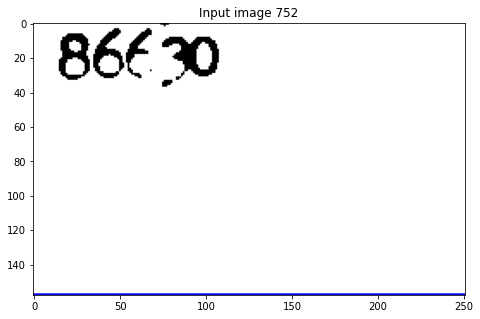

x [1612, 752, 1863, 910, 0] [752, 910] 231.31578947368422
y [1612, 752, 1863, 910, 0] [1611, 1863] 228.0


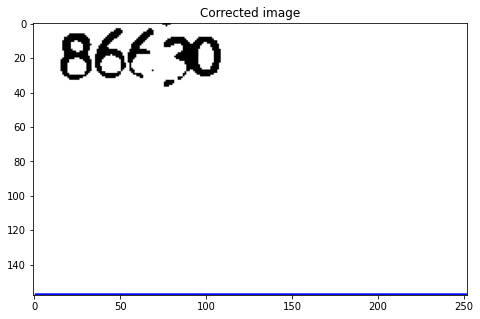

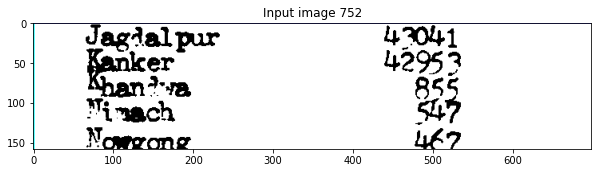

x [342, 752, 1041, 910, 0] [752, 910] 231.31578947368422
y [342, 752, 1041, 910, 0] [407, 578, 780, 1041] 228.0


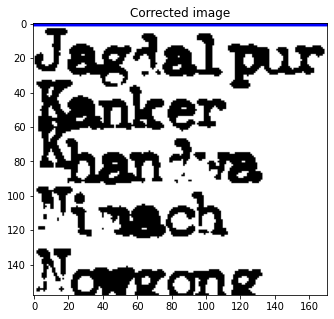

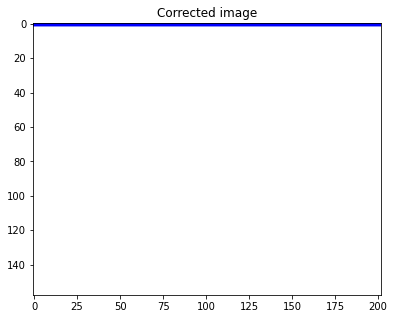

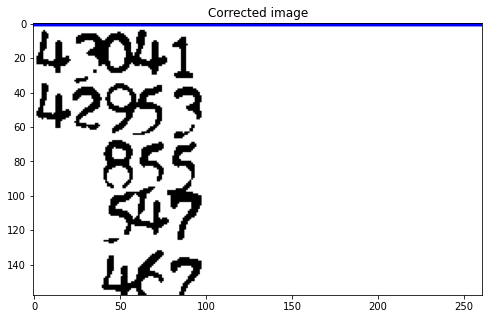

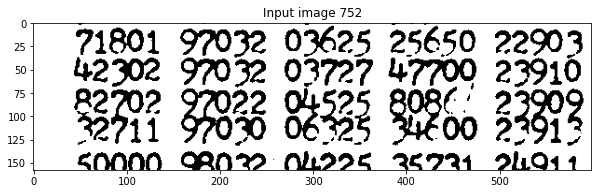

x [1863, 752, 2462, 910, 0] [752, 910] 231.31578947368422
y [1863, 752, 2462, 910, 0] [1863, 2462] 228.0


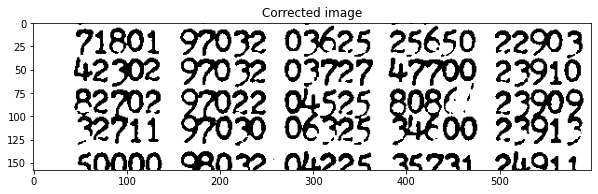

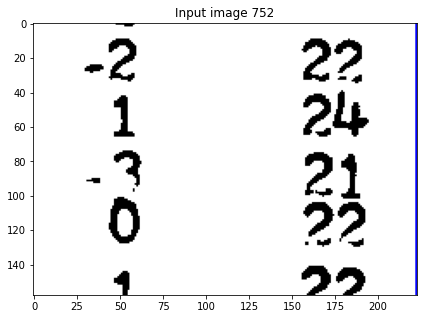

x [2820, 752, 3043, 910, 0] [752, 910] 231.31578947368422
y [2820, 752, 3043, 910, 0] [2883, 3043] 228.0


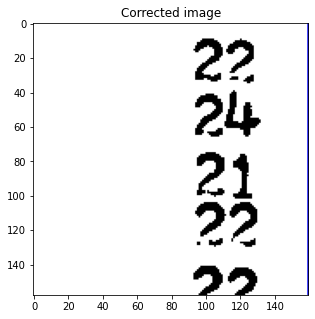

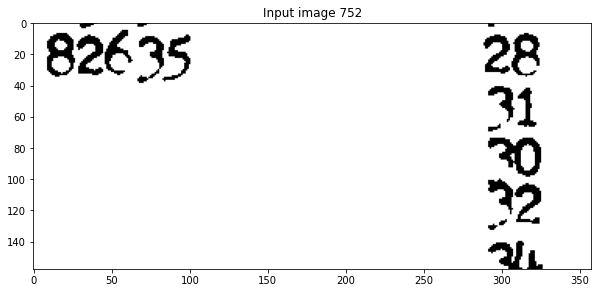

x [2462, 752, 2820, 910, 0] [752, 910] 231.31578947368422
y [2462, 752, 2820, 910, 0] [2461, 2820] 228.0


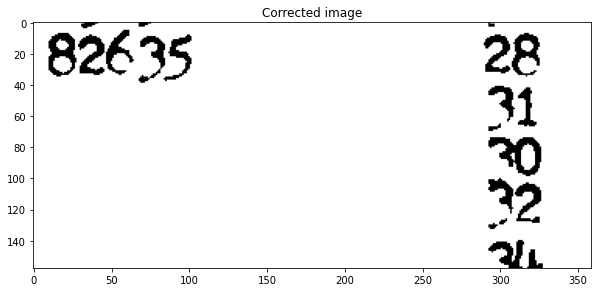

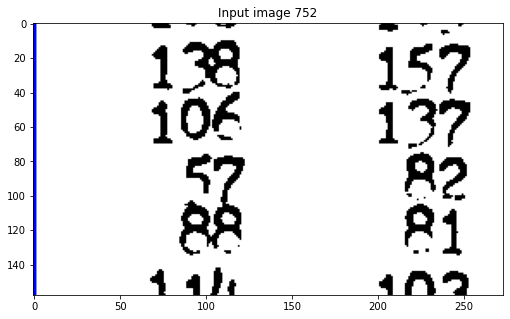

x [3659, 752, 3932, 910, 0] [752, 910] 231.31578947368422
y [3659, 752, 3932, 910, 0] [3659, 3932] 228.0


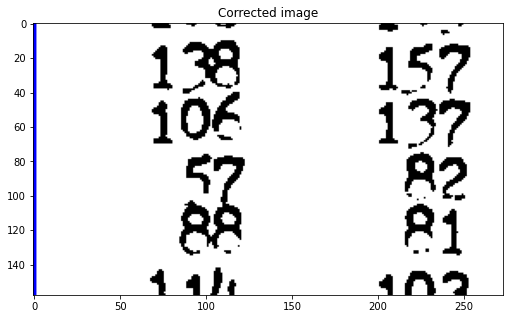

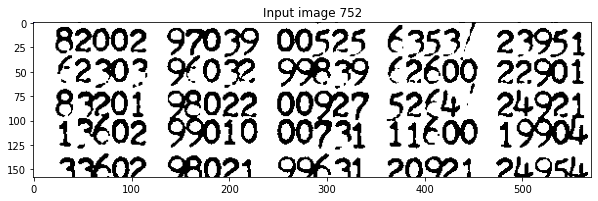

x [1041, 752, 1612, 910, 0] [752, 910] 231.31578947368422
y [1041, 752, 1612, 910, 0] [1041, 1612] 228.0


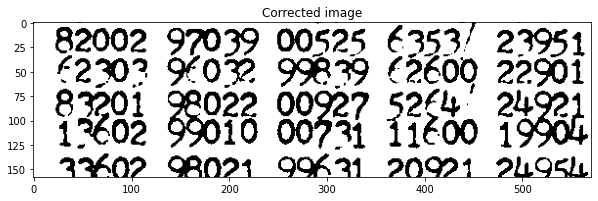

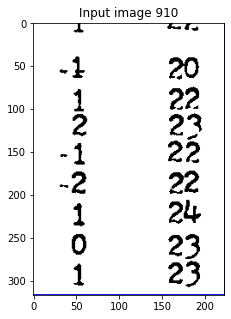

x [2820, 910, 3043, 1227, 0] [909, 1227] 231.31578947368422
y [2820, 910, 3043, 1227, 0] [2820, 3043] 228.0


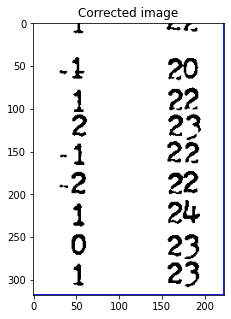

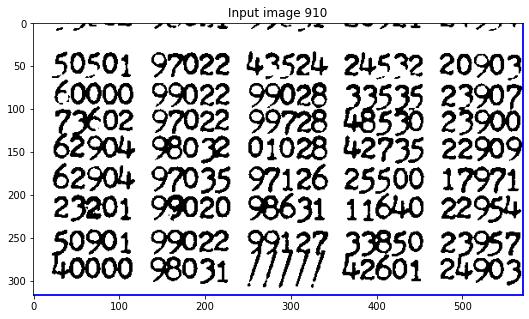

x [1041, 910, 1612, 1227, 0] [942, 1227] 231.31578947368422
y [1041, 910, 1612, 1227, 0] [1041, 1612] 228.0


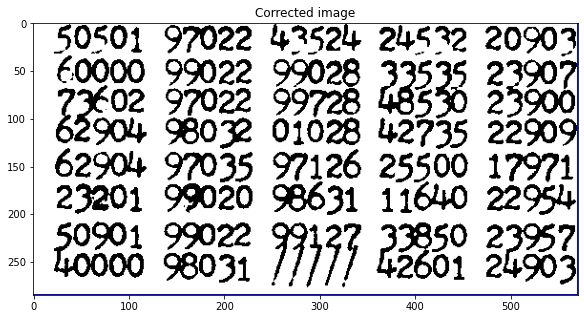

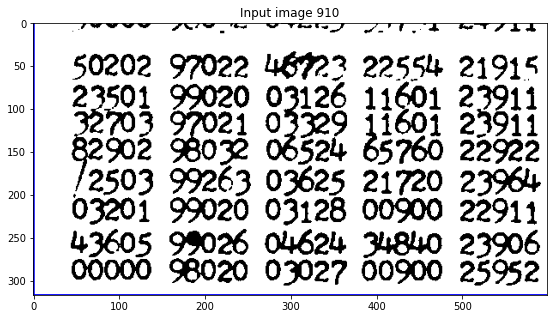

x [1863, 910, 2462, 1227, 0] [980, 1227] 231.31578947368422
y [1863, 910, 2462, 1227, 0] [1863, 2462] 228.0


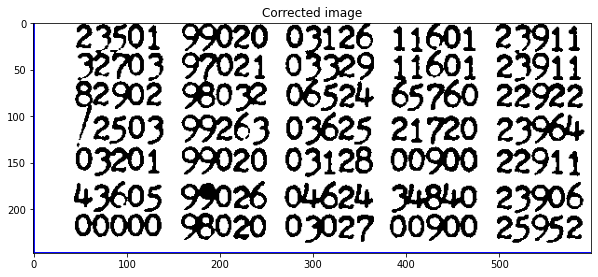

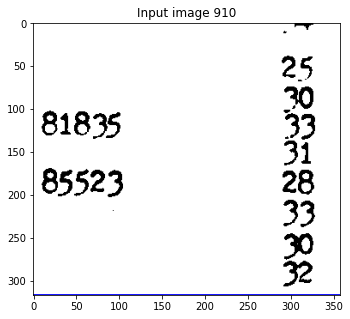

x [2462, 910, 2820, 1227, 0] [909, 1216] 231.31578947368422
y [2462, 910, 2820, 1227, 0] [2461, 2820] 228.0


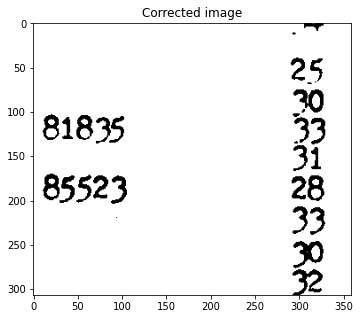

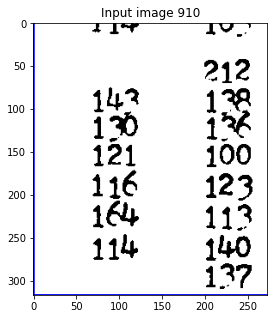

x [3659, 910, 3932, 1227, 0] [1048, 1227] 231.31578947368422
y [3659, 910, 3932, 1227, 0] [3659, 3932] 228.0


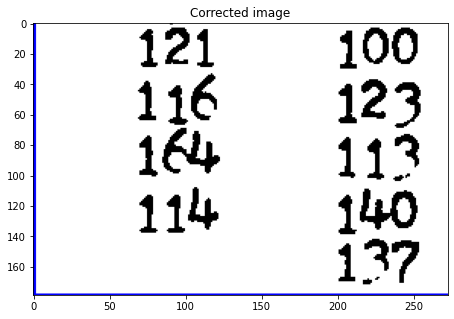

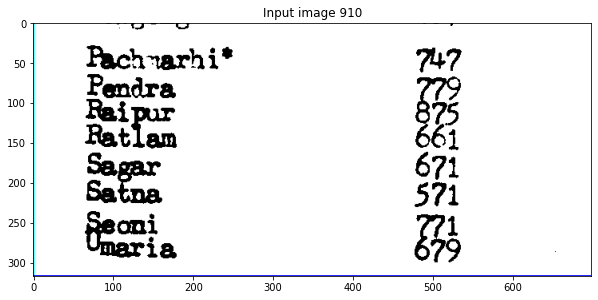

x [342, 910, 1041, 1227, 0] [977, 1227] 231.31578947368422
y [342, 910, 1041, 1227, 0] [406, 592, 1041] 228.0


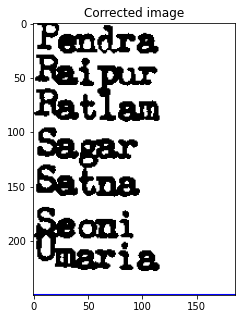

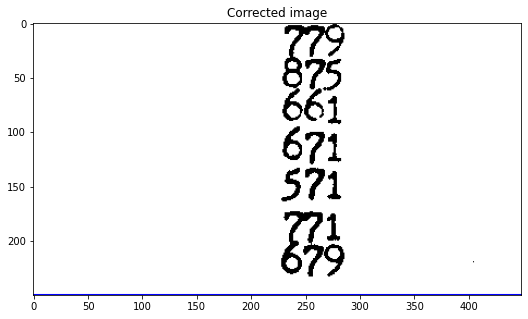

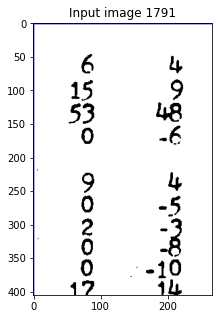

x [3393, 1791, 3659, 2196, 0] [1791, 2196] 231.31578947368422
y [3393, 1791, 3659, 2196, 0] [3486, 3659] 228.0


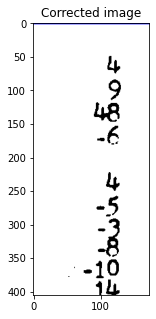

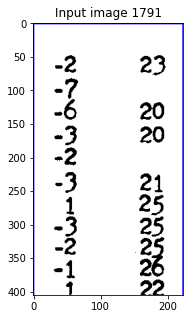

x [2820, 1791, 3043, 2196, 0] [1791, 2196] 231.31578947368422
y [2820, 1791, 3043, 2196, 0] [2820, 3043] 228.0


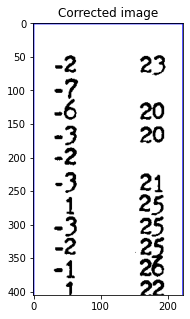

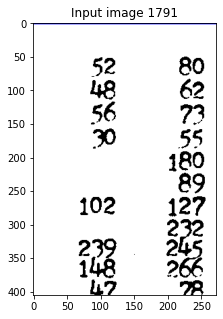

x [3659, 1791, 3932, 2196, 0] [1791, 2196] 231.31578947368422
y [3659, 1791, 3932, 2196, 0] [3659, 3932] 228.0


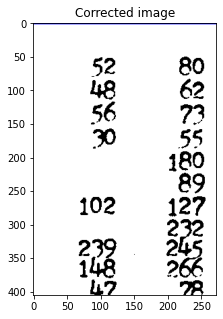

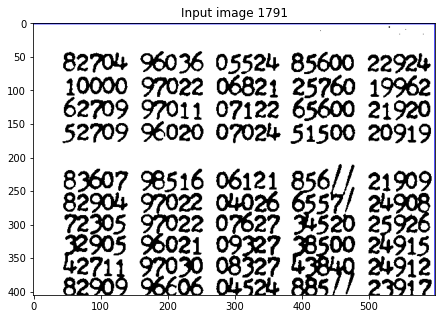

x [1863, 1791, 2462, 2196, 0] [1791, 2196] 231.31578947368422
y [1863, 1791, 2462, 2196, 0] [1905, 2458] 228.0


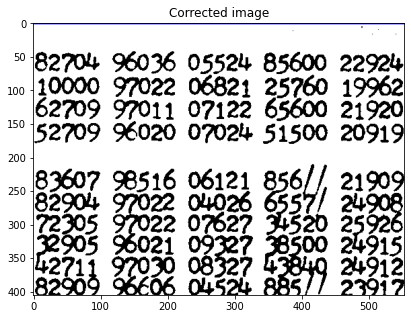

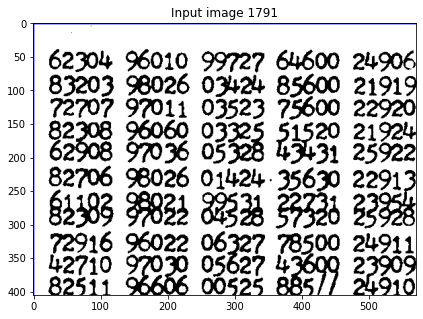

x [1041, 1791, 1612, 2196, 0] [1829, 2196] 231.31578947368422
y [1041, 1791, 1612, 2196, 0] [1041, 1612] 228.0


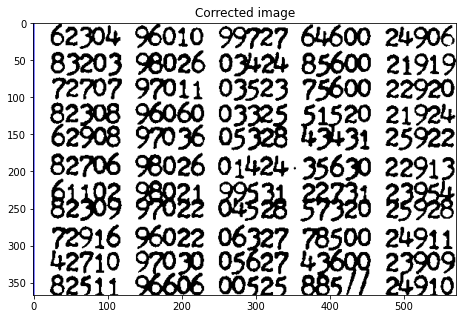

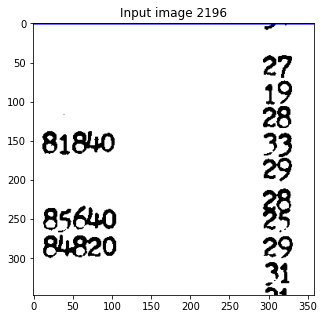

x [2462, 2196, 2820, 2543, 0] [2196, 2543] 231.31578947368422
y [2462, 2196, 2820, 2543, 0] [2461, 2820] 228.0


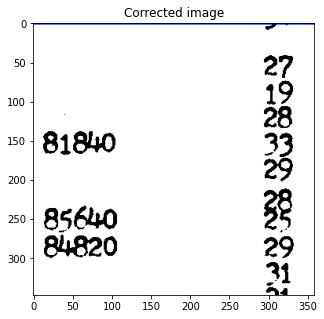

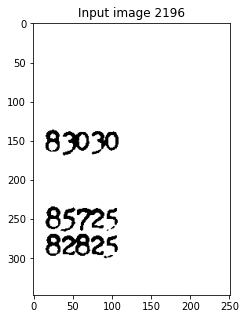

x [1612, 2196, 1863, 2543, 0] [2196, 2543] 231.31578947368422
y [1612, 2196, 1863, 2543, 0] [1611, 1863] 228.0


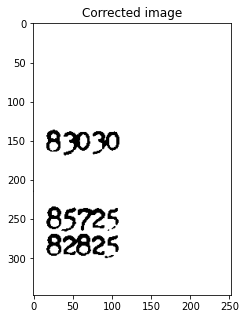

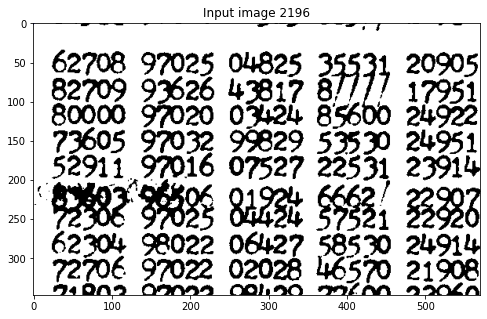

x [1041, 2196, 1612, 2543, 0] [2196, 2543] 231.31578947368422
y [1041, 2196, 1612, 2543, 0] [1041, 1612] 228.0


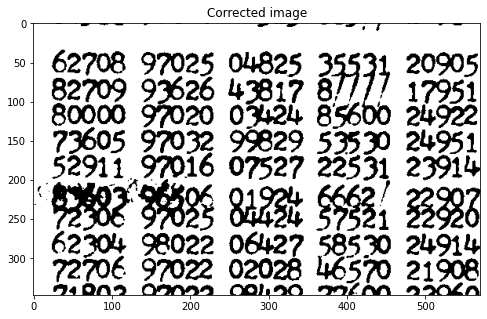

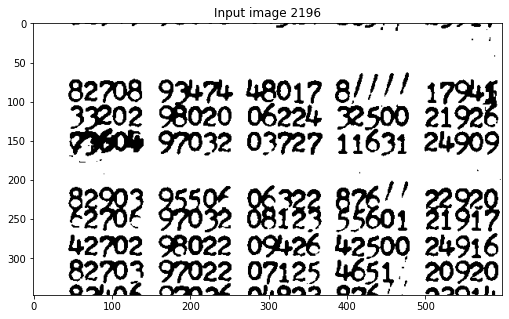

x [1863, 2196, 2462, 2543, 0] [2265, 2543] 231.31578947368422
y [1863, 2196, 2462, 2543, 0] [1863, 2462] 228.0


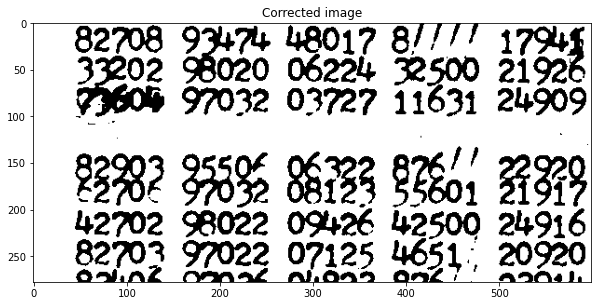

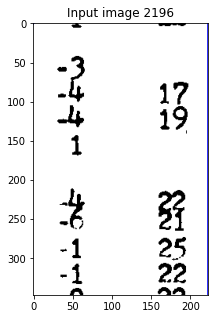

x [2820, 2196, 3043, 2543, 0] [2196, 2543] 231.31578947368422
y [2820, 2196, 3043, 2543, 0] [2820, 3043] 228.0


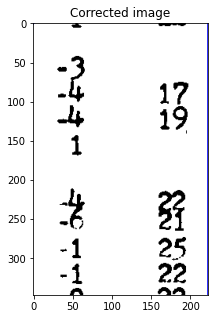

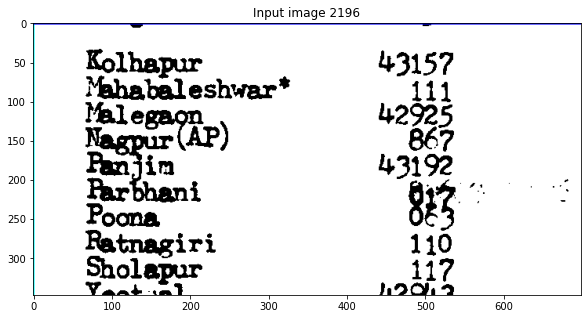

x [342, 2196, 1041, 2543, 0] [2196, 2543] 231.31578947368422
y [342, 2196, 1041, 2543, 0] [407, 627, 900] 228.0


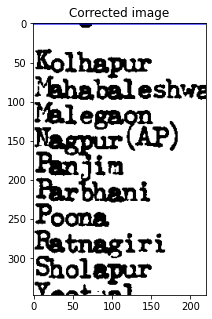

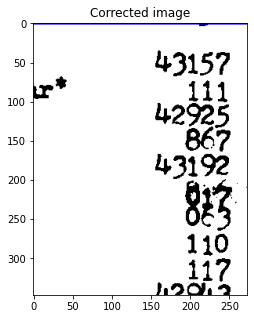

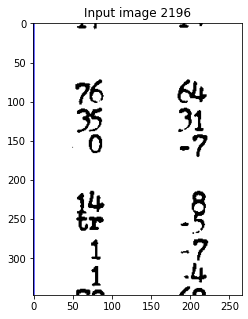

x [3393, 2196, 3659, 2543, 0] [2196, 2543] 231.31578947368422
y [3393, 2196, 3659, 2543, 0] [3484, 3659] 228.0


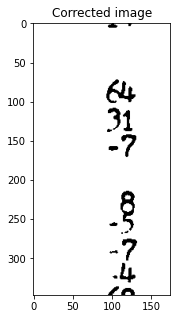

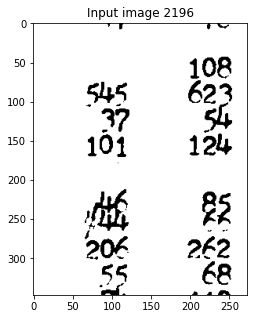

x [3659, 2196, 3932, 2543, 0] [2238, 2543] 231.31578947368422
y [3659, 2196, 3932, 2543, 0] [3659, 3932] 228.0


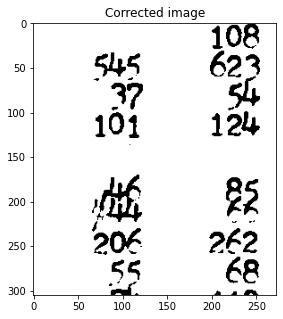

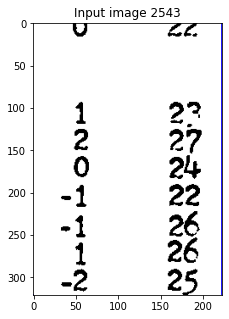

x [2820, 2543, 3043, 2864, 0] [2543, 2864] 231.31578947368422
y [2820, 2543, 3043, 2864, 0] [2820, 3043] 228.0


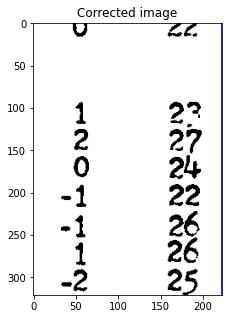

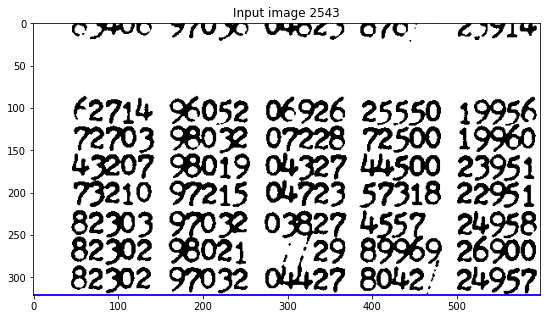

x [1863, 2543, 2462, 2864, 0] [2631, 2864] 231.31578947368422
y [1863, 2543, 2462, 2864, 0] [1863, 2462] 228.0


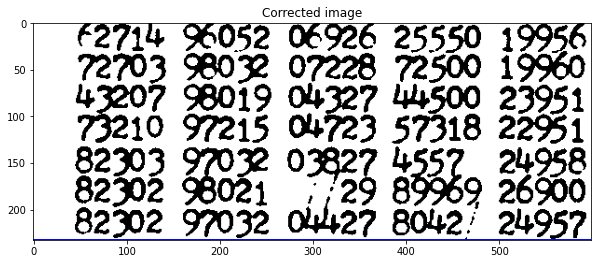

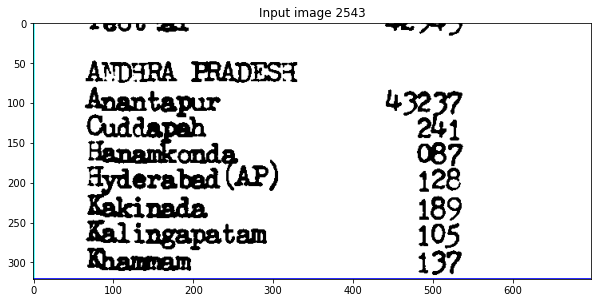

x [342, 2543, 1041, 2864, 0] [2628, 2864] 231.31578947368422
y [342, 2543, 1041, 2864, 0] [408, 676, 882] 228.0


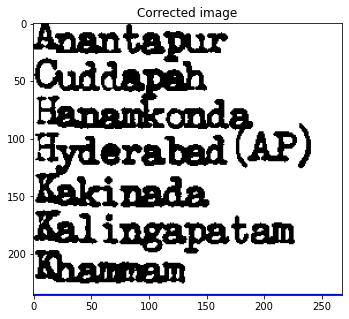

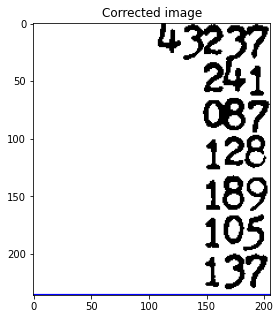

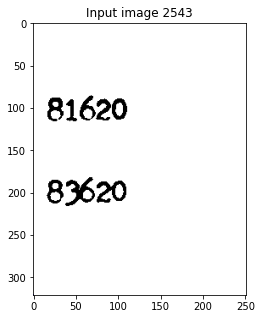

x [1612, 2543, 1863, 2864, 0] [2543, 2864] 231.31578947368422
y [1612, 2543, 1863, 2864, 0] [1611, 1863] 228.0


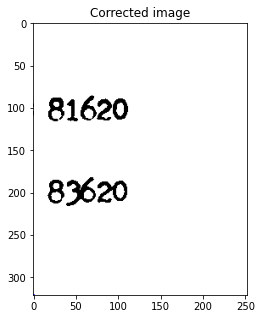

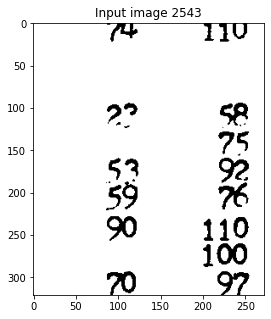

x [3659, 2543, 3932, 2864, 0] [2543, 2864] 231.31578947368422
y [3659, 2543, 3932, 2864, 0] [3659, 3932] 228.0


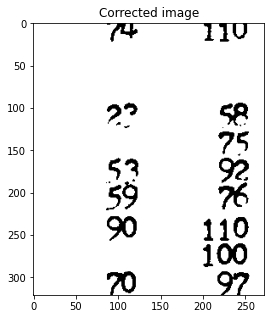

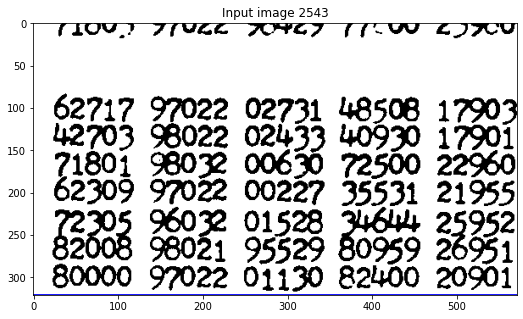

x [1041, 2543, 1612, 2864, 0] [2628, 2860] 231.31578947368422
y [1041, 2543, 1612, 2864, 0] [1041, 1612] 228.0


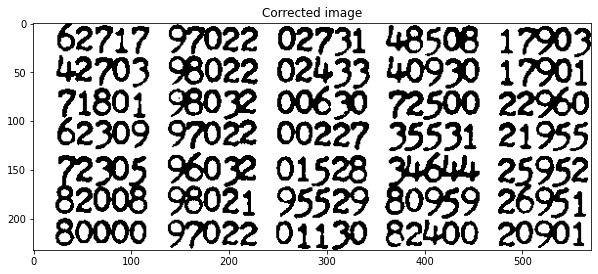

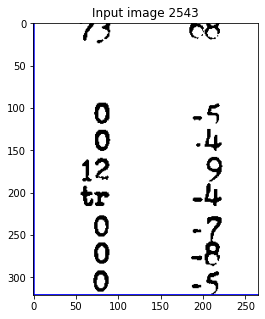

x [3393, 2543, 3659, 2864, 0] [2543, 2864] 231.31578947368422
y [3393, 2543, 3659, 2864, 0] [3485, 3659] 228.0


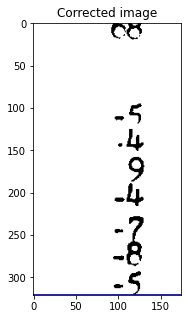

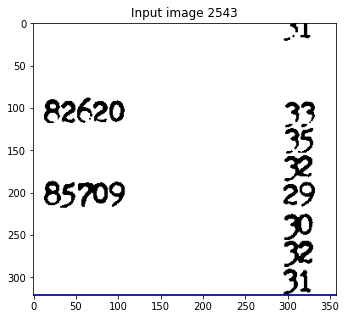

x [2462, 2543, 2820, 2864, 0] [2632, 2863] 231.31578947368422
y [2462, 2543, 2820, 2864, 0] [2461, 2820] 228.0


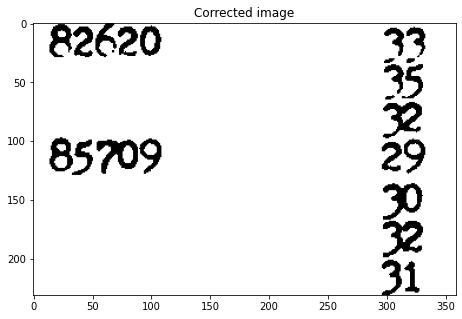

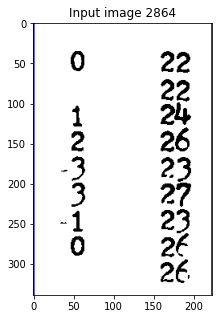

x [2820, 2864, 3043, 3203, 0] [2863, 3189] 231.31578947368422
y [2820, 2864, 3043, 3203, 0] [2820, 3043] 228.0


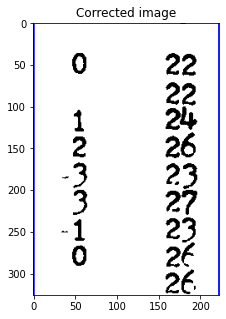

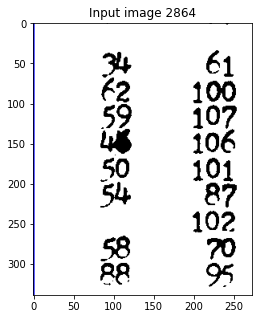

x [3659, 2864, 3932, 3203, 0] [2863, 3203] 231.31578947368422
y [3659, 2864, 3932, 3203, 0] [3659, 3932] 228.0


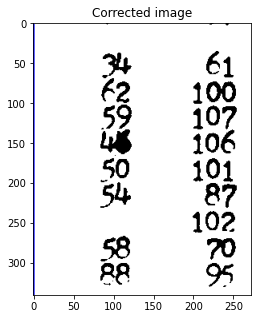

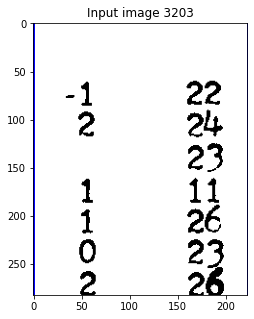

x [2820, 3203, 3043, 3486, 0] [3203, 3486] 231.31578947368422
y [2820, 3203, 3043, 3486, 0] [2820, 3043] 228.0


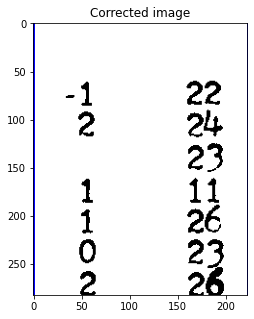

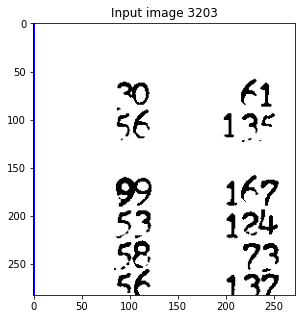

x [3659, 3203, 3932, 3486, 0] [3232, 3486] 231.31578947368422
y [3659, 3203, 3932, 3486, 0] [3659, 3932] 228.0


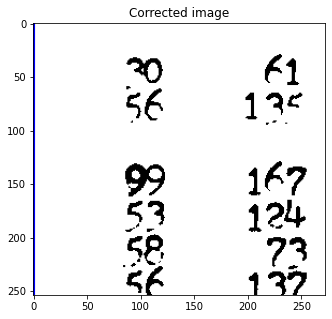

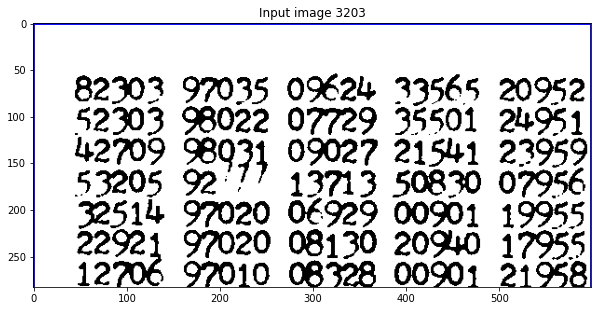

x [1863, 3203, 2462, 3486, 0] [3203, 3486] 231.31578947368422
y [1863, 3203, 2462, 3486, 0] [1863, 2462] 228.0


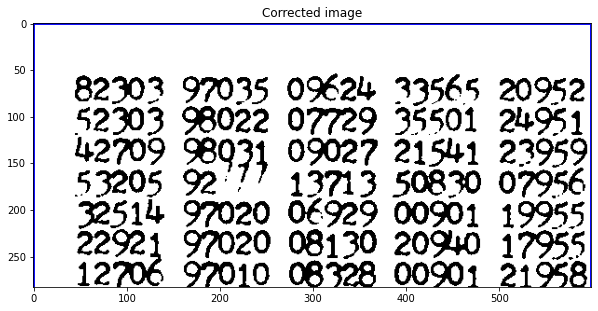

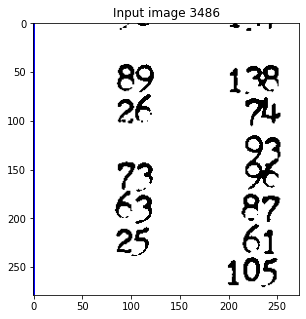

x [3659, 3486, 3932, 3765, 0] [3485, 3755] 231.31578947368422
y [3659, 3486, 3932, 3765, 0] [3659, 3932] 228.0


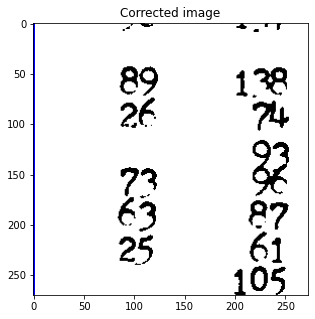

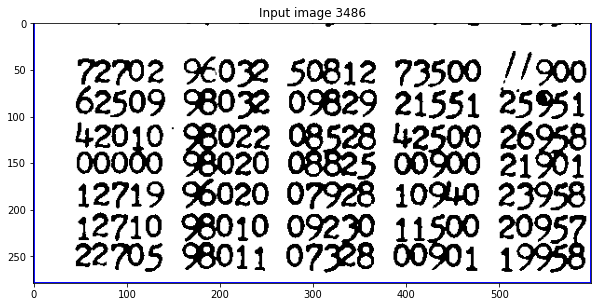

x [1863, 3486, 2462, 3765, 0] [3592, 3765] 231.31578947368422
y [1863, 3486, 2462, 3765, 0] [1863, 2462] 228.0


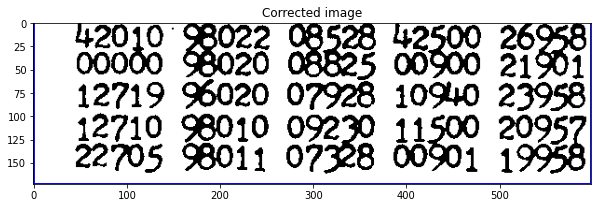

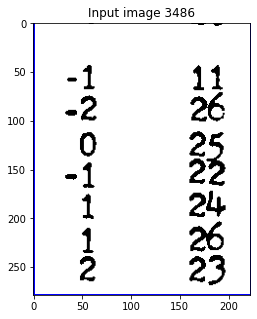

x [2820, 3486, 3043, 3765, 0] [3485, 3756] 231.31578947368422
y [2820, 3486, 3043, 3765, 0] [2820, 3043] 228.0


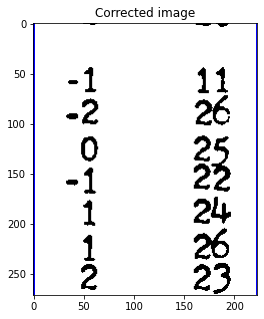

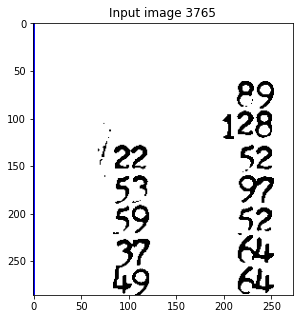

x [3659, 3765, 3932, 4051, 0] [3765, 4051] 231.31578947368422
y [3659, 3765, 3932, 4051, 0] [3659, 3932] 228.0


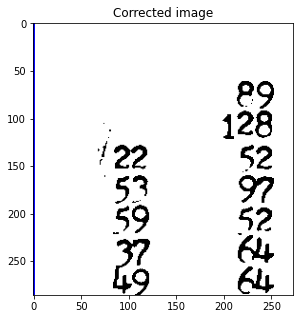

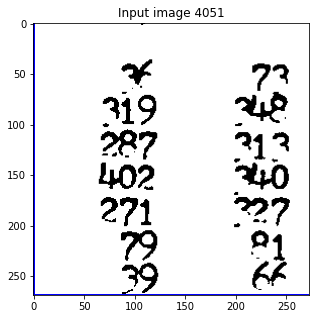

x [3659, 4051, 3932, 4320, 0] [4051, 4320] 231.31578947368422
y [3659, 4051, 3932, 4320, 0] [3659, 3932] 228.0


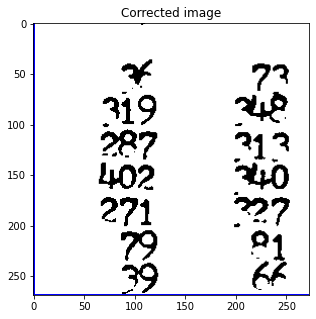

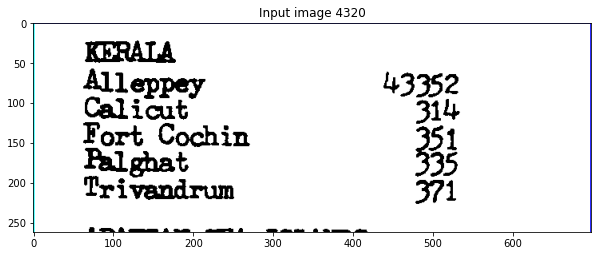

x [342, 4320, 1041, 4582, 0] [4320, 4582] 231.31578947368422
y [342, 4320, 1041, 4582, 0] [403, 615, 779, 1041] 228.0


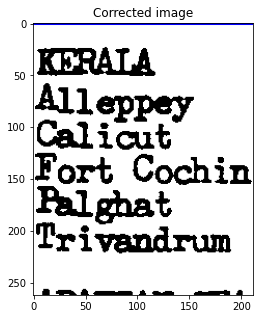

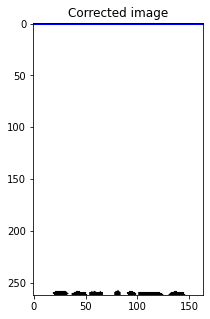

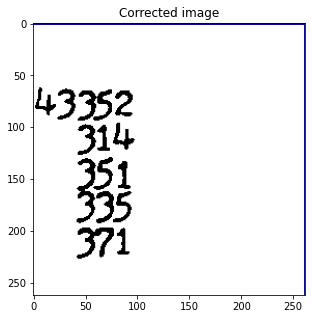

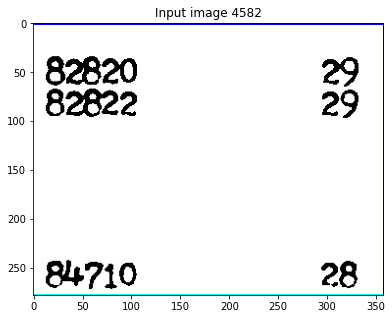

x [2462, 4582, 2820, 4860, 0] [4680, 4860] 231.31578947368422
y [2462, 4582, 2820, 4860, 0] [2461, 2820] 228.0


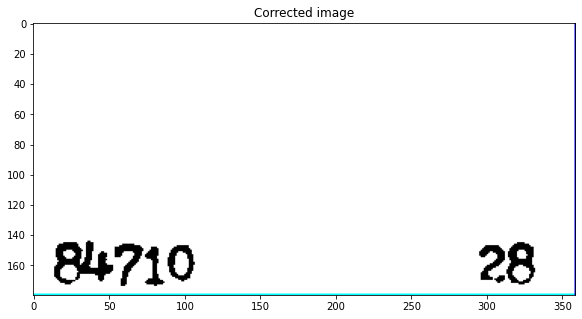

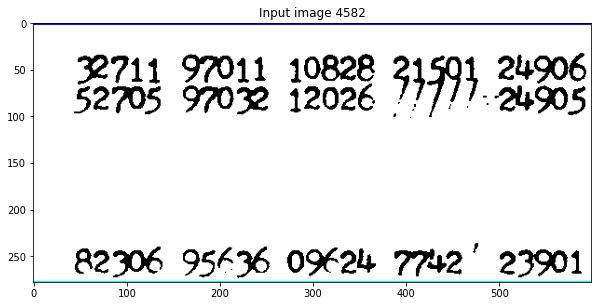

x [1863, 4582, 2462, 4860, 0] [4680, 4860] 231.31578947368422
y [1863, 4582, 2462, 4860, 0] [1863, 2462] 228.0


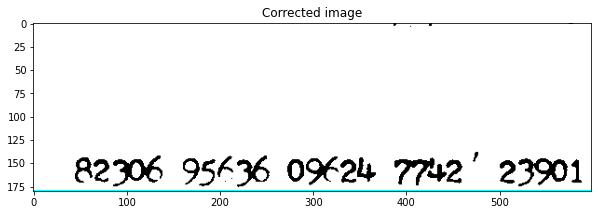

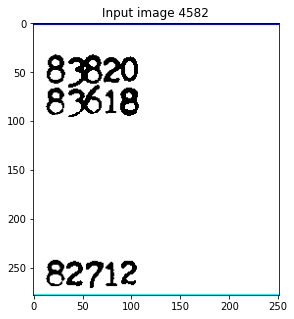

x [1612, 4582, 1863, 4860, 0] [4677, 4860] 231.31578947368422
y [1612, 4582, 1863, 4860, 0] [1611, 1863] 228.0


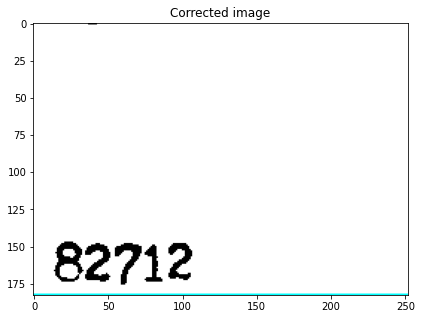

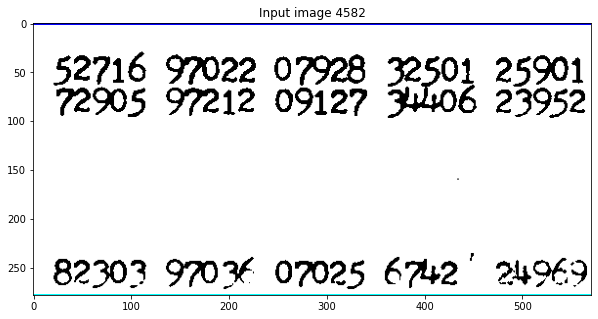

x [1041, 4582, 1612, 4860, 0] [4676, 4860] 231.31578947368422
y [1041, 4582, 1612, 4860, 0] [1041, 1612] 228.0


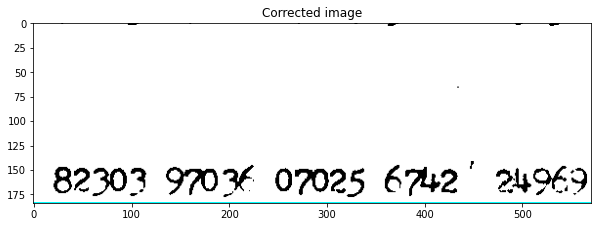

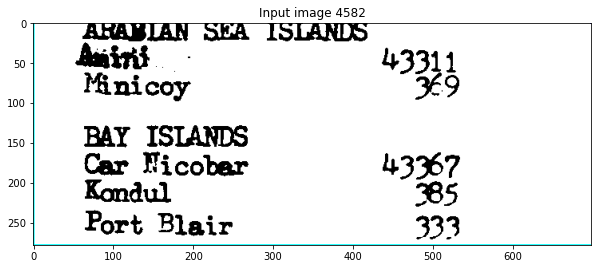

x [342, 4582, 1041, 4860, 0] [4582, 4860] 231.31578947368422
y [342, 4582, 1041, 4860, 0] [401, 770, 1041] 228.0


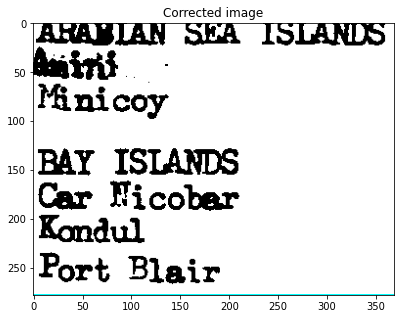

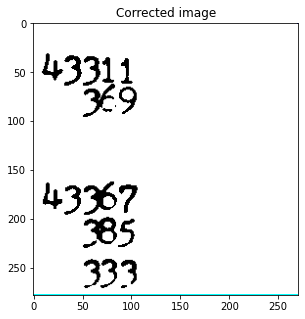

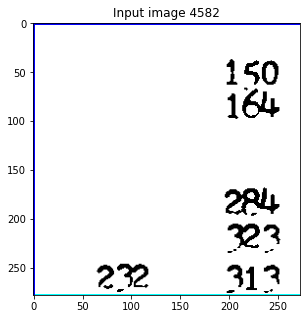

x [3659, 4582, 3932, 4860, 0] [4582, 4860] 231.31578947368422
y [3659, 4582, 3932, 4860, 0] [3769, 3932] 228.0


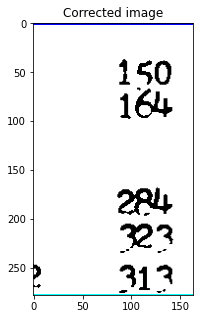

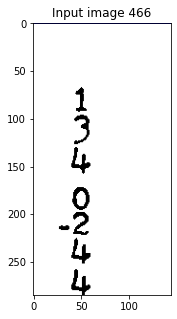

x [3048, 466, 3192, 751, 0, [[752], [[342, 465, 1041, 752, 0], [3197, 465, 3393, 752, 0]]], [1, 1, 1, 1]] [466, 751] 231.31578947368422
y [3048, 466, 3192, 751, 0, [[752], [[342, 465, 1041, 752, 0], [3197, 465, 3393, 752, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


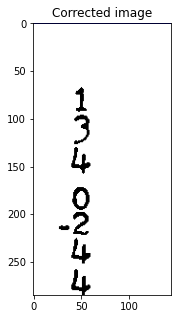

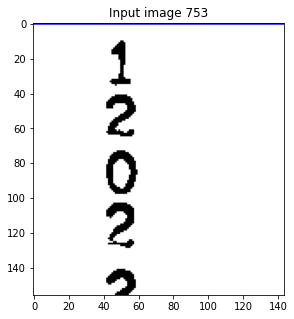

x [3048, 753, 3192, 909, 0, [[465, 910], [[3197, 752, 3393, 910, 0]]], [1, 1, 1, 1]] [753, 909] 231.31578947368422
y [3048, 753, 3192, 909, 0, [[465, 910], [[3197, 752, 3393, 910, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


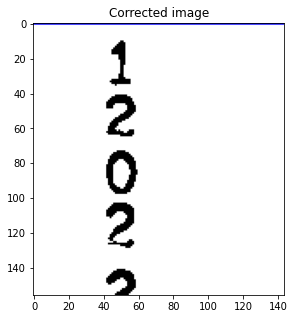

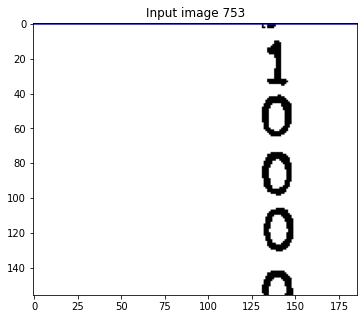

x [3202, 753, 3388, 909, 0, [[465, 910], [[3043, 752, 3197, 910, 0], [3393, 752, 3659, 910, 0]]], [1, 1, 1, 1]] [753, 909] 231.31578947368422
y [3202, 753, 3388, 909, 0, [[465, 910], [[3043, 752, 3197, 910, 0], [3393, 752, 3659, 910, 0]]], [1, 1, 1, 1]] [3202, 3388] 228.0


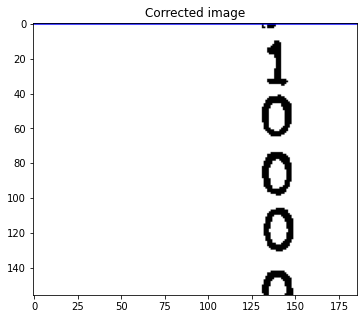

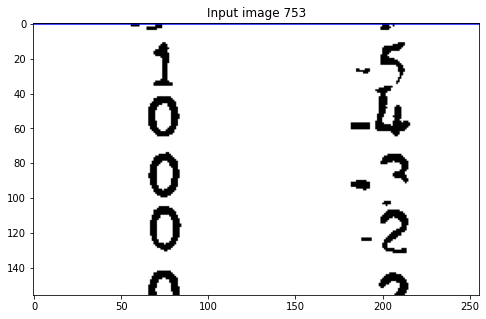

x [3398, 753, 3654, 909, 0, [[465, 910], []], [1, 1, 1, 1]] [753, 909] 231.31578947368422
y [3398, 753, 3654, 909, 0, [[465, 910], []], [1, 1, 1, 1]] [3484, 3654] 228.0


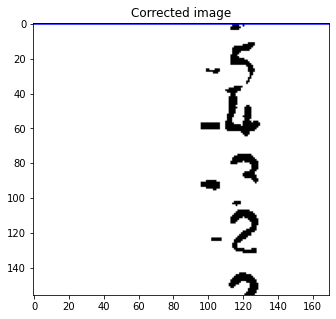

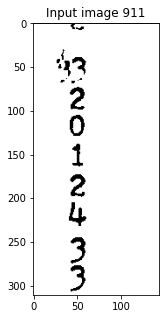

x [3048, 911, 3192, 1222, 0, [[752, 1227], [[1612, 910, 1863, 1227, 0], [3197, 910, 3393, 1227, 0]]], [1, 1, 1, 1]] [911, 1222] 231.31578947368422
y [3048, 911, 3192, 1222, 0, [[752, 1227], [[1612, 910, 1863, 1227, 0], [3197, 910, 3393, 1227, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


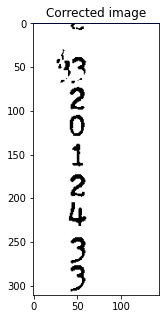

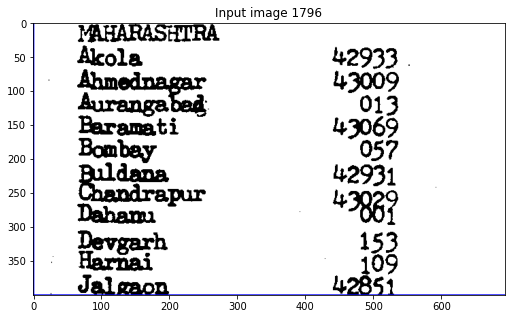

x [342, 1796, 1036, 2196, 0, [[1227, 2196], [[2462, 1791, 2820, 2196, 0]]], [5, 1, 1, 0]] [1899, 2196] 231.31578947368422
y [342, 1796, 1036, 2196, 0, [[1227, 2196], [[2462, 1791, 2820, 2196, 0]]], [5, 1, 1, 0]] [406, 617, 780, 1036] 228.0


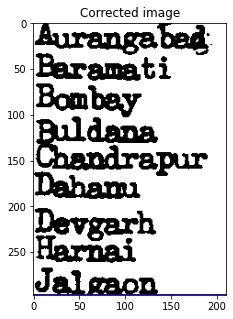

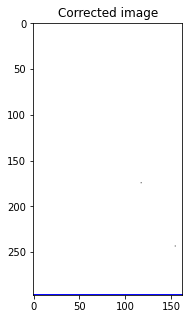

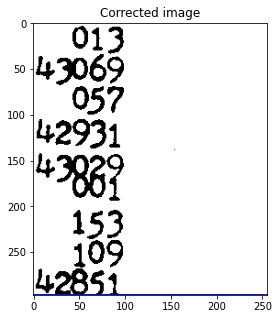

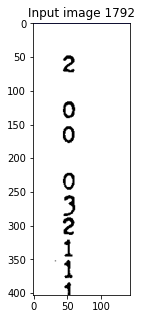

x [3048, 1792, 3192, 2195, 0, [[1227, 2196], [[2462, 1791, 2820, 2196, 0], [3197, 1791, 3393, 2196, 0]]], [1, 1, 1, 1]] [1792, 2195] 231.31578947368422
y [3048, 1792, 3192, 2195, 0, [[1227, 2196], [[2462, 1791, 2820, 2196, 0], [3197, 1791, 3393, 2196, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


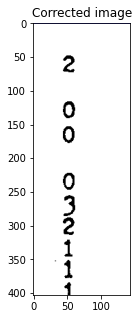

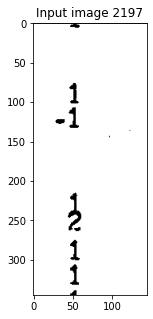

x [3048, 2197, 3192, 2542, 0, [[1791, 2543], [[3197, 2196, 3393, 2543, 0]]], [1, 1, 1, 1]] [2197, 2542] 231.31578947368422
y [3048, 2197, 3192, 2542, 0, [[1791, 2543], [[3197, 2196, 3393, 2543, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


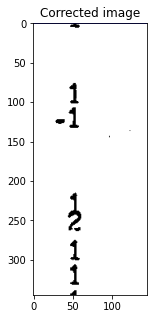

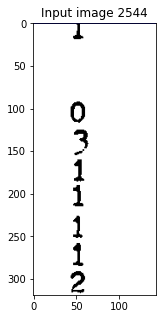

x [3048, 2544, 3192, 2863, 0, [[2196, 2864], [[3197, 2543, 3393, 2864, 0]]], [1, 1, 1, 1]] [2544, 2863] 231.31578947368422
y [3048, 2544, 3192, 2863, 0, [[2196, 2864], [[3197, 2543, 3393, 2864, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


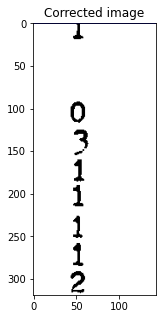

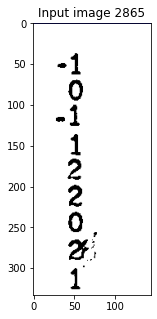

x [3048, 2865, 3192, 3198, 0, [[2543, 3203], [[2462, 2864, 2820, 3203, 0], [3197, 2864, 3393, 3203, 0]]], [1, 1, 1, 1]] [2864, 3192] 231.31578947368422
y [3048, 2865, 3192, 3198, 0, [[2543, 3203], [[2462, 2864, 2820, 3203, 0], [3197, 2864, 3393, 3203, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


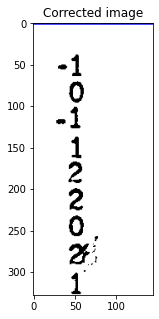

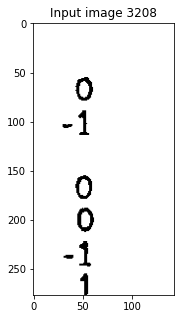

x [3048, 3208, 3192, 3485, 0, [[2864, 3486], [[2462, 3203, 2820, 3486, 0], [3197, 3203, 3393, 3486, 0]]], [1, 1, 1, 1]] [3208, 3485] 231.31578947368422
y [3048, 3208, 3192, 3485, 0, [[2864, 3486], [[2462, 3203, 2820, 3486, 0], [3197, 3203, 3393, 3486, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


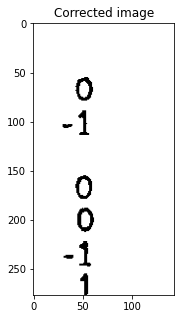

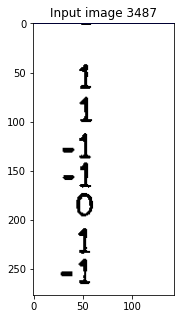

x [3048, 3487, 3192, 3764, 0, [[3203, 3765], [[2462, 3486, 2820, 3765, 0], [3197, 3486, 3393, 3765, 0]]], [1, 1, 1, 1]] [3487, 3764] 231.31578947368422
y [3048, 3487, 3192, 3764, 0, [[3203, 3765], [[2462, 3486, 2820, 3765, 0], [3197, 3486, 3393, 3765, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


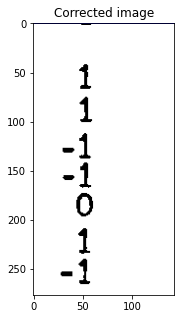

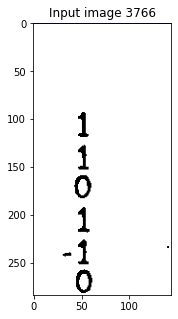

x [3048, 3766, 3192, 4050, 0, [[3486, 4051], [[2820, 3765, 3043, 4051, 0], [3197, 3765, 3393, 4051, 0]]], [1, 1, 1, 1]] [3775, 4050] 231.31578947368422
y [3048, 3766, 3192, 4050, 0, [[3486, 4051], [[2820, 3765, 3043, 4051, 0], [3197, 3765, 3393, 4051, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


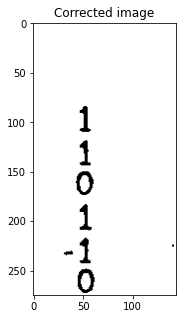

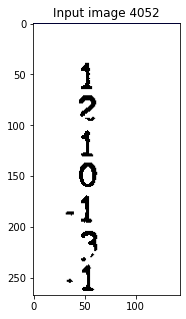

x [3048, 4052, 3192, 4319, 0, [[3765, 4320], [[2820, 4051, 3043, 4320, 0], [3197, 4051, 3393, 4320, 0]]], [1, 1, 1, 1]] [4052, 4319] 231.31578947368422
y [3048, 4052, 3192, 4319, 0, [[3765, 4320], [[2820, 4051, 3043, 4320, 0], [3197, 4051, 3393, 4320, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


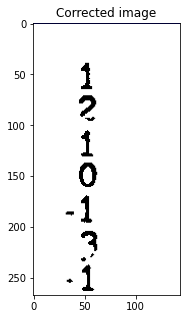

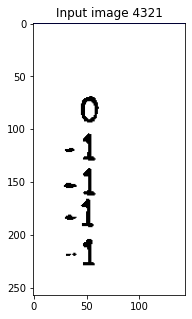

x [3048, 4321, 3192, 4578, 0, [[4051, 4582], [[2820, 4320, 3043, 4582, 0], [3197, 4320, 3393, 4582, 0]]], [1, 1, 1, 1]] [4386, 4578] 231.31578947368422
y [3048, 4321, 3192, 4578, 0, [[4051, 4582], [[2820, 4320, 3043, 4582, 0], [3197, 4320, 3393, 4582, 0]]], [1, 1, 1, 1]] [3048, 3192] 228.0


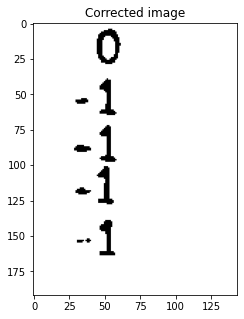

In [77]:
new_corrected_cells = []
for imagedraw in error_corrected_cells+not_overlap_error_cells:#
    
    croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
    plt.rcParams["figure.figsize"] = (10,5)
    plt.imshow(croppedimage_full)
    plt.title(f'Input image {imagedraw[1]}')
    plt.show()
    
    possible_cells = segment_image(image, imagedraw, masks[1], average_cordinates)
    new_corrected_cells +=possible_cells
    
    for cell in possible_cells:
        croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]
        plt.rcParams["figure.figsize"] = (10,5)
        plt.imshow(croppedimage_full)
        plt.title(f'Corrected image')
        plt.show()
    

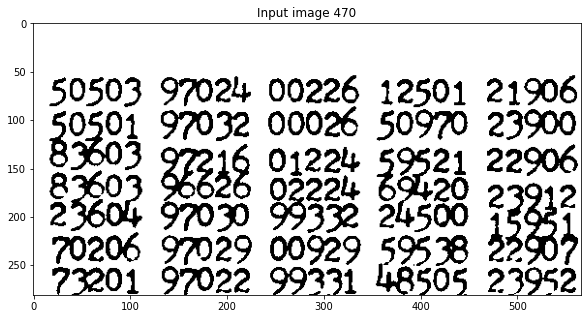

x [1046, 470, 1612, 751, 0, [[466], [[1612, 465, 1863, 752, 0]]], [1, 1, 0, 1]] [470, 751] 231.31578947368422
y [1046, 470, 1612, 751, 0, [[466], [[1612, 465, 1863, 752, 0]]], [1, 1, 0, 1]] [1046, 1612] 228.0


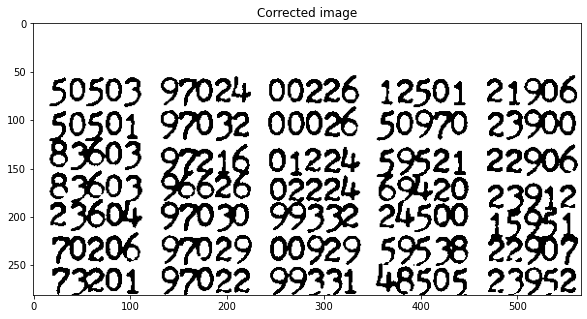

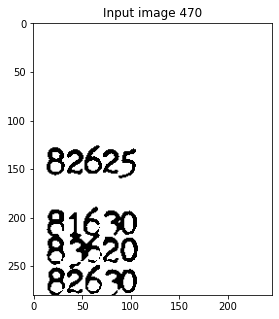

x [1612, 470, 1858, 750, 0, [[466], [[1041, 465, 1612, 752, 0], [1863, 465, 2462, 752, 0]]], [0, 1, 1, 1]] [470, 750] 231.31578947368422
y [1612, 470, 1858, 750, 0, [[466], [[1041, 465, 1612, 752, 0], [1863, 465, 2462, 752, 0]]], [0, 1, 1, 1]] [1611, 1858] 228.0


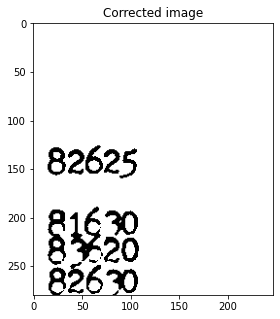

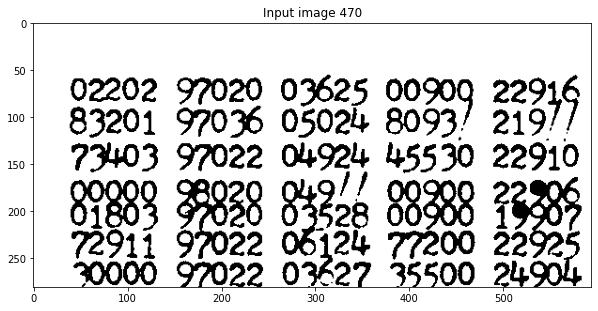

x [1868, 470, 2462, 751, 0, [[466], [[1612, 465, 1863, 752, 0], [2462, 465, 2820, 752, 0]]], [1, 1, 0, 1]] [470, 751] 231.31578947368422
y [1868, 470, 2462, 751, 0, [[466], [[1612, 465, 1863, 752, 0], [2462, 465, 2820, 752, 0]]], [1, 1, 0, 1]] [1868, 2462] 228.0


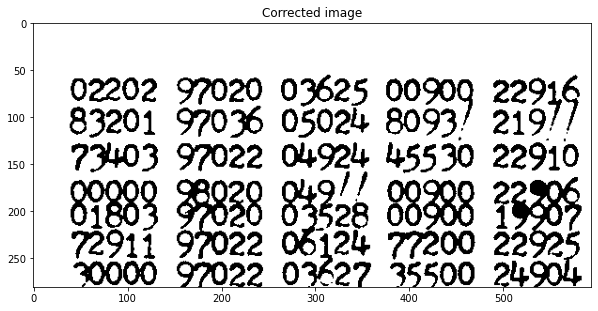

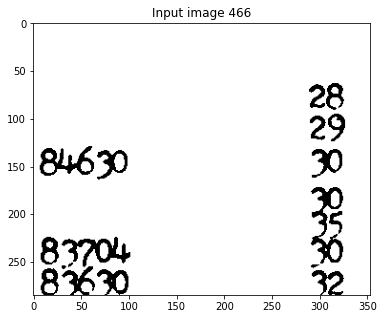

x [2462, 466, 2815, 751, 0, [[466], [[1863, 465, 2462, 752, 0], [2820, 465, 3043, 752, 0]]], [0, 1, 1, 1]] [466, 751] 231.31578947368422
y [2462, 466, 2815, 751, 0, [[466], [[1863, 465, 2462, 752, 0], [2820, 465, 3043, 752, 0]]], [0, 1, 1, 1]] [2461, 2815] 228.0


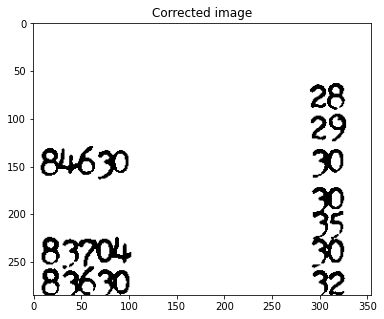

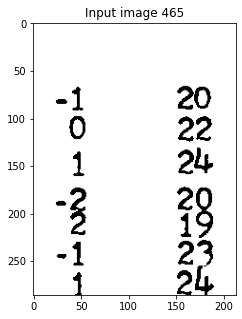

x [2825, 465, 3038, 751, 0, [[466], [[2462, 465, 2820, 752, 0], [3659, 465, 3932, 752, 0]]], [1, 0, 1, 1]] [465, 751] 231.31578947368422
y [2825, 465, 3038, 751, 0, [[466], [[2462, 465, 2820, 752, 0], [3659, 465, 3932, 752, 0]]], [1, 0, 1, 1]] [2825, 3038] 228.0


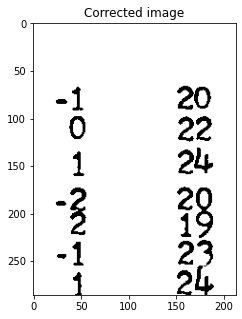

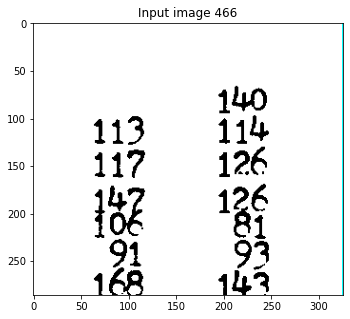

x [3664, 466, 3990, 752, 0, [[466], []], [1, 1, 5, 0]] [466, 752] 231.31578947368422
y [3664, 466, 3990, 752, 0, [[466], []], [1, 1, 5, 0]] [3664, 3990] 228.0


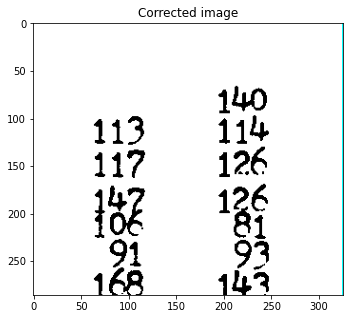

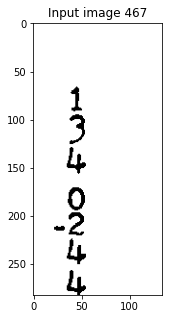

x [3053, 467, 3187, 750, 0, [[465, 752], []], [1, 1, 1, 1]] [467, 750] 231.31578947368422
y [3053, 467, 3187, 750, 0, [[465, 752], []], [1, 1, 1, 1]] [3053, 3187] 228.0


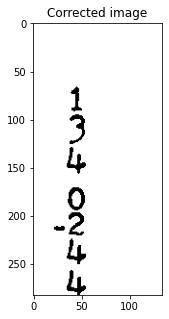

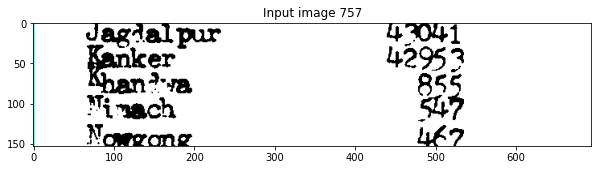

x [342, 757, 1036, 910, 0, [[466, 753], [[1041, 752, 1612, 910, 0]]], [5, 1, 1, 0]] [757, 910] 231.31578947368422
y [342, 757, 1036, 910, 0, [[466, 753], [[1041, 752, 1612, 910, 0]]], [5, 1, 1, 0]] [407, 578, 780, 1036] 228.0


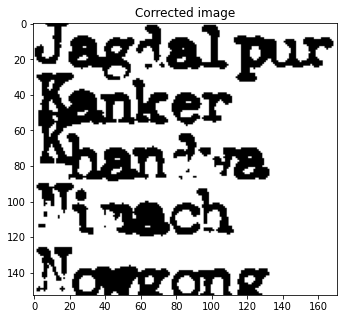

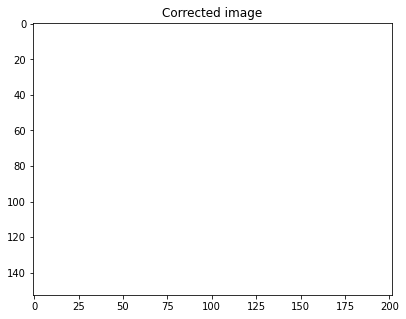

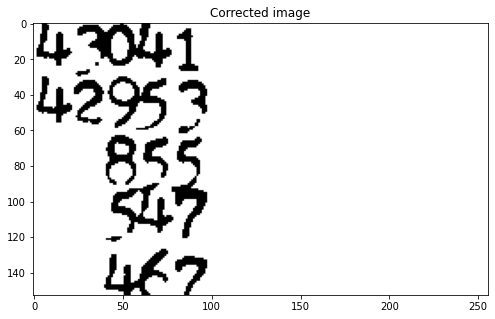

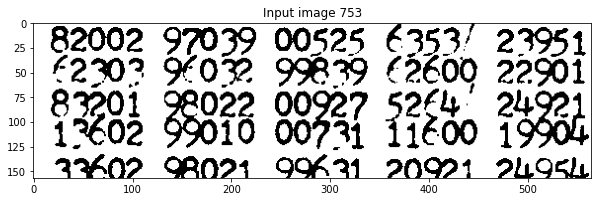

x [1046, 753, 1611, 910, 0, [[466, 753], [[342, 752, 1041, 910, 0], [1612, 752, 1863, 910, 0]]], [1, 1, 1, 0]] [753, 910] 231.31578947368422
y [1046, 753, 1611, 910, 0, [[466, 753], [[342, 752, 1041, 910, 0], [1612, 752, 1863, 910, 0]]], [1, 1, 1, 0]] [1046, 1611] 228.0


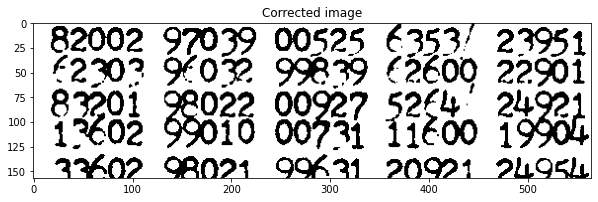

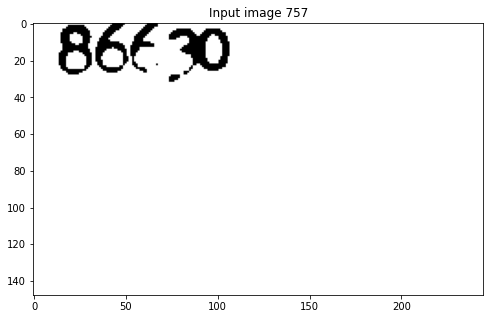

x [1613, 757, 1858, 905, 0, [[466, 753], [[1041, 752, 1612, 910, 0], [1863, 752, 2462, 910, 0]]], [1, 1, 1, 1]] [757, 905] 231.31578947368422
y [1613, 757, 1858, 905, 0, [[466, 753], [[1041, 752, 1612, 910, 0], [1863, 752, 2462, 910, 0]]], [1, 1, 1, 1]] [1612, 1858] 228.0


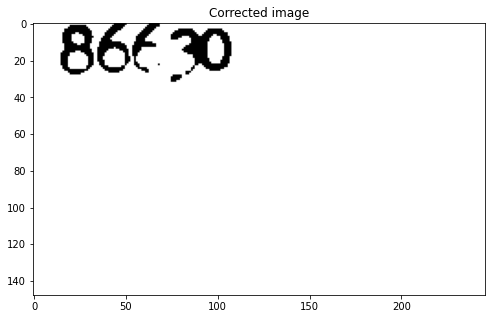

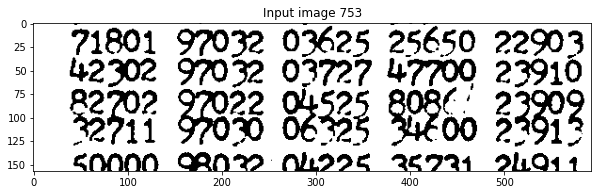

x [1868, 753, 2461, 910, 0, [[466, 753], [[1612, 752, 1863, 910, 0], [2462, 752, 2820, 910, 0]]], [1, 1, 1, 0]] [753, 910] 231.31578947368422
y [1868, 753, 2461, 910, 0, [[466, 753], [[1612, 752, 1863, 910, 0], [2462, 752, 2820, 910, 0]]], [1, 1, 1, 0]] [1868, 2461] 228.0


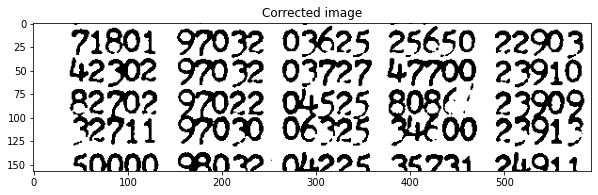

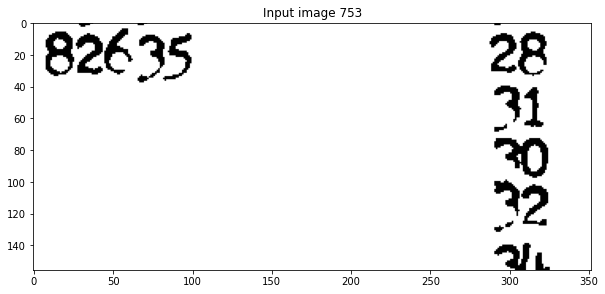

x [2463, 753, 2815, 909, 0, [[466, 753], [[1863, 752, 2462, 910, 0], [2820, 752, 3043, 910, 0]]], [1, 1, 1, 1]] [753, 909] 231.31578947368422
y [2463, 753, 2815, 909, 0, [[466, 753], [[1863, 752, 2462, 910, 0], [2820, 752, 3043, 910, 0]]], [1, 1, 1, 1]] [2462, 2815] 228.0


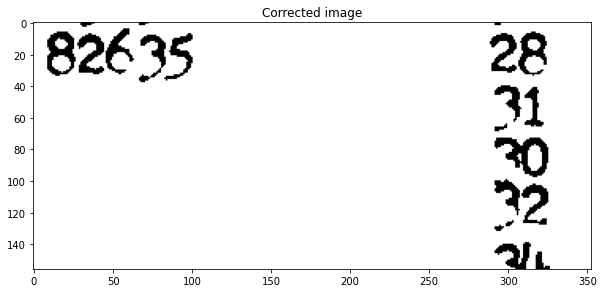

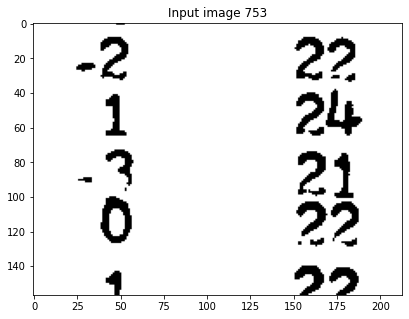

x [2825, 753, 3038, 910, 0, [[466, 753], [[2462, 752, 2820, 910, 0], [3659, 752, 3932, 910, 0]]], [1, 1, 1, 0]] [753, 910] 231.31578947368422
y [2825, 753, 3038, 910, 0, [[466, 753], [[2462, 752, 2820, 910, 0], [3659, 752, 3932, 910, 0]]], [1, 1, 1, 0]] [2825, 3038] 228.0


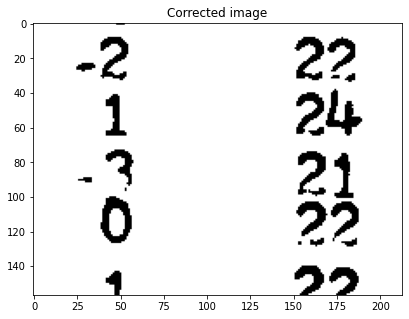

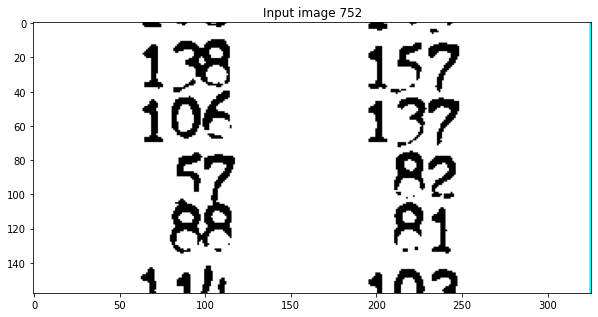

x [3664, 752, 3990, 910, 0, [[466, 753], []], [1, 0, 5, 0]] [752, 910] 231.31578947368422
y [3664, 752, 3990, 910, 0, [[466, 753], []], [1, 0, 5, 0]] [3664, 3990] 228.0


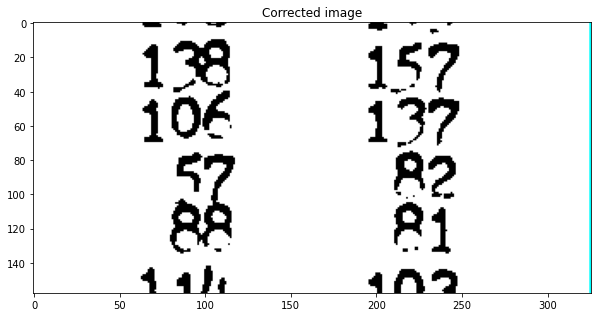

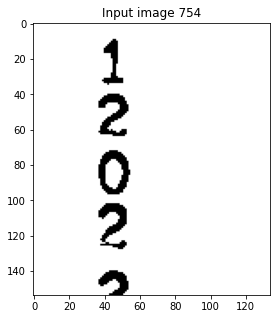

x [3053, 754, 3187, 908, 0, [[752, 910], [[3202, 753, 3388, 909, 0]]], [1, 1, 1, 1]] [754, 908] 231.31578947368422
y [3053, 754, 3187, 908, 0, [[752, 910], [[3202, 753, 3388, 909, 0]]], [1, 1, 1, 1]] [3053, 3187] 228.0


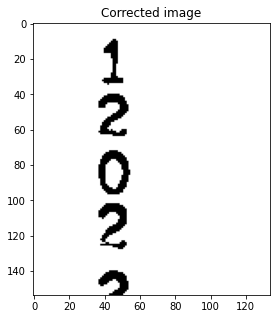

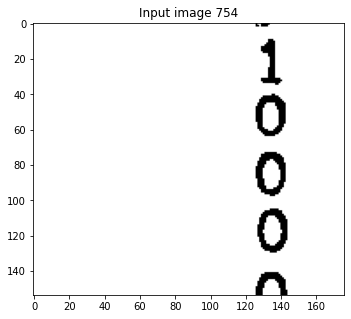

x [3207, 754, 3383, 908, 0, [[752, 910], [[3048, 753, 3192, 909, 0], [3398, 753, 3654, 909, 0]]], [1, 1, 1, 1]] [754, 908] 231.31578947368422
y [3207, 754, 3383, 908, 0, [[752, 910], [[3048, 753, 3192, 909, 0], [3398, 753, 3654, 909, 0]]], [1, 1, 1, 1]] [3207, 3383] 228.0


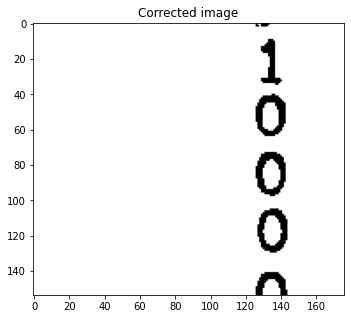

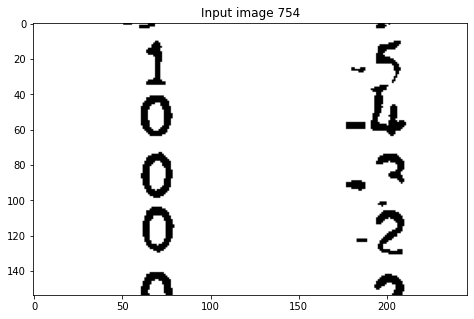

x [3403, 754, 3649, 908, 0, [[752, 910], []], [1, 1, 1, 1]] [754, 908] 231.31578947368422
y [3403, 754, 3649, 908, 0, [[752, 910], []], [1, 1, 1, 1]] [3484, 3649] 228.0


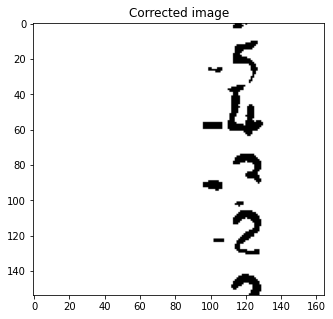

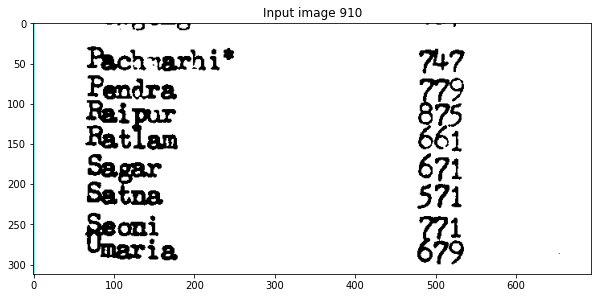

x [342, 910, 1036, 1222, 0, [[753, 911], [[1041, 910, 1612, 1227, 0]]], [5, 0, 1, 1]] [977, 1222] 231.31578947368422
y [342, 910, 1036, 1222, 0, [[753, 911], [[1041, 910, 1612, 1227, 0]]], [5, 0, 1, 1]] [406, 592, 1036] 228.0


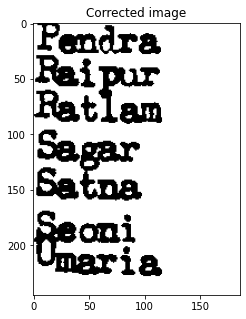

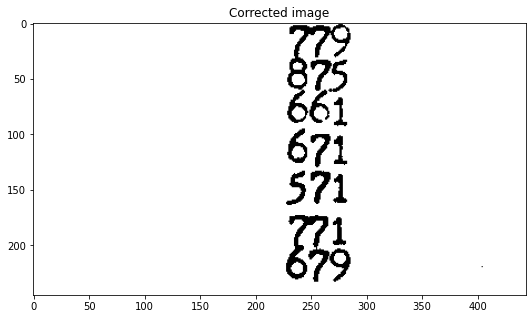

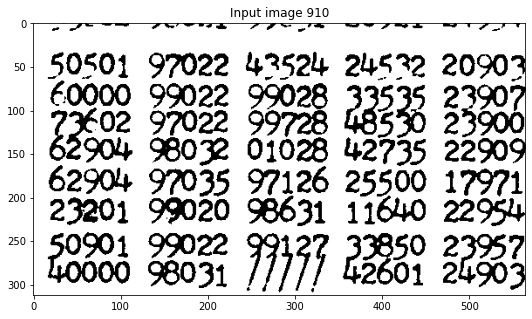

x [1046, 910, 1611, 1222, 0, [[753, 911], [[342, 910, 1041, 1227, 0], [1863, 910, 2462, 1227, 0]]], [1, 0, 1, 1]] [942, 1222] 231.31578947368422
y [1046, 910, 1611, 1222, 0, [[753, 911], [[342, 910, 1041, 1227, 0], [1863, 910, 2462, 1227, 0]]], [1, 0, 1, 1]] [1046, 1611] 228.0


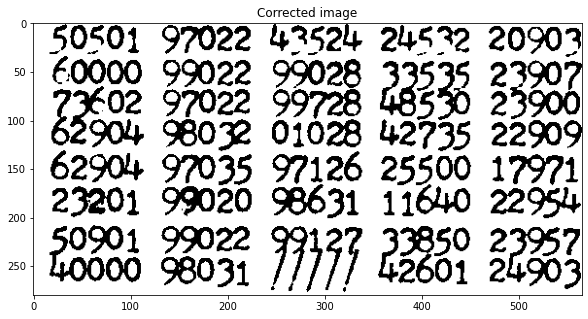

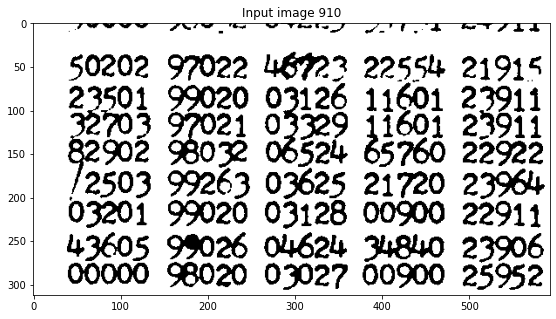

x [1868, 910, 2461, 1222, 0, [[753, 911], [[1041, 910, 1612, 1227, 0], [2462, 910, 2820, 1227, 0]]], [1, 0, 1, 1]] [980, 1222] 231.31578947368422
y [1868, 910, 2461, 1222, 0, [[753, 911], [[1041, 910, 1612, 1227, 0], [2462, 910, 2820, 1227, 0]]], [1, 0, 1, 1]] [1868, 2461] 228.0


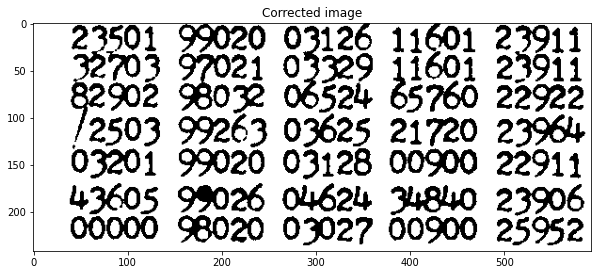

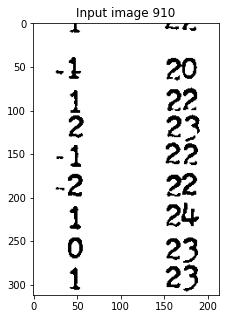

x [2825, 910, 3038, 1222, 0, [[753, 911], [[2462, 910, 2820, 1227, 0], [3659, 910, 3932, 1227, 0]]], [1, 0, 1, 1]] [909, 1219] 231.31578947368422
y [2825, 910, 3038, 1222, 0, [[753, 911], [[2462, 910, 2820, 1227, 0], [3659, 910, 3932, 1227, 0]]], [1, 0, 1, 1]] [2825, 3038] 228.0


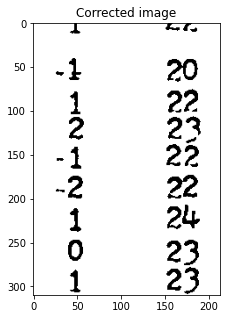

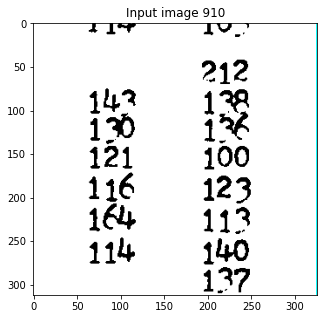

x [3664, 910, 3990, 1222, 0, [[753, 911], []], [1, 0, 5, 1]] [1049, 1222] 231.31578947368422
y [3664, 910, 3990, 1222, 0, [[753, 911], []], [1, 0, 5, 1]] [3664, 3990] 228.0


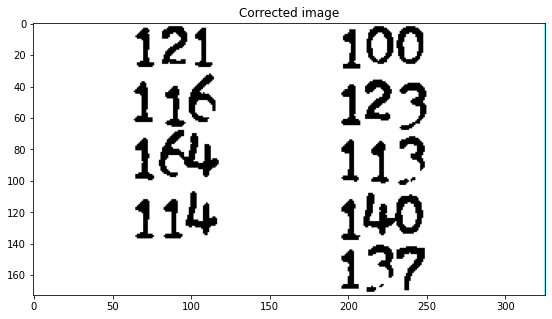

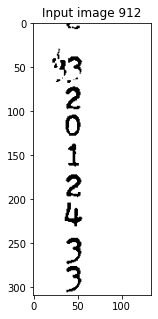

x [3053, 912, 3187, 1221, 0, [[910, 1791], []], [1, 1, 1, 1]] [912, 1221] 231.31578947368422
y [3053, 912, 3187, 1221, 0, [[910, 1791], []], [1, 1, 1, 1]] [3053, 3187] 228.0


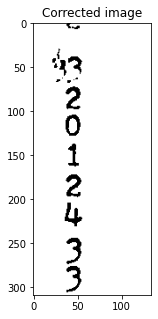

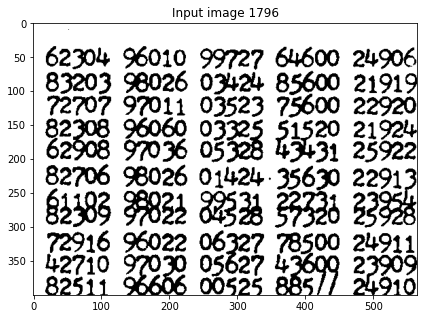

x [1046, 1796, 1611, 2196, 0, [[911, 1792], [[1863, 1791, 2462, 2196, 0]]], [1, 1, 1, 0]] [1829, 2196] 231.31578947368422
y [1046, 1796, 1611, 2196, 0, [[911, 1792], [[1863, 1791, 2462, 2196, 0]]], [1, 1, 1, 0]] [1046, 1611] 228.0


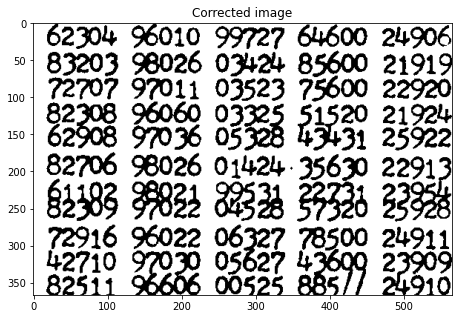

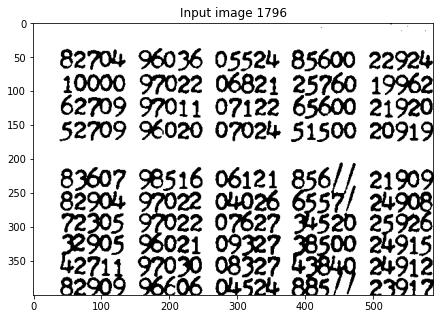

x [1868, 1796, 2457, 2196, 0, [[911, 1792], [[1041, 1791, 1612, 2196, 0], [2820, 1791, 3043, 2196, 0]]], [1, 1, 1, 0]] [1796, 2196] 231.31578947368422
y [1868, 1796, 2457, 2196, 0, [[911, 1792], [[1041, 1791, 1612, 2196, 0], [2820, 1791, 3043, 2196, 0]]], [1, 1, 1, 0]] [1868, 2457] 228.0


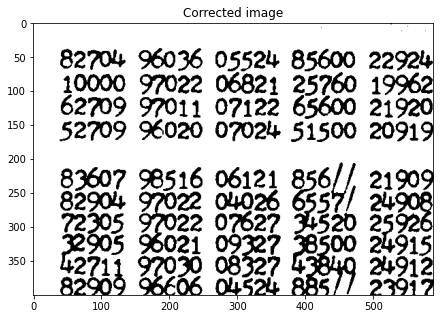

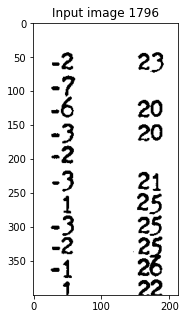

x [2825, 1796, 3038, 2196, 0, [[911, 1792], [[1863, 1791, 2462, 2196, 0], [3393, 1791, 3659, 2196, 0]]], [1, 1, 1, 0]] [1796, 2196] 231.31578947368422
y [2825, 1796, 3038, 2196, 0, [[911, 1792], [[1863, 1791, 2462, 2196, 0], [3393, 1791, 3659, 2196, 0]]], [1, 1, 1, 0]] [2825, 3038] 228.0


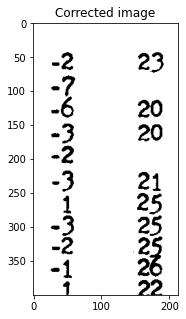

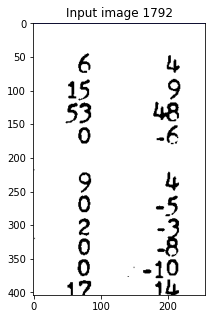

x [3398, 1792, 3654, 2196, 0, [[911, 1792], [[2820, 1791, 3043, 2196, 0], [3659, 1791, 3932, 2196, 0]]], [1, 1, 1, 0]] [1792, 2196] 231.31578947368422
y [3398, 1792, 3654, 2196, 0, [[911, 1792], [[2820, 1791, 3043, 2196, 0], [3659, 1791, 3932, 2196, 0]]], [1, 1, 1, 0]] [3486, 3654] 228.0


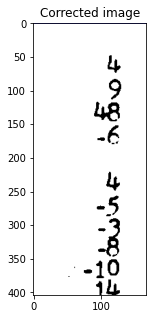

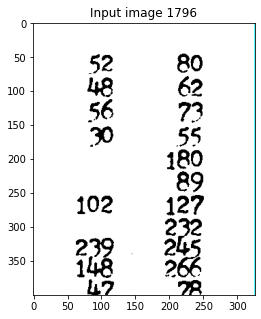

x [3664, 1796, 3990, 2196, 0, [[911, 1792], []], [1, 1, 5, 0]] [1796, 2196] 231.31578947368422
y [3664, 1796, 3990, 2196, 0, [[911, 1792], []], [1, 1, 5, 0]] [3664, 3990] 228.0


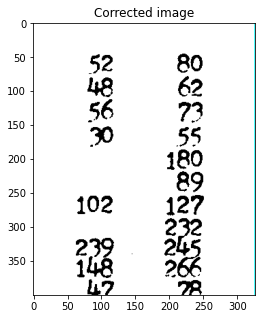

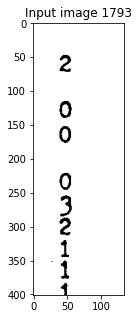

x [3053, 1793, 3187, 2194, 0, [[1791, 1796], []], [1, 1, 1, 1]] [1793, 2194] 231.31578947368422
y [3053, 1793, 3187, 2194, 0, [[1791, 1796], []], [1, 1, 1, 1]] [3053, 3187] 228.0


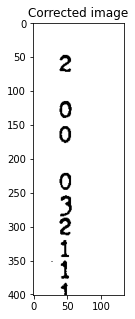

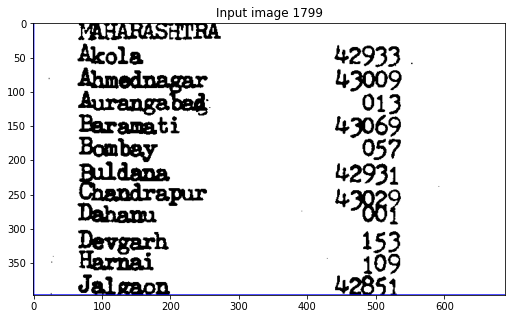

x [342, 1799, 1031, 2196, 0, [[1792, 2196], []], [5, 1, 1, 0]] [1899, 2196] 231.31578947368422
y [342, 1799, 1031, 2196, 0, [[1792, 2196], []], [5, 1, 1, 0]] [406, 617, 780, 1031] 228.0


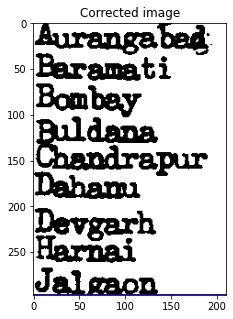

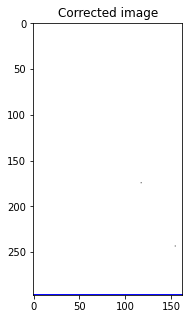

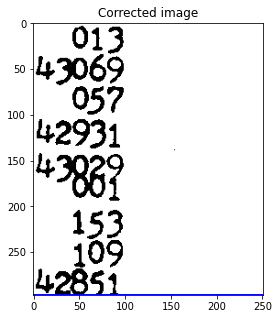

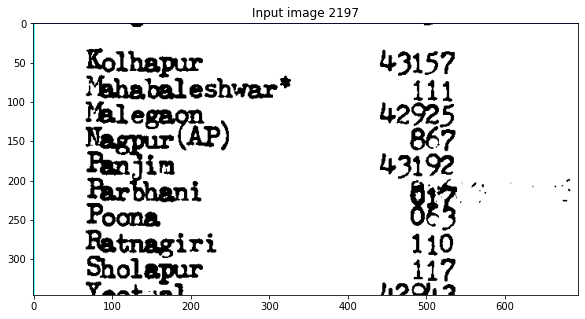

x [342, 2197, 1036, 2543, 0, [[1796, 2197], [[1041, 2196, 1612, 2543, 0]]], [5, 1, 1, 0]] [2197, 2543] 231.31578947368422
y [342, 2197, 1036, 2543, 0, [[1796, 2197], [[1041, 2196, 1612, 2543, 0]]], [5, 1, 1, 0]] [407, 627, 900] 228.0


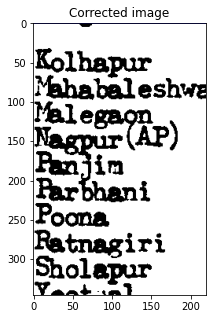

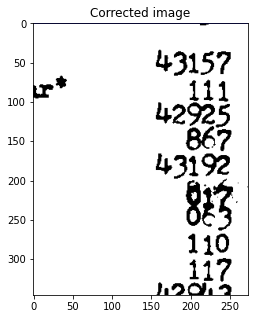

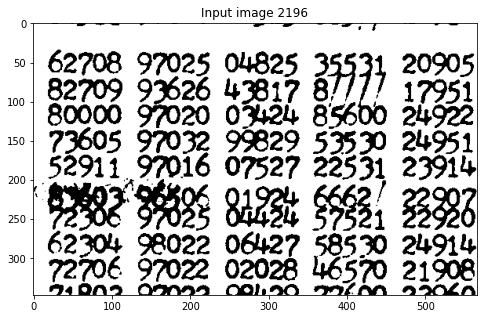

x [1046, 2196, 1612, 2543, 0, [[1796, 2197], [[342, 2196, 1041, 2543, 0], [1612, 2196, 1863, 2543, 0]]], [1, 0, 0, 0]] [2196, 2543] 231.31578947368422
y [1046, 2196, 1612, 2543, 0, [[1796, 2197], [[342, 2196, 1041, 2543, 0], [1612, 2196, 1863, 2543, 0]]], [1, 0, 0, 0]] [1046, 1612] 228.0


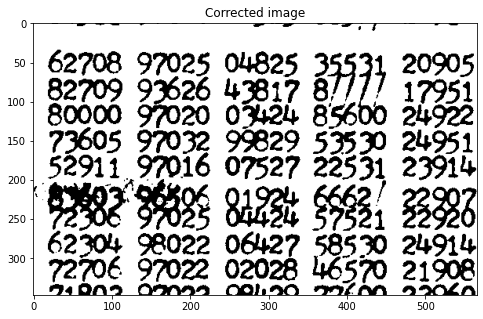

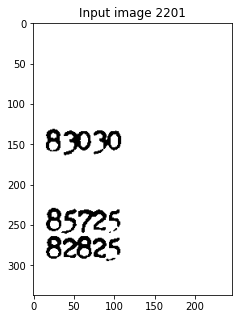

x [1612, 2201, 1858, 2538, 0, [[1796, 2197], [[1041, 2196, 1612, 2543, 0], [1863, 2196, 2462, 2543, 0]]], [0, 1, 1, 1]] [2201, 2538] 231.31578947368422
y [1612, 2201, 1858, 2538, 0, [[1796, 2197], [[1041, 2196, 1612, 2543, 0], [1863, 2196, 2462, 2543, 0]]], [0, 1, 1, 1]] [1611, 1858] 228.0


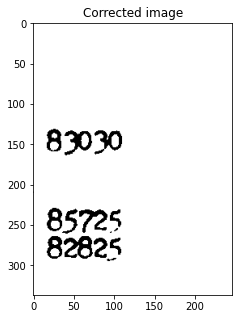

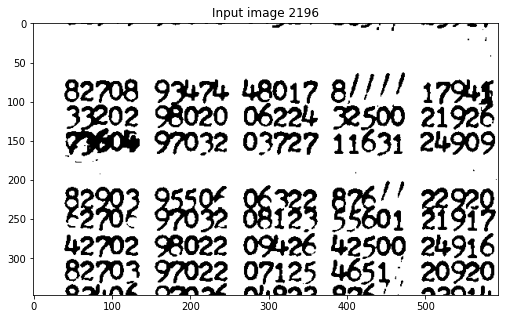

x [1868, 2196, 2462, 2543, 0, [[1796, 2197], [[1612, 2196, 1863, 2543, 0], [2462, 2196, 2820, 2543, 0]]], [1, 0, 0, 0]] [2265, 2543] 231.31578947368422
y [1868, 2196, 2462, 2543, 0, [[1796, 2197], [[1612, 2196, 1863, 2543, 0], [2462, 2196, 2820, 2543, 0]]], [1, 0, 0, 0]] [1868, 2462] 228.0


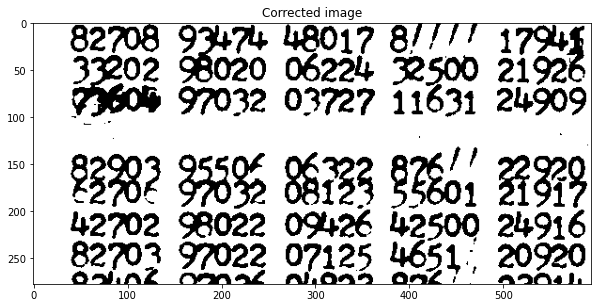

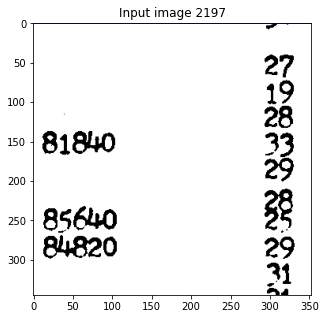

x [2462, 2197, 2815, 2542, 0, [[1796, 2197], [[1863, 2196, 2462, 2543, 0], [2820, 2196, 3043, 2543, 0]]], [0, 1, 1, 1]] [2197, 2542] 231.31578947368422
y [2462, 2197, 2815, 2542, 0, [[1796, 2197], [[1863, 2196, 2462, 2543, 0], [2820, 2196, 3043, 2543, 0]]], [0, 1, 1, 1]] [2461, 2815] 228.0


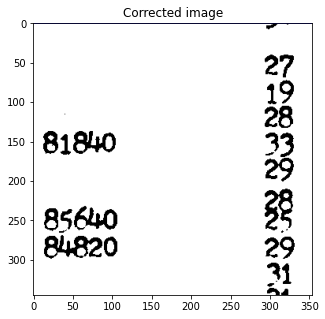

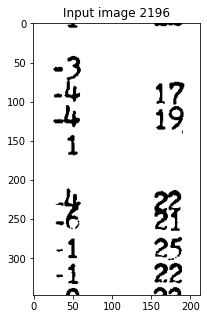

x [2825, 2196, 3038, 2543, 0, [[1796, 2197], [[2462, 2196, 2820, 2543, 0], [3393, 2196, 3659, 2543, 0]]], [1, 0, 1, 0]] [2196, 2543] 231.31578947368422
y [2825, 2196, 3038, 2543, 0, [[1796, 2197], [[2462, 2196, 2820, 2543, 0], [3393, 2196, 3659, 2543, 0]]], [1, 0, 1, 0]] [2825, 3038] 228.0


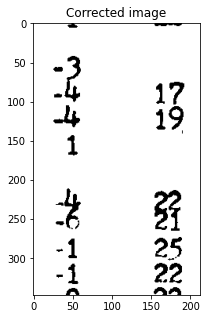

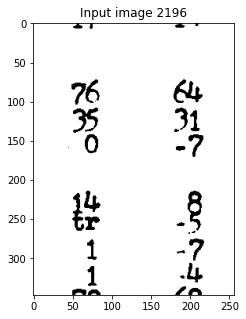

x [3398, 2196, 3654, 2543, 0, [[1796, 2197], [[2820, 2196, 3043, 2543, 0], [3659, 2196, 3932, 2543, 0]]], [1, 0, 1, 0]] [2196, 2543] 231.31578947368422
y [3398, 2196, 3654, 2543, 0, [[1796, 2197], [[2820, 2196, 3043, 2543, 0], [3659, 2196, 3932, 2543, 0]]], [1, 0, 1, 0]] [3484, 3654] 228.0


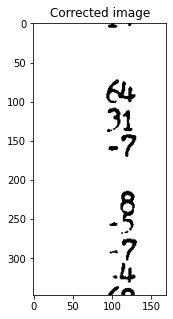

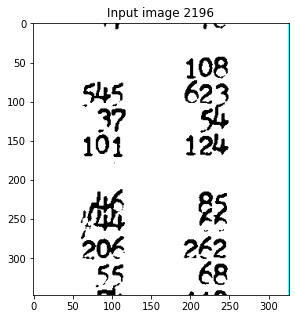

x [3664, 2196, 3990, 2543, 0, [[1796, 2197], []], [1, 0, 5, 0]] [2238, 2543] 231.31578947368422
y [3664, 2196, 3990, 2543, 0, [[1796, 2197], []], [1, 0, 5, 0]] [3664, 3990] 228.0


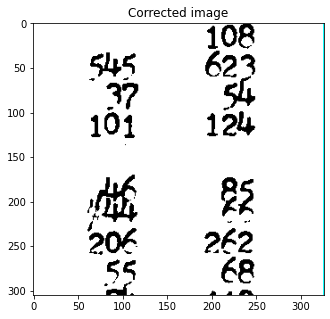

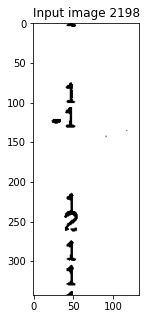

x [3053, 2198, 3187, 2541, 0, [[2196, 2543], []], [1, 1, 1, 1]] [2198, 2541] 231.31578947368422
y [3053, 2198, 3187, 2541, 0, [[2196, 2543], []], [1, 1, 1, 1]] [3053, 3187] 228.0


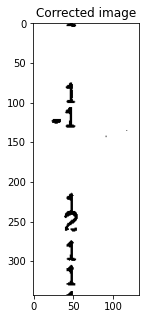

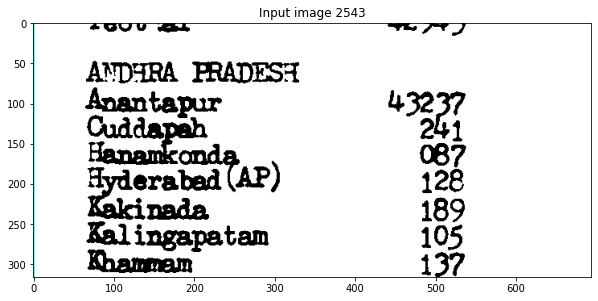

x [342, 2543, 1036, 2859, 0, [[2197, 2544], [[1041, 2543, 1612, 2864, 0]]], [5, 0, 1, 1]] [2628, 2859] 231.31578947368422
y [342, 2543, 1036, 2859, 0, [[2197, 2544], [[1041, 2543, 1612, 2864, 0]]], [5, 0, 1, 1]] [408, 677, 882] 228.0


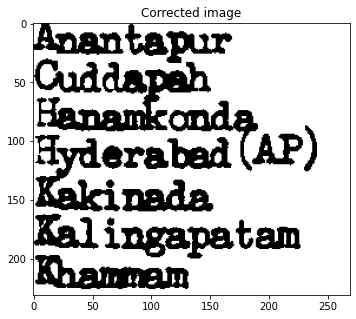

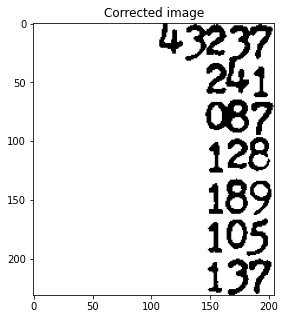

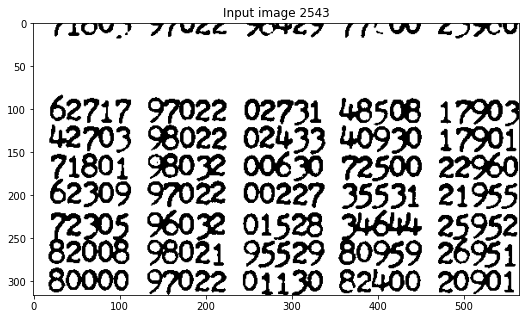

x [1046, 2543, 1611, 2859, 0, [[2197, 2544], [[342, 2543, 1041, 2864, 0], [1612, 2543, 1863, 2864, 0]]], [1, 0, 1, 1]] [2628, 2859] 231.31578947368422
y [1046, 2543, 1611, 2859, 0, [[2197, 2544], [[342, 2543, 1041, 2864, 0], [1612, 2543, 1863, 2864, 0]]], [1, 0, 1, 1]] [1046, 1611] 228.0


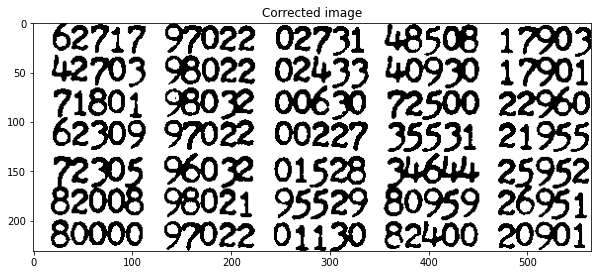

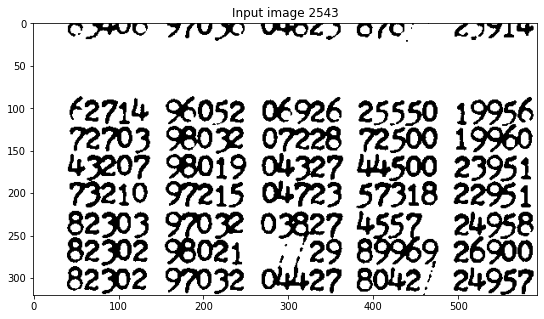

x [1868, 2543, 2461, 2863, 0, [[2197, 2544], [[1612, 2543, 1863, 2864, 0], [2462, 2543, 2820, 2864, 0]]], [1, 0, 1, 1]] [2543, 2863] 231.31578947368422
y [1868, 2543, 2461, 2863, 0, [[2197, 2544], [[1612, 2543, 1863, 2864, 0], [2462, 2543, 2820, 2864, 0]]], [1, 0, 1, 1]] [1868, 2461] 228.0


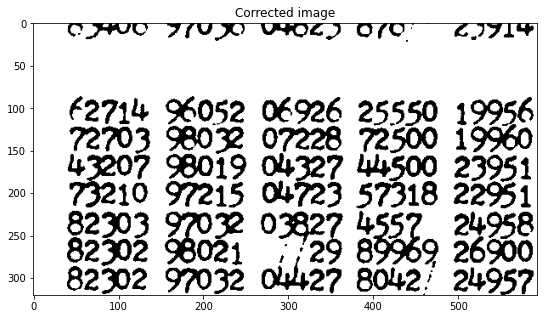

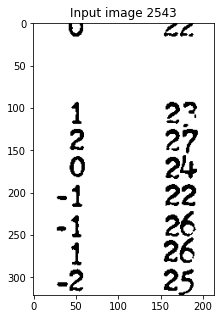

x [2825, 2543, 3038, 2864, 0, [[2197, 2544], [[2462, 2543, 2820, 2864, 0], [3393, 2543, 3659, 2864, 0]]], [1, 0, 1, 0]] [2543, 2864] 231.31578947368422
y [2825, 2543, 3038, 2864, 0, [[2197, 2544], [[2462, 2543, 2820, 2864, 0], [3393, 2543, 3659, 2864, 0]]], [1, 0, 1, 0]] [2825, 3038] 228.0


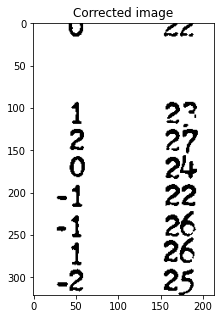

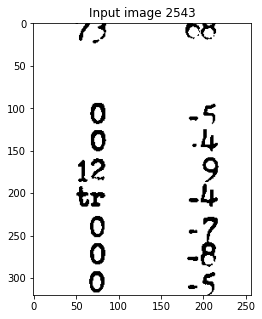

x [3398, 2543, 3654, 2863, 0, [[2197, 2544], [[2820, 2543, 3043, 2864, 0], [3659, 2543, 3932, 2864, 0]]], [1, 0, 1, 1]] [2543, 2863] 231.31578947368422
y [3398, 2543, 3654, 2863, 0, [[2197, 2544], [[2820, 2543, 3043, 2864, 0], [3659, 2543, 3932, 2864, 0]]], [1, 0, 1, 1]] [3485, 3654] 228.0


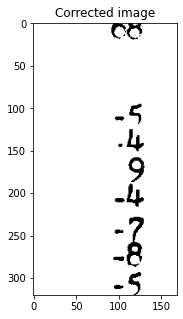

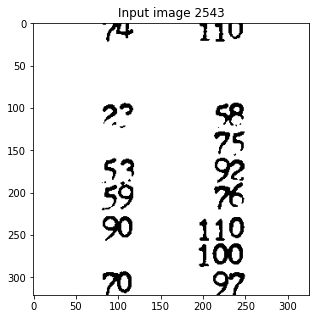

x [3664, 2543, 3990, 2864, 0, [[2197, 2544], []], [1, 0, 5, 0]] [2543, 2864] 231.31578947368422
y [3664, 2543, 3990, 2864, 0, [[2197, 2544], []], [1, 0, 5, 0]] [3664, 3990] 228.0


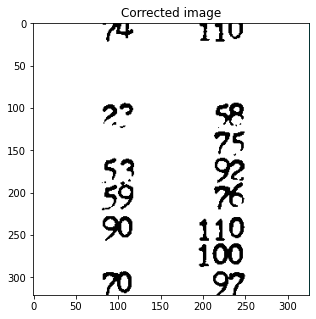

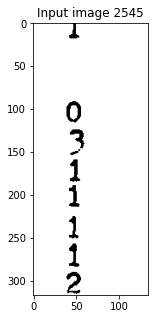

x [3053, 2545, 3187, 2862, 0, [[2543, 2864], []], [1, 1, 1, 1]] [2545, 2862] 231.31578947368422
y [3053, 2545, 3187, 2862, 0, [[2543, 2864], []], [1, 1, 1, 1]] [3053, 3187] 228.0


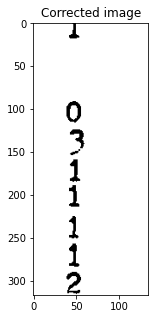

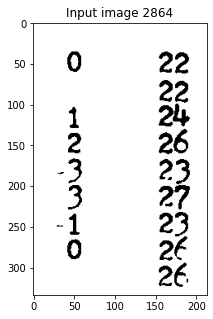

x [2825, 2864, 3038, 3198, 0, [[2544, 2865], [[3659, 2864, 3932, 3203, 0]]], [1, 0, 1, 1]] [2863, 3189] 231.31578947368422
y [2825, 2864, 3038, 3198, 0, [[2544, 2865], [[3659, 2864, 3932, 3203, 0]]], [1, 0, 1, 1]] [2825, 3038] 228.0


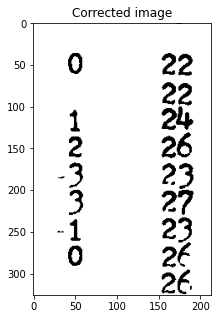

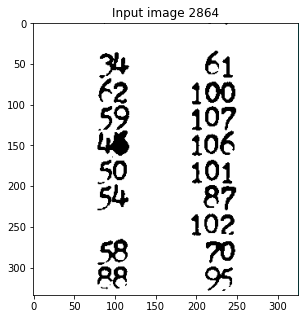

x [3664, 2864, 3990, 3198, 0, [[2544, 2865], []], [1, 0, 5, 1]] [2863, 3197] 231.31578947368422
y [3664, 2864, 3990, 3198, 0, [[2544, 2865], []], [1, 0, 5, 1]] [3664, 3990] 228.0


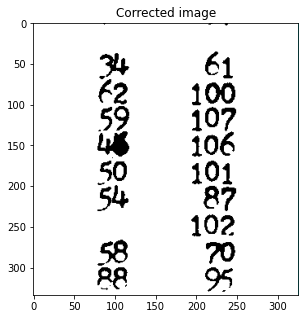

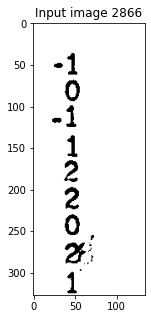

x [3053, 2866, 3187, 3193, 0, [[2864, 3203], []], [1, 1, 1, 1]] [2865, 3192] 231.31578947368422
y [3053, 2866, 3187, 3193, 0, [[2864, 3203], []], [1, 1, 1, 1]] [3053, 3187] 228.0


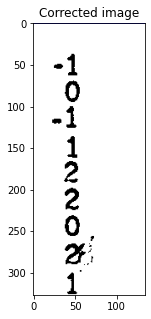

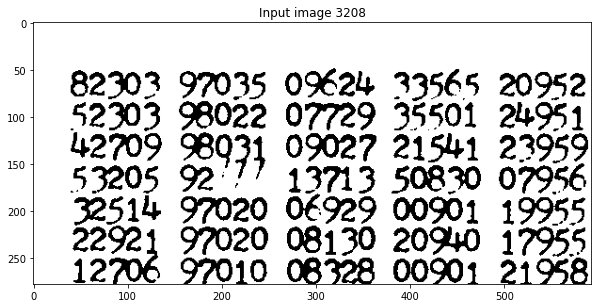

x [1868, 3208, 2461, 3486, 0, [[2865, 3208], [[2820, 3203, 3043, 3486, 0]]], [1, 1, 1, 0]] [3208, 3486] 231.31578947368422
y [1868, 3208, 2461, 3486, 0, [[2865, 3208], [[2820, 3203, 3043, 3486, 0]]], [1, 1, 1, 0]] [1868, 2461] 228.0


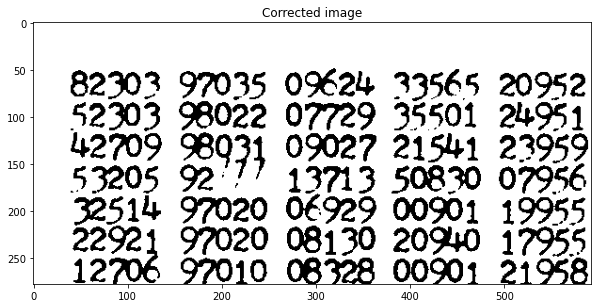

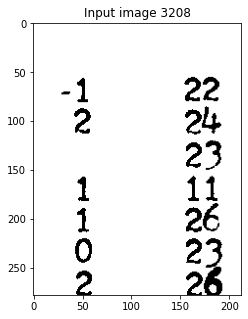

x [2825, 3208, 3038, 3486, 0, [[2865, 3208], [[1863, 3203, 2462, 3486, 0], [3659, 3203, 3932, 3486, 0]]], [1, 1, 1, 0]] [3208, 3486] 231.31578947368422
y [2825, 3208, 3038, 3486, 0, [[2865, 3208], [[1863, 3203, 2462, 3486, 0], [3659, 3203, 3932, 3486, 0]]], [1, 1, 1, 0]] [2825, 3038] 228.0


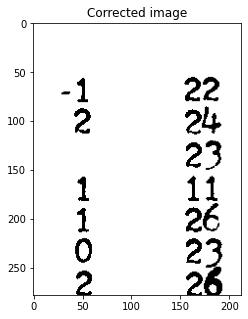

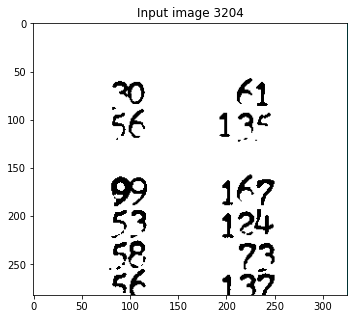

x [3664, 3204, 3990, 3486, 0, [[2865, 3208], []], [1, 1, 5, 0]] [3234, 3486] 231.31578947368422
y [3664, 3204, 3990, 3486, 0, [[2865, 3208], []], [1, 1, 5, 0]] [3664, 3990] 228.0


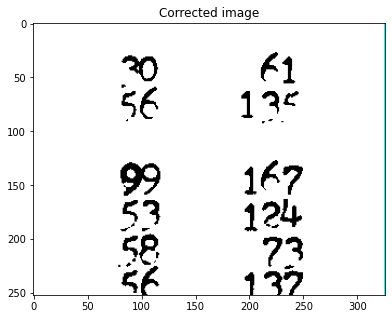

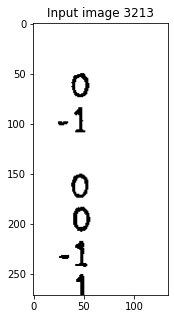

x [3053, 3213, 3187, 3484, 0, [[3203, 3486], []], [1, 1, 1, 1]] [3213, 3484] 231.31578947368422
y [3053, 3213, 3187, 3484, 0, [[3203, 3486], []], [1, 1, 1, 1]] [3053, 3187] 228.0


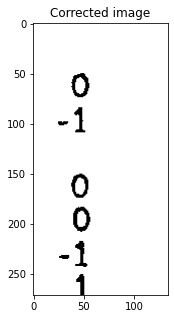

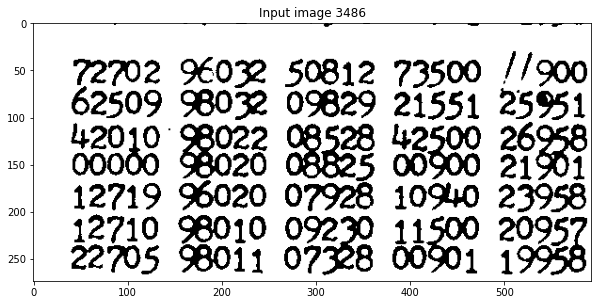

x [1868, 3486, 2461, 3760, 0, [[3208, 3487], [[2820, 3486, 3043, 3765, 0]]], [1, 0, 1, 1]] [3592, 3760] 231.31578947368422
y [1868, 3486, 2461, 3760, 0, [[3208, 3487], [[2820, 3486, 3043, 3765, 0]]], [1, 0, 1, 1]] [1868, 2461] 228.0


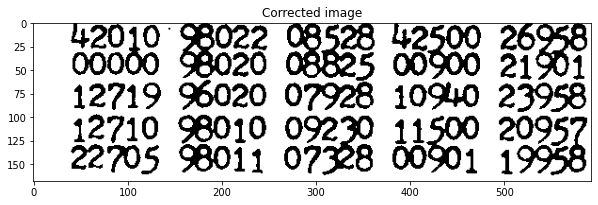

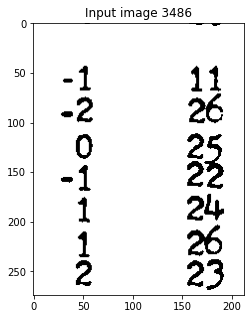

x [2825, 3486, 3038, 3760, 0, [[3208, 3487], [[1863, 3486, 2462, 3765, 0], [3659, 3486, 3932, 3765, 0]]], [1, 0, 1, 1]] [3485, 3756] 231.31578947368422
y [2825, 3486, 3038, 3760, 0, [[3208, 3487], [[1863, 3486, 2462, 3765, 0], [3659, 3486, 3932, 3765, 0]]], [1, 0, 1, 1]] [2825, 3038] 228.0


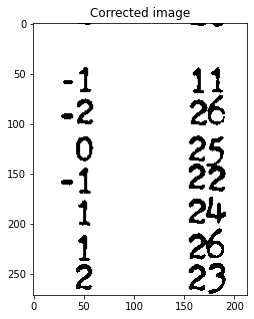

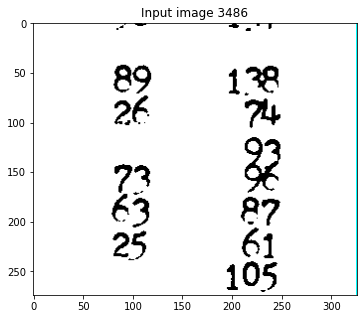

x [3664, 3486, 3990, 3760, 0, [[3208, 3487], []], [1, 0, 5, 1]] [3485, 3755] 231.31578947368422
y [3664, 3486, 3990, 3760, 0, [[3208, 3487], []], [1, 0, 5, 1]] [3664, 3990] 228.0


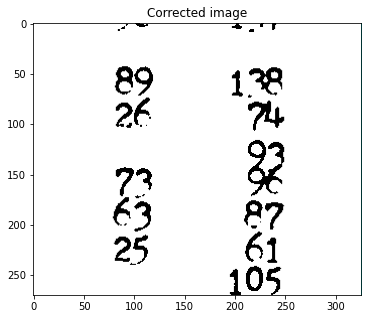

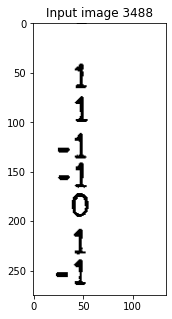

x [3053, 3488, 3187, 3763, 0, [[3486, 3765], []], [1, 1, 1, 1]] [3488, 3763] 231.31578947368422
y [3053, 3488, 3187, 3763, 0, [[3486, 3765], []], [1, 1, 1, 1]] [3053, 3187] 228.0


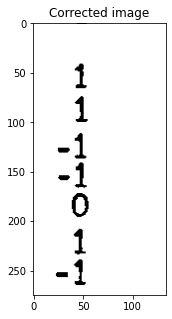

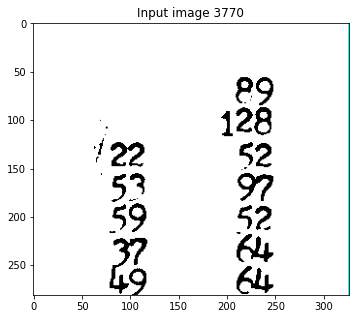

x [3664, 3770, 3990, 4051, 0, [[3487, 3766], []], [1, 1, 5, 0]] [3770, 4051] 231.31578947368422
y [3664, 3770, 3990, 4051, 0, [[3487, 3766], []], [1, 1, 5, 0]] [3664, 3990] 228.0


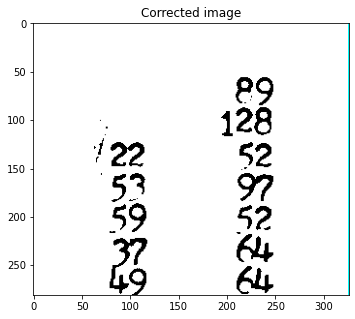

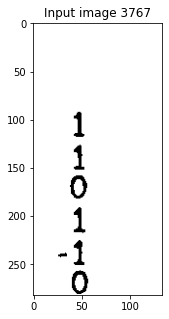

x [3053, 3767, 3187, 4049, 0, [[3765, 4051], []], [1, 1, 1, 1]] [3775, 4049] 231.31578947368422
y [3053, 3767, 3187, 4049, 0, [[3765, 4051], []], [1, 1, 1, 1]] [3053, 3187] 228.0


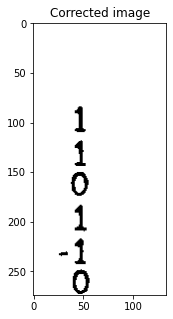

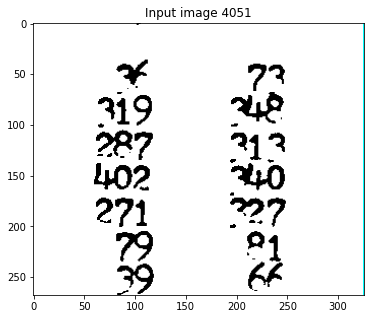

x [3664, 4051, 3990, 4319, 0, [[3766, 4052], []], [1, 0, 5, 1]] [4051, 4319] 231.31578947368422
y [3664, 4051, 3990, 4319, 0, [[3766, 4052], []], [1, 0, 5, 1]] [3664, 3990] 228.0


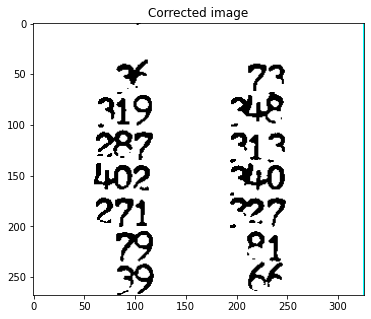

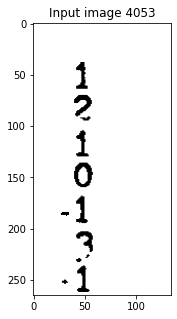

x [3053, 4053, 3187, 4318, 0, [[4051, 4320], []], [1, 1, 1, 1]] [4053, 4318] 231.31578947368422
y [3053, 4053, 3187, 4318, 0, [[4051, 4320], []], [1, 1, 1, 1]] [3053, 3187] 228.0


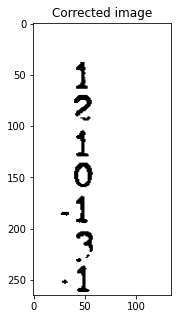

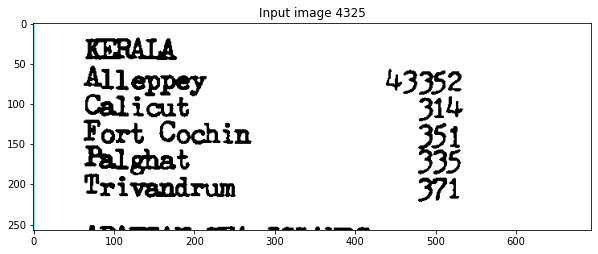

x [342, 4325, 1036, 4582, 0, [[4052, 4321], []], [5, 1, 1, 0]] [4325, 4582] 231.31578947368422
y [342, 4325, 1036, 4582, 0, [[4052, 4321], []], [5, 1, 1, 0]] [403, 615, 779, 1036] 228.0


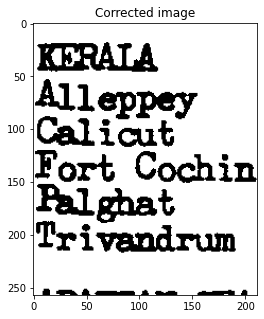

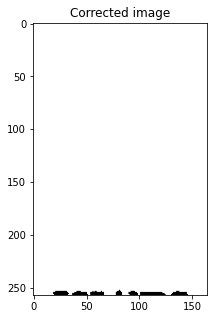

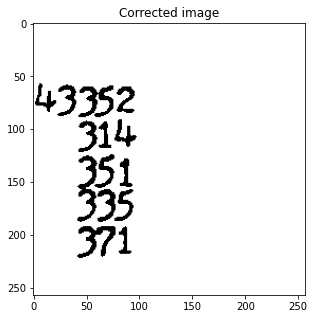

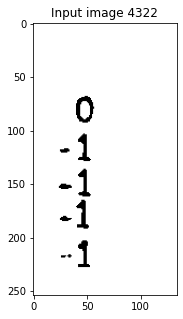

x [3053, 4322, 3187, 4576, 0, [[4320, 4582], []], [1, 1, 1, 1]] [4386, 4576] 231.31578947368422
y [3053, 4322, 3187, 4576, 0, [[4320, 4582], []], [1, 1, 1, 1]] [3053, 3187] 228.0


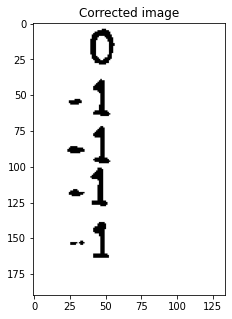

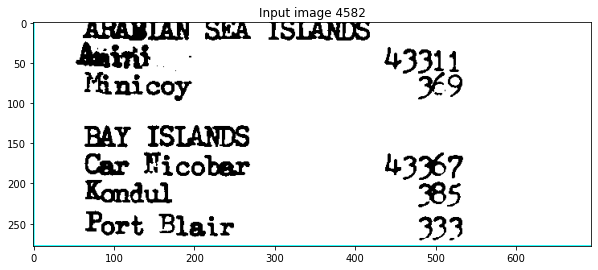

x [342, 4582, 1036, 4860, 0, [[], [[1041, 4582, 1612, 4860, 0]]], [5, 0, 1, 5]] [4582, 4860] 231.31578947368422
y [342, 4582, 1036, 4860, 0, [[], [[1041, 4582, 1612, 4860, 0]]], [5, 0, 1, 5]] [401, 770, 1036] 228.0


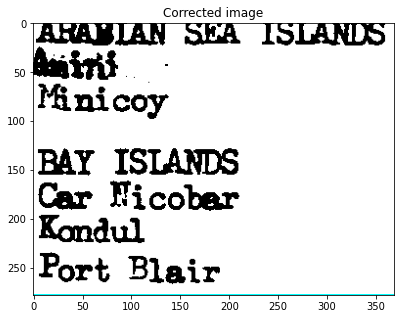

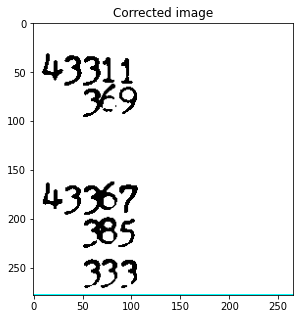

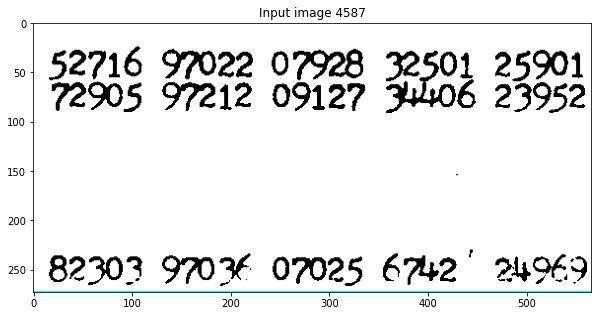

x [1046, 4587, 1612, 4860, 0, [[], [[342, 4582, 1041, 4860, 0], [1612, 4582, 1863, 4860, 0]]], [1, 1, 0, 5]] [4676, 4860] 231.31578947368422
y [1046, 4587, 1612, 4860, 0, [[], [[342, 4582, 1041, 4860, 0], [1612, 4582, 1863, 4860, 0]]], [1, 1, 0, 5]] [1046, 1612] 228.0


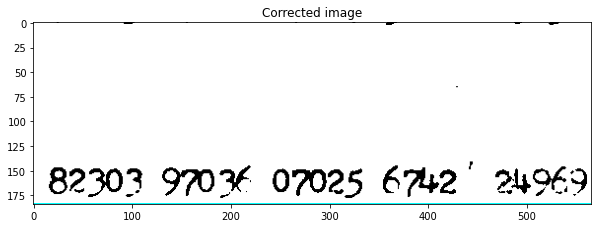

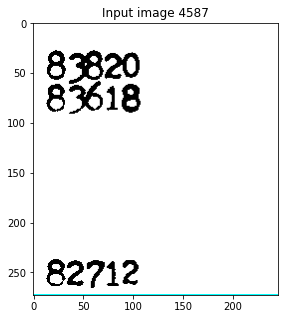

x [1612, 4587, 1858, 4860, 0, [[], [[1041, 4582, 1612, 4860, 0], [1863, 4582, 2462, 4860, 0]]], [0, 1, 1, 5]] [4677, 4860] 231.31578947368422
y [1612, 4587, 1858, 4860, 0, [[], [[1041, 4582, 1612, 4860, 0], [1863, 4582, 2462, 4860, 0]]], [0, 1, 1, 5]] [1611, 1858] 228.0


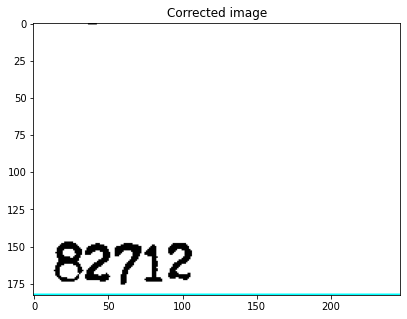

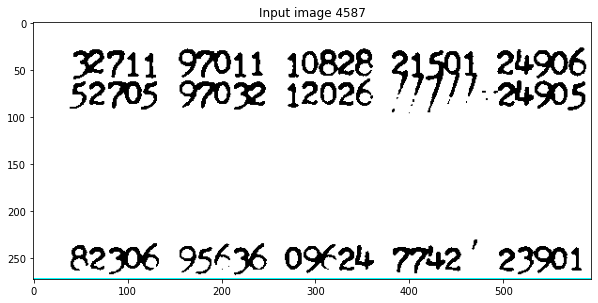

x [1868, 4587, 2462, 4860, 0, [[], [[1612, 4582, 1863, 4860, 0], [2462, 4582, 2820, 4860, 0]]], [1, 1, 0, 5]] [4680, 4860] 231.31578947368422
y [1868, 4587, 2462, 4860, 0, [[], [[1612, 4582, 1863, 4860, 0], [2462, 4582, 2820, 4860, 0]]], [1, 1, 0, 5]] [1868, 2462] 228.0


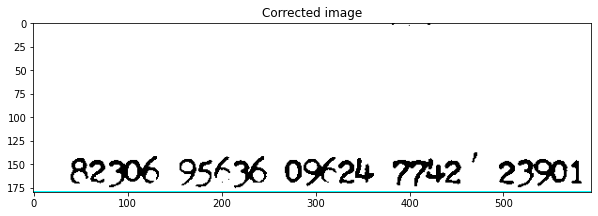

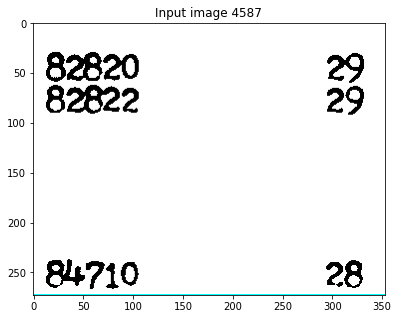

x [2462, 4587, 2815, 4860, 0, [[], [[1863, 4582, 2462, 4860, 0], [3659, 4582, 3932, 4860, 0]]], [0, 1, 1, 5]] [4680, 4860] 231.31578947368422
y [2462, 4587, 2815, 4860, 0, [[], [[1863, 4582, 2462, 4860, 0], [3659, 4582, 3932, 4860, 0]]], [0, 1, 1, 5]] [2461, 2815] 228.0


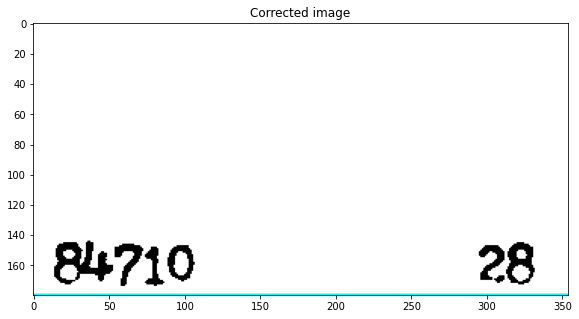

In [78]:
error_cells_corrected = []
for imagedraw in not_corrected_excluded_cells:#
    
    croppedimage_full=image[int(imagedraw[1]):int(imagedraw[3]),int(imagedraw[0]):int(imagedraw[2])]
    plt.rcParams["figure.figsize"] = (10,5)
    plt.imshow(croppedimage_full)
    plt.title(f'Input image {imagedraw[1]}')
    plt.show()
    
    possible_cells = segment_image(image, imagedraw, masks[1], average_cordinates)
    error_cells_corrected += possible_cells
    for cell in possible_cells:
        croppedimage_full=image[int(cell[1]):int(cell[3]),int(cell[0]):int(cell[2])]
        plt.rcParams["figure.figsize"] = (10,5)
        plt.imshow(croppedimage_full)
        plt.title(f'Corrected image')
        plt.show()
    

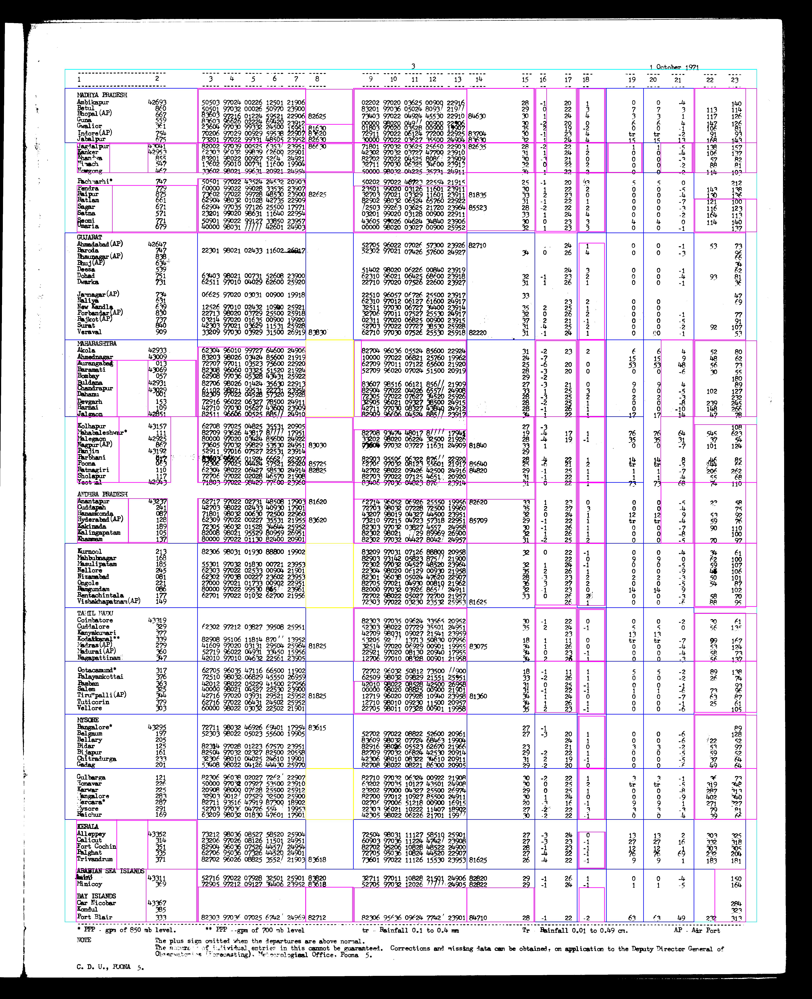

In [79]:
img = cv.imread("temp.jpg")
image, height, width, _ = image_preprocessing(img)

color = 255
for box in tables:
    box = list(map(int, box[0:4]))
    put_box(image,box,(0,color,color)) # Cyan 
    
for box in correct_cells:
    put_box(image,box,(0,0,color)) # Blue
    
for box in corrected_cells: #corrected_excluded_cells
    put_box(image,box,(0,color,0)) # Green

for box in new_corrected_cells:
    put_box(image,box,(color,0,color)) # pink
    
for box in error_cells_corrected:
#     print(box)
    put_box(image,box,(color,0,color))  # pink
    
for box in blank_cells:   
    put_box(image,box,(color,color,0)) # Yellow

im_pil = Image.fromarray(image)
im_pil.save(f"{filename}_temp_cell_multiple_cell_segmentation_correction.jpg")
im_pil  